# 2025.1111

This notebook analysis Hindcast results variation among 32 samples of w0 with EKF-RNN  
generated by the following program: 
- with Zonal terms, without LOD input:
    - `program_files/2025_1016_learn_derivatives_h34_s0-32_Zonal.py`
    - `program_files/2025_1028_learn_derivatives_h34_s0-32_Zonal_bw.py`
    - `program_files/2025_1030_learn_derivatives_h34_s29_Zonal_d3g.py`
    - `program_files/2025_1031_learn_derivatives_h34_s29_Zonal_d0g.py`
- omnly non-Zonal terms, without LOD input:
    - `program_files/2025_1018_learn_derivatives_h34_s0-32_nonZonal.py`
    - `program_files/2025_1029_learn_derivatives_h34_s0-32_nonZonal_bw.py`
- with LOD input:
    - `program_files/2025_1106_withLOD_h34_s0-32_nonZonal.py`
    - `program_files/2025_1108_withLOD_h34_s0-32_Zonal.py`

for SGEPSS.


Candidate model
- Number of hidden units : `Drec = 34`
- initial $\mathbf{w}_0$ : `seed = best / worst in "00000" - "11111"` (`seed = 29 "11101"` was for IGRF-14)
- Training method : EKF-RNN

`Data Period: MCM-2024 (2004.87〜2024.87)`

- Hindcast experiment (Minami et al., 2020)  
`Train Period: 2004.8739 - 2018.6247 (56 points, 14 yrs )`  
`Valid Period: 2018.8749 - 2023.6254 (20 points, 5 yrs )`  


In [1]:
import platform           # Python 3.9.16
import sys
import re

import numpy      as np   # Numpy 1.23.2
import pandas     as pd   # Pandas 2.0.3
import matplotlib as mpl  # Matplotlib 3.7.1
import seaborn    as sns  # Seaborn 0.12.2

from matplotlib.colors import BoundaryNorm
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt

np.set_printoptions(precision=5, floatmode='fixed', suppress=True)
pd.options.display.float_format = '{:.5f}'.format

%matplotlib inline
# print(plt.rcParams.keys())
plt.rcParams.update({
    'font.size'     : 16,
    'axes.grid'     : True,
    'grid.linestyle': '--',
    'lines.linewidth': 2,
})

print(f"Python Platform: {platform.platform()}")
print(f"    Python {sys.version}")
print(f"     Numpy {np.__version__}")
print(f"    Pandas {pd.__version__}")
print(f"Matplotlib {mpl.__version__}")
print(f"   Seaborn {sns.__version__}")

Python Platform: macOS-15.5-arm64-arm-64bit
    Python 3.9.22 | packaged by conda-forge | (main, Apr 14 2025, 23:36:04) 
[Clang 18.1.8 ]
     Numpy 1.23.2
    Pandas 2.1.4
Matplotlib 3.7.1
   Seaborn 0.12.2


In [2]:
### Configuration
mcm_load = "../MCM2024/processed/"

dt = 0.25 # Time step
# d_max = 0-4 # Order of the derivative

Drec = 34 # Dimension of the hidden layer

fS = 2018.8749 # forecast Start time
fE = 2023.6254 # forecast End   time

TS = 2014.1244 + 0.2502 # Jerk at 2015 Start time + leapfrog for SA time
TE = 2017.3739 + 0.2502 # Jerk at 2015 End   time + leapfrog for SA time

# font size
f_large  = 24
f_medium = 18
f_small  = 16
f_tiny   = 12

sig = 2 # Scale factor for the uncertainty plot (\pm s * sigma)

# Define functions


In [3]:
def get_energy(coef_array, time_array, gnames):
    energy_array = np.zeros((len(time_array), 14), dtype=float) # n==0 is for time

    for i, epoch in enumerate(time_array):
        #- print(epoch)
        energy_array[i, 0] = epoch

        for l, target in enumerate(gnames):
            n = int(target[2:].split(",")[0])

            energy_array[i, n] += (n+1) * coef_array[l, i] * coef_array[l, i]
    
    return energy_array.T

In [4]:
def draw_dP(dg_memo, dg_ref, dR_memo, time_memo, gnames, unit="nT"):
    ### get dP_n(t)

    dP2 = get_energy(dg_memo - dg_ref, time_memo, gnames).T

    # diagR = np.diagonal(dR_memo, axis1=0, axis2=1).T
    dQ2 = get_energy(dR_memo, time_memo, gnames).T

    dP2 = np.delete(dP2, [0], axis=1) # n==0 is time
    dQ2 = np.delete(dQ2, [0], axis=1)
    #- print(dP2)

    dP_df = pd.DataFrame(np.sqrt(dP2), index=time_memo, columns=range(1, 14))

    #- print(dP_df)


    fig, ax = plt.subplots(1, 2, figsize=(12, 9))

    sns.heatmap(dP_df, cmap='jet', norm=LogNorm(vmin=0.01, vmax=100), ax=ax[1])
    ax[1].set_xlabel('SH degree', fontsize=f_medium)
    ax[1].set_yticks(np.arange(1.5, len(time_memo), 4), time_memo[1::4], fontsize=f_tiny)
    ax[1].grid(False)

    dP2sum = np.sum(dP2, axis=1)
    dQ2sum = np.sum(dQ2, axis=1)
    ax[0].plot(np.sqrt(dP2sum), time_memo, c='k', label=r"sqrt(dP)")
    ax[0].plot(np.sqrt(dQ2sum), time_memo, c='k', label=r"sqrt(dQ)", linestyle='dashed')

    #- print(dPend)
    dPend = np.sqrt(dP2sum[-1])
    dQend = np.sqrt(dQ2sum[-1])
    ax[0].text(dPend, time_memo[-1], f"{dPend:.1f} {unit}  ", ha='right',  va='bottom', fontsize=f_large, color='red')
    ax[0].text(dQend, time_memo[-1], f"  {dQend:.1f} {unit}", ha='left',   va='bottom', fontsize=f_small, color='blue')


    ax[0].set_xscale('log')
    ax[0].set_xticks([0.01, 0.1, 1, 10, 100, 1000, 10000])
    ax[0].set_ylim(time_memo[-1], time_memo[0])
    ax[0].set_yticks(time_memo[1::4], time_memo[1::4], fontsize=f_tiny)
    ax[0].set_ylabel('Date (year)\n',                  fontsize=f_medium)

    fig.tight_layout()

    return fig, ax


In [5]:
def remove_zonal_g(g_raw, gname):
    g_nonZonal = g_raw.copy()
    cols_to_drop = []
    for l, col in enumerate(gname):
        # degree n, order m
        match = re.match(r'[gh]\((\d+),(\d+)\)', col)
        if match:
            n = int(match.group(1))
            m = int(match.group(2))
            # print(f"n={n}, m={m}")
            if m == 0:
                cols_to_drop.append(l)
                # print(f"Dropping column: {col}")
    g_nonZonal = np.delete(g_nonZonal, cols_to_drop, axis=0)
    c_nonZonal = [col for i, col in enumerate(gname) if i not in cols_to_drop]
    return g_nonZonal, c_nonZonal

In [6]:
def if_nan_SAgenerate(SA_memo, hindcast, diff):
    CF_time = hindcast['time_memo']
    
    if np.isnan(SA_memo[0, 50]):
        if diff == 0:
            print("  --> NaN found in SA_memo, generating SA from CF series...", end="\n")
            # Generate SA from CF series using finite difference
            CF_memo = hindcast['d0g_memo'] # RNN prediction of Core field
            for i, t in enumerate(CF_time):
                if i in [0, 1, 2]:
                    # print(f"i={i} skipped")
                    continue
                SA_memo[:, i] = (CF_memo[:, i] - 2 * CF_memo[:, i-1] + CF_memo[:, i-2]) / (dt * dt)
            
        elif diff == 1:
            print("  --> NaN found in SA_memo, generating SA from SV series...", end="\n")
            # Generate SA from SV series using finite difference
            SV_memo = hindcast['d1g_memo'] # RNN prediction of SV
            for i, t in enumerate(CF_time):
                if i in [0, 1]:
                    continue
                SA_memo[:, i] = (SV_memo[:, i] - SV_memo[:, i-1]) / dt
        
        else:
            print("  --> NaN found in SA_memo, cannot generate SA from higher derivative orders.", end="\n")
            raise ValueError("SA_memo contains NaN values and cannot be generated.")
        
        return SA_memo
    else:
        return SA_memo

In [7]:
### plot hidden layer output ht
def plot_ht(ht_memo, time_memo, color="black", fontsize=16, fig_ax=None):

    ht_size = ht_memo[:, 0].size

    height = 2.0
    bottom = -1 * height * np.arange(ht_size)

    if fig_ax is not None:
        fig, ax = fig_ax
    else:
        fig, ax = plt.subplots(1, 1, figsize=(12, 16))

    ymin = bottom[-1] - 0.8 * height
    ymax = bottom[0]  + 0.8 * height

    for l in range(ht_size):
        ht_l = ht_memo[l, :]
        ax.plot(time_memo, ht_l + bottom[l], 
                color=color, linewidth=2.0)

    ax.grid(True)
    ax.set_yticks(bottom)
    ax.set_yticklabels([f"$h_{{{l+1}}}$" for l in range(ht_size)], fontsize=fontsize)

    ax.set_ylim(ymin, ymax)
    ax.set_xlabel("Date (year)")
    ax.set_ylabel(r"Hidden Unit Activation")

    return fig, ax

# with Zonal terms, without LOD input

In [8]:
save_dir = "./trained_models/2025_1017_Zonal"
J = 195 # Number of Gauss coefficients up to degree n=13

## Load MCM model


In [9]:
d0g_raw = pd.read_csv(f"{mcm_load}/coef_g.csv")  
d1g_raw = pd.read_csv(f"{mcm_load}/coef_d1g.csv")
d2g_raw = pd.read_csv(f"{mcm_load}/coef_d2g.csv")

d0g_raw.set_index('YEAR', inplace=True)
d1g_raw.set_index('YEAR', inplace=True)
d2g_raw.set_index('YEAR', inplace=True)

d0R_raw = np.load(f"{mcm_load}/cvar_R.npy")  
d1R_raw = np.load(f"{mcm_load}/cvar_d1R.npy")
d2R_raw = np.load(f"{mcm_load}/cvar_d2R.npy")

display(d2g_raw.head())
print(d2R_raw[0:5,0:5, 0])
print(d2R_raw[0:5,0:5, 1])
print(d2R_raw[0:5,0:5, 2])
print(d2R_raw[0:5,0:5, 3])
print(d2R_raw[0:5,0:5, -1])

,"g(1,0)","g(1,1)","h(1,1)","g(2,0)","g(2,1)","h(2,1)","g(2,2)","h(2,2)","g(3,0)","g(3,1)",...,"g(18,14)","h(18,14)","g(18,15)","h(18,15)","g(18,16)","h(18,16)","g(18,17)","h(18,17)","g(18,18)","h(18,18)"
YEAR,,,,,,,,,,,,,,,,,,,,,
2004.87390,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005.12370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005.37390,-1.30880,2.22560,-0.89280,-0.17440,-0.08800,-0.74240,1.53120,0.15680,-0.06880,0.20320,...,-0.00160,-0.00000,-0.00000,-0.00000,0.00160,0.00000,0.00160,0.00000,0.00160,-0.00160
2005.62410,-0.00000,1.10080,-0.70560,0.47520,-0.55680,-0.27360,1.43360,0.30720,-0.10240,-0.53280,...,0.00160,0.00000,0.00000,0.00000,-0.00160,-0.00000,-0.00160,-0.00160,-0.00160,0.00160
2005.87420,-0.78560,1.80640,-1.30880,0.81440,-0.77440,-0.56000,2.16160,1.32000,0.09280,0.14880,...,-0.00160,-0.00000,-0.00160,-0.00160,0.00000,0.00160,0.00000,0.00160,0.00000,-0.00000


[[2004.87400        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]]
[[2005.12400        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]]
[[2005.37400        nan        nan        nan        nan]
 [       nan   36.30865   -0.34635   -0.11209    1.66008]
 [       nan   -0.34635   20.52914   -0.11124   -0.04573]
 [       nan   -0.11209   -0.11124   25.27605    0.14777]
 [       nan    1.66008   -0.04573    0.14777   18.48007]]
[[2005.62400        nan        nan        nan        nan]
 [       nan   36.29873   -0.34612   -0.11215    1.66007]
 [       na

In [10]:
coef_raw    = [d0g_raw.iloc[:, :J], d1g_raw.iloc[:, :J], d2g_raw.iloc[:, :J]]
Rmatrix_raw = [d0R_raw[:J+1, :J+1, :], d1R_raw[:J+1, :J+1, :], d2R_raw[:J+1, :J+1, :]]

col_raw = coef_raw[0].columns.tolist()
time_raw = coef_raw[0].index.values

print(col_raw)
print(time_raw)
print(d0R_raw[0, 0, :])

['g(1,0)', 'g(1,1)', 'h(1,1)', 'g(2,0)', 'g(2,1)', 'h(2,1)', 'g(2,2)', 'h(2,2)', 'g(3,0)', 'g(3,1)', 'h(3,1)', 'g(3,2)', 'h(3,2)', 'g(3,3)', 'h(3,3)', 'g(4,0)', 'g(4,1)', 'h(4,1)', 'g(4,2)', 'h(4,2)', 'g(4,3)', 'h(4,3)', 'g(4,4)', 'h(4,4)', 'g(5,0)', 'g(5,1)', 'h(5,1)', 'g(5,2)', 'h(5,2)', 'g(5,3)', 'h(5,3)', 'g(5,4)', 'h(5,4)', 'g(5,5)', 'h(5,5)', 'g(6,0)', 'g(6,1)', 'h(6,1)', 'g(6,2)', 'h(6,2)', 'g(6,3)', 'h(6,3)', 'g(6,4)', 'h(6,4)', 'g(6,5)', 'h(6,5)', 'g(6,6)', 'h(6,6)', 'g(7,0)', 'g(7,1)', 'h(7,1)', 'g(7,2)', 'h(7,2)', 'g(7,3)', 'h(7,3)', 'g(7,4)', 'h(7,4)', 'g(7,5)', 'h(7,5)', 'g(7,6)', 'h(7,6)', 'g(7,7)', 'h(7,7)', 'g(8,0)', 'g(8,1)', 'h(8,1)', 'g(8,2)', 'h(8,2)', 'g(8,3)', 'h(8,3)', 'g(8,4)', 'h(8,4)', 'g(8,5)', 'h(8,5)', 'g(8,6)', 'h(8,6)', 'g(8,7)', 'h(8,7)', 'g(8,8)', 'h(8,8)', 'g(9,0)', 'g(9,1)', 'h(9,1)', 'g(9,2)', 'h(9,2)', 'g(9,3)', 'h(9,3)', 'g(9,4)', 'h(9,4)', 'g(9,5)', 'h(9,5)', 'g(9,6)', 'h(9,6)', 'g(9,7)', 'h(9,7)', 'g(9,8)', 'h(9,8)', 'g(9,9)', 'h(9,9)', 'g(10,0)'

## Hindcast variation
`(diff, D_rec, b_seed) = (Variable, 34, Variable)`

In [11]:
print(f"target_epoch = {fE}")
CF_ref = coef_raw[0].loc[fE, :].values.reshape(-1, 1) # Reference CF at target_epoch
SV_ref = coef_raw[1].loc[fE, :].values.reshape(-1, 1) # Reference SV at target_epoch
SA_ref = coef_raw[2].loc[fE, :].values.reshape(-1, 1) # Reference SA at target_epoch
TG_ref = CF_ref # target field
print(TG_ref.shape, "\n", TG_ref[:5])

target_epoch = 2023.6254
(195, 1) 
 [[-29365.99850]
 [ -1424.07470]
 [  4574.62010]
 [ -2540.75120]
 [  2957.91840]]


In [12]:
test_memos = np.load(f".{save_dir}/d0g_{Drec}_11101_geomag_memos.npz", allow_pickle=True)
t_idx = np.where(test_memos['time_memo'] == fE)[0][0]

print("- g shape", test_memos['d0g_memo'].shape)
print("- R shape", test_memos['d0R_memo'].shape)
print("--------------")
print("- time_memo", test_memos['time_memo'])
print("- [tS_tE, fS, fE]", test_memos['tS_tE_fS_fE'])
print("- intended fS, fE:", fS, fE)
print((fS==test_memos['tS_tE_fS_fE'][2]), (fE==test_memos['tS_tE_fS_fE'][3]))
print("t_idx:", t_idx)
print("--------------")
print("- columns:", test_memos['columns'][:J])
print("- intended columns:", test_memos['columns'][:J] == col_raw)

- g shape (195, 76)
- R shape (195, 76)
--------------
- time_memo [2004.87390 2005.12370 2005.37390 2005.62410 2005.87420 2006.12440
 2006.37460 2006.62470 2006.87490 2007.12510 2007.37530 2007.62540
 2007.87560 2008.12540 2008.37490 2008.62440 2008.87390 2009.12370
 2009.37390 2009.62410 2009.87420 2010.12440 2010.37460 2010.62470
 2010.87490 2011.12510 2011.37530 2011.62540 2011.87560 2012.12540
 2012.37490 2012.62440 2012.87390 2013.12370 2013.37390 2013.62410
 2013.87420 2014.12440 2014.37460 2014.62470 2014.87490 2015.12510
 2015.37530 2015.62540 2015.87560 2016.12540 2016.37490 2016.62440
 2016.87390 2017.12370 2017.37390 2017.62410 2017.87420 2018.12440
 2018.37460 2018.62470 2018.87490 2019.12510 2019.37530 2019.62540
 2019.87560 2020.12540 2020.37490 2020.62440 2020.87390 2021.12370
 2021.37390 2021.62410 2021.87420 2022.12440 2022.37460 2022.62470
 2022.87490 2023.12510 2023.37530 2023.62540]
- [tS_tE, fS, fE] [2004.87390 2018.62470 2018.87490 2023.62540]
- intended fS, fE: 

In [13]:
print(test_memos['d0g_memo'][:5, t_idx-5:t_idx])
print(test_memos['d0R_memo'][:5, t_idx-5:t_idx])

[[-29438.32230 -29438.32230 -29438.32230 -29438.32230 -29438.32230]
 [ -1498.94323  -1498.94323  -1498.94323  -1498.94323  -1498.94323]
 [  4779.88976   4779.88976   4779.88976   4779.88976   4779.88976]
 [ -2452.23883  -2452.23883  -2452.23883  -2452.23883  -2452.23883]
 [  3007.47606   3007.47606   3007.47606   3007.47606   3007.47606]]
[[0.00121 0.00121 0.00121 0.00121 0.00121]
 [0.00070 0.00070 0.00070 0.00070 0.00070]
 [0.00085 0.00085 0.00085 0.00085 0.00085]
 [0.00063 0.00063 0.00063 0.00063 0.00063]
 [0.00030 0.00030 0.00030 0.00030 0.00030]]


In [14]:
### Compute ddP table
yZyZ_nLOD_CFddP = pd.DataFrame(index=np.arange(0, 5), columns=np.arange(0, 32), dtype=float)
for d_max in range(5):
    for seed in range(0, 32):
        b_seed = format(seed, '05b') # seed No. as 5-bit binary

        filename = f"d{d_max}g_{Drec}_{b_seed}_geomag_memos.npz"

        read_file = f".{save_dir}/{filename}"

        print(f"reading {(d_max, Drec, b_seed)}: ", end="")

        pred_memos = np.load(read_file, allow_pickle=True)
        print(f"loaded --> ", end="\n")
        
        CF_time = pred_memos['time_memo']   # time - leap frog
        CF_cols = pred_memos['columns'][:J] # target field columns

        SA_memo = pred_memos['d2g_memo'] # RNN prediction of SA
        SV_memo = pred_memos['d1g_memo'] # RNN prediction of SV
        CF_memo = pred_memos['d0g_memo'] # RNN prediction of Core field

        TG_memo = CF_memo # target field

        print(f"time={CF_time.shape}, shape={TG_memo.shape} --> ", end="")

        t_idx = np.where(CF_time == fE)[0][0]
        print(f"t_idx={t_idx} --> ", end="")

        TG_rnn = TG_memo[:, t_idx].reshape(-1, 1)
        error = TG_rnn - TG_ref

        print("error.shape: ", error.shape, len(CF_cols), "--> ", end="")
        
        ddP2 = get_energy(error, [CF_time[t_idx]], CF_cols)
        print("ddP2.shape", ddP2.shape, len(CF_cols), "--> ", end="")
        sqrtddP = np.sqrt(ddP2[1:, :].sum()) # exclude n==0 (time_series)

        print(f"sqrt(ddP)={sqrtddP:.4f} nT --> ", end="")
        yZyZ_nLOD_CFddP.loc[d_max, seed] = sqrtddP

        print("ddP table done", end="\n")


reading (0, 34, '00000'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (195, 1) 195 --> ddP2.shape (14, 1) 195 --> sqrt(ddP)=695.1625 nT --> ddP table done
reading (0, 34, '00001'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (195, 1) 195 --> ddP2.shape (14, 1) 195 --> sqrt(ddP)=695.1625 nT --> ddP table done
reading (0, 34, '00010'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (195, 1) 195 --> ddP2.shape (14, 1) 195 --> sqrt(ddP)=695.1625 nT --> ddP table done
reading (0, 34, '00011'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (195, 1) 195 --> ddP2.shape (14, 1) 195 --> sqrt(ddP)=695.1625 nT --> ddP table done
reading (0, 34, '00100'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (195, 1) 195 --> ddP2.shape (14, 1) 195 --> sqrt(ddP)=695.1625 nT --> ddP table done
reading (0, 34, '00101'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.s

In [15]:
### Compute ddQ (estimated error) table
yZyZ_nLOD_CFddQ = pd.DataFrame(index=np.arange(0, 5), columns=np.arange(0, 32), dtype=float)
for d_max in range(5):
    for seed in range(0, 32):
        b_seed = format(seed, '05b') # seed No. as 5-bit binary

        filename = f"d{d_max}g_{Drec}_{b_seed}_geomag_memos.npz"

        read_file = f".{save_dir}/{filename}"

        print(f"reading {(d_max, Drec, b_seed)}: ", end="")

        pred_memos = np.load(read_file, allow_pickle=True)
        print(f"loaded --> ", end="\n")
        
        CF_time = pred_memos['time_memo']   # time - leap frog
        CF_cols = pred_memos['columns'][:J] # target field columns

        TG_memo = pred_memos['d0R_memo'] # RNN prediction of Core field covariance

        print(f"time={CF_time.shape}, shape={TG_memo.shape} --> ", end="")

        t_idx = np.where(CF_time == fE)[0][0]
        print(f"t_idx={t_idx} --> ", end="")

        TG_rnn = TG_memo[:, t_idx].reshape(-1, 1)
        
        error = sig * np.sqrt(TG_rnn) # estimated std dev (s-sigma)
        print("error.shape: ", error.shape, len(CF_cols), "--> ", end="")
        
        ddP2 = get_energy(error, [CF_time[t_idx]], CF_cols)
        print("ddP2.shape", ddP2.shape, len(CF_cols), "--> ", end="")
        sqrtddP = np.sqrt(ddP2[1:, :].sum()) # exclude n==0 (time_series)

        print(f"sqrt(ddQ)={sqrtddP:.4f} nT --> ", end="")
        yZyZ_nLOD_CFddQ.loc[d_max, seed] = sqrtddP       ## store result

        print("ddQ table done", end="\n")


reading (0, 34, '00000'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (195, 1) 195 --> ddP2.shape (14, 1) 195 --> sqrt(ddQ)=0.3032 nT --> ddQ table done
reading (0, 34, '00001'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (195, 1) 195 --> ddP2.shape (14, 1) 195 --> sqrt(ddQ)=0.3032 nT --> ddQ table done
reading (0, 34, '00010'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (195, 1) 195 --> ddP2.shape (14, 1) 195 --> sqrt(ddQ)=0.3032 nT --> ddQ table done
reading (0, 34, '00011'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (195, 1) 195 --> ddP2.shape (14, 1) 195 --> sqrt(ddQ)=0.3032 nT --> ddQ table done
reading (0, 34, '00100'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (195, 1) 195 --> ddP2.shape (14, 1) 195 --> sqrt(ddQ)=0.3032 nT --> ddQ table done
reading (0, 34, '00101'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (19

In [16]:
### Compute ddP table
yZnZ_nLOD_CFddP = pd.DataFrame(index=np.arange(0, 5), columns=np.arange(0, 32), dtype=float)
for d_max in range(5):
    for seed in range(0, 32):
        b_seed = format(seed, '05b') # seed No. as 5-bit binary

        filename = f"d{d_max}g_{Drec}_{b_seed}_geomag_memos.npz"

        read_file = f".{save_dir}/{filename}"

        print(f"reading {(d_max, Drec, b_seed)}: ", end="")

        pred_memos = np.load(read_file, allow_pickle=True)
        print(f"loaded --> ", end="\n")
        
        CF_time = pred_memos['time_memo']   # time - leap frog
        CF_cols = pred_memos['columns'][:J] # target field columns

        SA_memo = pred_memos['d2g_memo'] # RNN prediction of SA
        SV_memo = pred_memos['d1g_memo'] # RNN prediction of SV
        CF_memo = pred_memos['d0g_memo'] # RNN prediction of Core field

        TG_memo = CF_memo # target field

        print(f"time={CF_time.shape}, shape={TG_memo.shape} --> ", end="")

        t_idx = np.where(CF_time == fE)[0][0]
        print(f"t_idx={t_idx} --> ", end="")

        TG_rnn = TG_memo[:, t_idx].reshape(-1, 1)
        error, CF_cols = remove_zonal_g(TG_rnn - TG_ref, CF_cols)
        print("error.shape: ", error.shape, len(CF_cols), "--> ", end="")
        
        ddP2 = get_energy(error, [CF_time[t_idx]], CF_cols)
        print("ddP2.shape", ddP2.shape, len(CF_cols), "--> ", end="")
        sqrtddP = np.sqrt(ddP2[1:, :].sum()) # exclude n==0 (time_series)

        print(f"sqrt(ddP)={sqrtddP:.4f} nT --> ", end="")
        yZnZ_nLOD_CFddP.loc[d_max, seed] = sqrtddP

        print("ddP table done", end="\n")


reading (0, 34, '00000'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (182, 1) 182 --> ddP2.shape (14, 1) 182 --> sqrt(ddP)=669.4944 nT --> ddP table done
reading (0, 34, '00001'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (182, 1) 182 --> ddP2.shape (14, 1) 182 --> sqrt(ddP)=669.4944 nT --> ddP table done
reading (0, 34, '00010'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (182, 1) 182 --> ddP2.shape (14, 1) 182 --> sqrt(ddP)=669.4944 nT --> ddP table done
reading (0, 34, '00011'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (182, 1) 182 --> ddP2.shape (14, 1) 182 --> sqrt(ddP)=669.4944 nT --> ddP table done
reading (0, 34, '00100'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.shape:  (182, 1) 182 --> ddP2.shape (14, 1) 182 --> sqrt(ddP)=669.4944 nT --> ddP table done
reading (0, 34, '00101'): loaded --> 
time=(76,), shape=(195, 76) --> t_idx=75 --> error.s

In [17]:
display(yZyZ_nLOD_CFddP.T)
display(yZyZ_nLOD_CFddP.T.describe())

,0,1,2,3,4
0,695.16246,71.48079,121.59464,154.15914,450.21337
1,695.16246,75.12026,118.53808,143.43485,487.32095
2,695.16246,70.75294,117.94146,153.97315,475.82942
3,695.16246,102.73827,110.36613,148.87556,465.20647
4,695.16246,70.79975,118.28031,147.35220,466.52649
5,695.16246,64.65102,117.41307,146.38107,453.07556
6,695.16246,70.73714,117.47591,145.57121,476.77787
7,695.16246,110.16188,117.05560,143.50350,456.22207
8,695.16246,109.80038,120.26897,145.58087,461.74383
9,695.16246,108.94239,116.18945,140.60215,450.45155


,0,1,2,3,4
count,32.00000,32.00000,32.00000,32.00000,32.00000
mean,695.16246,90.10611,117.57845,145.86253,465.14298
std,0.00000,21.05493,3.66762,4.51970,14.14397
min,695.16246,64.65102,104.75929,138.06570,436.22889
25%,695.16246,71.31053,116.16629,143.33635,454.02810
50%,695.16246,83.53487,117.81224,145.87001,465.80861
75%,695.16246,108.94239,120.28701,147.70118,476.34157
max,695.16246,156.90622,124.43594,155.40764,488.62709


In [18]:
display(yZyZ_nLOD_CFddQ.T)
display(yZyZ_nLOD_CFddQ.T.describe())

,0,1,2,3,4
0,0.30319,360.99990,194.20807,410.91533,457.97322
1,0.30319,5.89940,218.83485,395.46411,406.73988
2,0.30319,283.24078,238.50597,350.26639,356.34866
3,0.30319,482.45595,213.26070,400.79971,356.20152
4,0.30319,8.01705,187.37463,418.02015,365.43857
5,0.30319,38.84535,230.42305,384.23253,418.57529
6,0.30319,8.07501,248.41766,433.27260,352.10078
7,0.30319,2.27360,293.97943,379.04181,454.66844
8,0.30319,2.28223,184.70194,378.20943,520.43708
9,0.30319,2.30358,225.76635,420.51403,439.60726


,0,1,2,3,4
count,32.00000,32.00000,32.00000,32.00000,32.00000
mean,0.30319,101.10020,230.63021,388.90832,422.08680
std,0.00000,206.69251,30.51846,24.01105,50.06121
min,0.30319,2.27360,184.70194,343.60315,352.10078
25%,0.30319,2.30360,213.20122,376.85961,385.16214
50%,0.30319,4.76843,221.44095,392.89355,414.77364
75%,0.30319,16.13569,238.88556,406.81453,449.34190
max,0.30319,750.43654,319.53640,433.27260,538.31656


In [19]:
display(yZnZ_nLOD_CFddP.T)
display(yZnZ_nLOD_CFddP.T.describe())

,0,1,2,3,4
0,669.49439,67.32582,118.43511,152.19563,396.08069
1,669.49439,70.60225,115.14547,141.71077,438.23357
2,669.49439,65.19184,114.12247,151.45687,410.06354
3,669.49439,94.31232,107.01039,146.12138,413.25126
4,669.49439,65.99506,114.99988,144.45547,413.12021
5,669.49439,59.30132,113.71969,144.51943,398.48976
6,669.49439,65.92671,114.02092,142.59022,422.56064
7,669.49439,107.75045,113.39398,140.78670,406.49183
8,669.49439,107.37117,116.68645,143.18659,409.44990
9,669.49439,106.46085,112.96582,138.88459,401.66319


,0,1,2,3,4
count,32.00000,32.00000,32.00000,32.00000,32.00000
mean,669.49439,85.73910,114.08914,143.63957,409.27947
std,0.00000,20.82089,3.85313,4.50925,14.00712
min,669.49439,59.30132,100.02678,135.93100,381.10872
25%,669.49439,66.83776,112.89186,140.75246,401.61257
50%,669.49439,79.39449,114.36221,143.30915,407.97086
75%,669.49439,106.46111,116.70728,145.68888,418.78582
max,669.49439,141.48020,120.85310,153.60745,438.23357


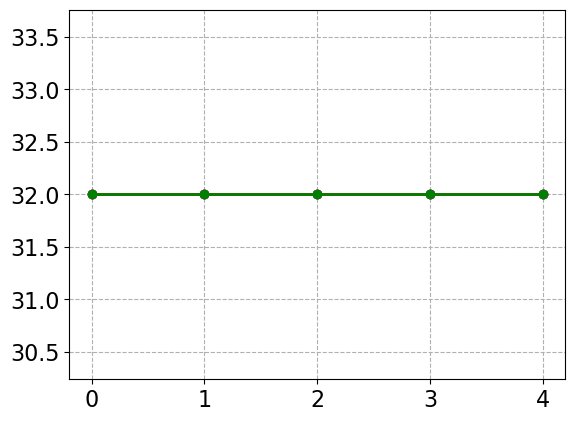

In [20]:
plt.plot(yZyZ_nLOD_CFddP.T.count(axis=0), "bo-")
plt.plot(yZnZ_nLOD_CFddP.T.count(axis=0), "ro-")
plt.plot(yZyZ_nLOD_CFddQ.T.count(axis=0), "go-")

['0 (00000)', '2 (00010)', '4 (00100)', '6 (00110)', '8 (01000)', '10 (01010)', '12 (01100)', '14 (01110)', '16 (10000)', '18 (10010)', '20 (10100)', '22 (10110)', '24 (11000)', '26 (11010)', '28 (11100)', '30 (11110)']


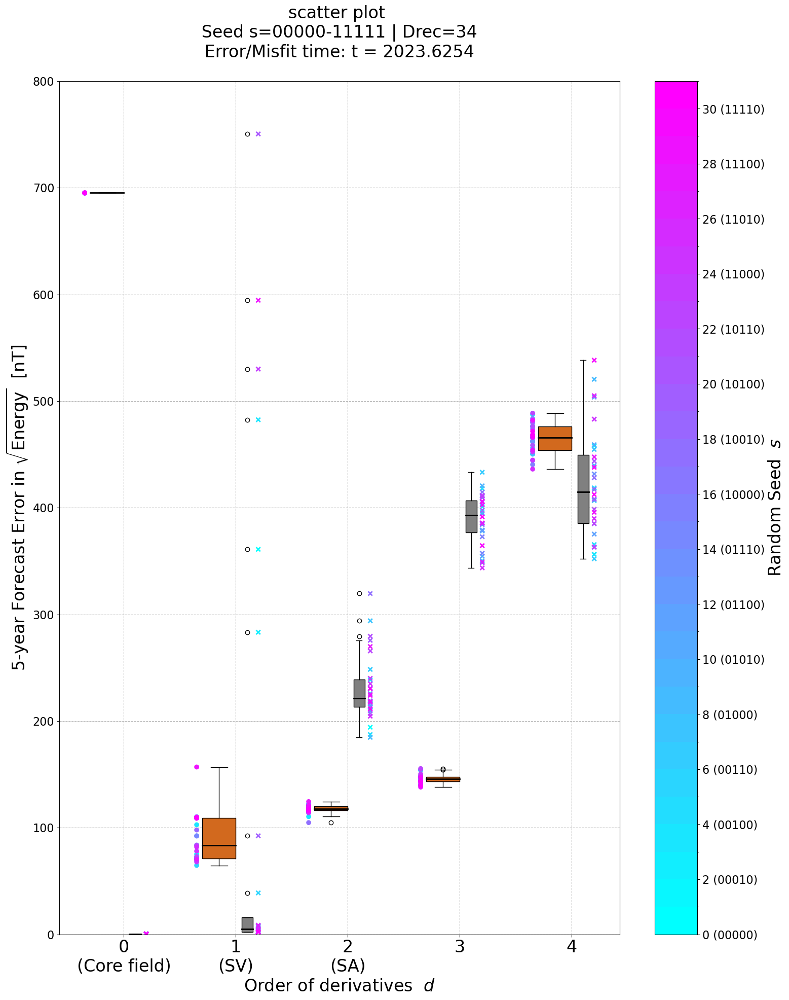

In [98]:
fig, ax = plt.subplots(1, 1, figsize=(16, 20))


plot_table = yZyZ_nLOD_CFddP
cmap = mpl.colormaps['cool']
norm = BoundaryNorm(plot_table.columns, cmap.N)
seed_l = plot_table.columns[0:31:2]
padding = 0.1
offset = 0.25
for d in range(5):
    ax.boxplot(plot_table.loc[d, :].values, positions=[d - offset + padding], 
               widths=0.3, patch_artist=True, manage_ticks=False,
               boxprops=dict(color="black", facecolor="chocolate"),
               medianprops=dict(color="black", linewidth=2.0),)
    p = ax.scatter([d - offset - padding]*32, plot_table.loc[d, :].values,
                   cmap=cmap, norm=norm, c=plot_table.columns, alpha=1.0,
                   marker="o", #edgecolors="black",
                   label=f"Derivatives={d}")


ax.colorbar = plt.colorbar(p, ax=ax)
ax.colorbar.set_label(r"Random Seed  $s$", fontsize=f_large)

print([f"{seed} ({format(seed, '05b')})" for seed in seed_l])
ax.colorbar.set_ticks                                                    (seed_l)
ax.colorbar.set_ticklabels([f"{seed} ({format(seed, '05b')})" for seed in seed_l])


plot_table = yZyZ_nLOD_CFddQ
padding = 0.05
offset = 0.15
for d in range(5):
    ax.boxplot(plot_table.loc[d, :].values, positions=[d + offset - padding], 
               widths=0.1, patch_artist=True, manage_ticks=False,
               boxprops=dict(color="black", facecolor="gray"),
               medianprops=dict(color="black", linewidth=2.0))
    p = ax.scatter([d + offset + padding]*32, plot_table.loc[d, :].values,
                   cmap=cmap, norm=norm, c=plot_table.columns, alpha=1.0,
                   marker="x", #edgecolors="black",
                   label=f"Derivatives={d}")

ax.set_xticks(range(5))
ax.set_xticklabels(["0\n(Core field)", "1\n(SV)", "2\n(SA)", "3", "4"], fontsize=f_large)
ax.set_ylim(0, 800)
# ax.set_yscale('log')
ax.set_xlabel(r"Order of derivatives  $d$", fontsize=f_large)
ax.set_ylabel(r"5-year Forecast Error in $\sqrt{\mathrm{Energy}}$  [nT]", fontsize=f_large)
ax.set_title(f"scatter plot \n Seed s=00000-11111 | Drec=34 \n Error/Misfit time: t = {fE} \n", fontsize=f_large)
plt.tight_layout()
plt.show()

['0 (00000)', '2 (00010)', '4 (00100)', '6 (00110)', '8 (01000)', '10 (01010)', '12 (01100)', '14 (01110)', '16 (10000)', '18 (10010)', '20 (10100)', '22 (10110)', '24 (11000)', '26 (11010)', '28 (11100)', '30 (11110)']


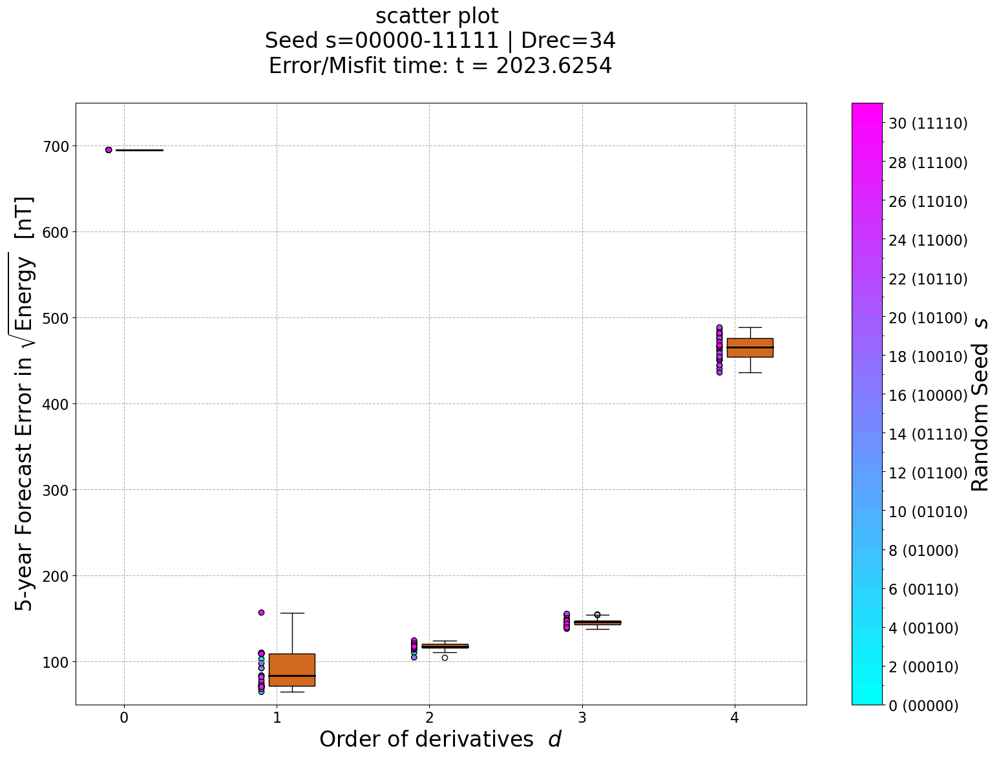

In [22]:
fig, ax = plt.subplots(1, 1, figsize=(16, 12))


plot_table = yZyZ_nLOD_CFddP
cmap = mpl.colormaps['cool']
norm = BoundaryNorm(plot_table.columns, cmap.N)
seed_l = plot_table.columns[0:31:2]
padding = 0.1
offset = 0.0
for d in range(5):
    ax.boxplot(plot_table.loc[d, :].values, positions=[d - offset + padding], 
               widths=0.3, patch_artist=True, manage_ticks=False,
               boxprops=dict(color="black", facecolor="chocolate"),
               medianprops=dict(color="black", linewidth=2.0),)
    p = ax.scatter([d - offset - padding]*32, plot_table.loc[d, :].values,
                   cmap=cmap, norm=norm, c=plot_table.columns, alpha=1.0,
                   marker="o", edgecolors="black",
                   label=f"Derivatives={d}")


ax.colorbar = plt.colorbar(p, ax=ax)
ax.colorbar.set_label(r"Random Seed  $s$", fontsize=f_large)

print([f"{seed} ({format(seed, '05b')})" for seed in seed_l])
ax.colorbar.set_ticks                                                    (seed_l)
ax.colorbar.set_ticklabels([f"{seed} ({format(seed, '05b')})" for seed in seed_l])

ax.set_xticks(range(5))
ax.set_ylim(50, 750)
ax.set_xlabel(r"Order of derivatives  $d$", fontsize=f_large)
ax.set_ylabel(r"5-year Forecast Error in $\sqrt{\mathrm{Energy}}$  [nT]", fontsize=f_large)

ax.set_title(f"scatter plot \n Seed s=00000-11111 | Drec=34 \n Error/Misfit time: t = {fE} \n", fontsize=f_large)
plt.tight_layout()
plt.show()

['0 (00000)', '2 (00010)', '4 (00100)', '6 (00110)', '8 (01000)', '10 (01010)', '12 (01100)', '14 (01110)', '16 (10000)', '18 (10010)', '20 (10100)', '22 (10110)', '24 (11000)', '26 (11010)', '28 (11100)', '30 (11110)']


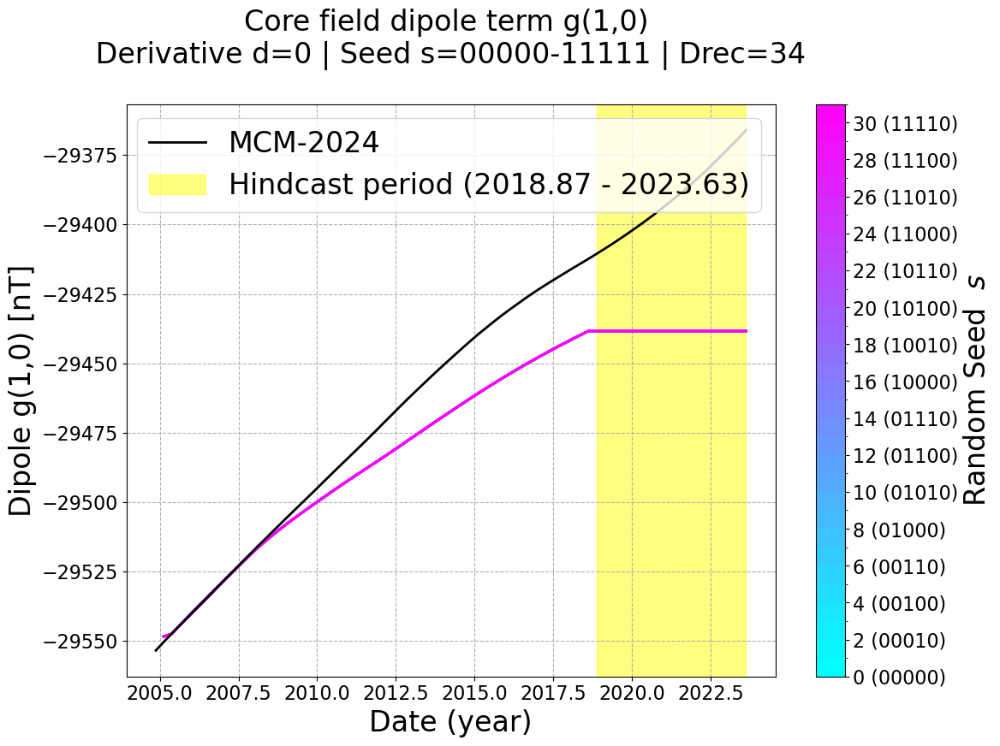

In [23]:
# plot dipole term for various seeds
diff = 0

fig, ax = plt.subplots(1, 1, figsize=(12, 9))

cmap = mpl.colormaps['cool']
norm = BoundaryNorm(plot_table.columns, cmap.N)
seed_l = plot_table.columns[0:31:2]

for s in range(32):
    b_seed = format(s, '05b')
    hindcast = np.load(f".{save_dir}/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)
    ax.plot(hindcast['time_memo'], hindcast['d0g_memo'][0, :], 
            c=cmap(norm(s)), alpha=0.7)


d0g_ref = coef_raw[0].loc[hindcast['time_memo'], :].values.T # Reference Core field
ax.plot(hindcast['time_memo'], d0g_ref[0, :], c='black', label='MCM-2024')


p = ax.scatter([np.nan]*32, [np.nan]*32, cmap=cmap, norm=norm, c=range(32), alpha=1.0, marker='none')
ax.colorbar = plt.colorbar(p, ax=ax)
ax.colorbar.set_label(r"Random Seed  $s$", fontsize=f_large)
print([f"{seed} ({format(seed, '05b')})" for seed in seed_l])
ax.colorbar.set_ticks                                                    (seed_l)
ax.colorbar.set_ticklabels([f"{seed} ({format(seed, '05b')})" for seed in seed_l])

ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, ymax)

ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                where=(hindcast['time_memo']>=fS) & (hindcast['time_memo']<=fE), 
                color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')

ax.set_xlabel('Date (year)', fontsize=f_large)
ax.set_ylabel('Dipole g(1,0) [nT]', fontsize=f_large)
ax.set_title(f"Core field dipole term g(1,0) \n Derivative d={diff} | Seed s=00000-11111 | Drec=34 \n", fontsize=f_large)
ax.legend(fontsize=f_large)
plt.tight_layout()
plt.show()

['0 (00000)', '2 (00010)', '4 (00100)', '6 (00110)', '8 (01000)', '10 (01010)', '12 (01100)', '14 (01110)', '16 (10000)', '18 (10010)', '20 (10100)', '22 (10110)', '24 (11000)', '26 (11010)', '28 (11100)', '30 (11110)']


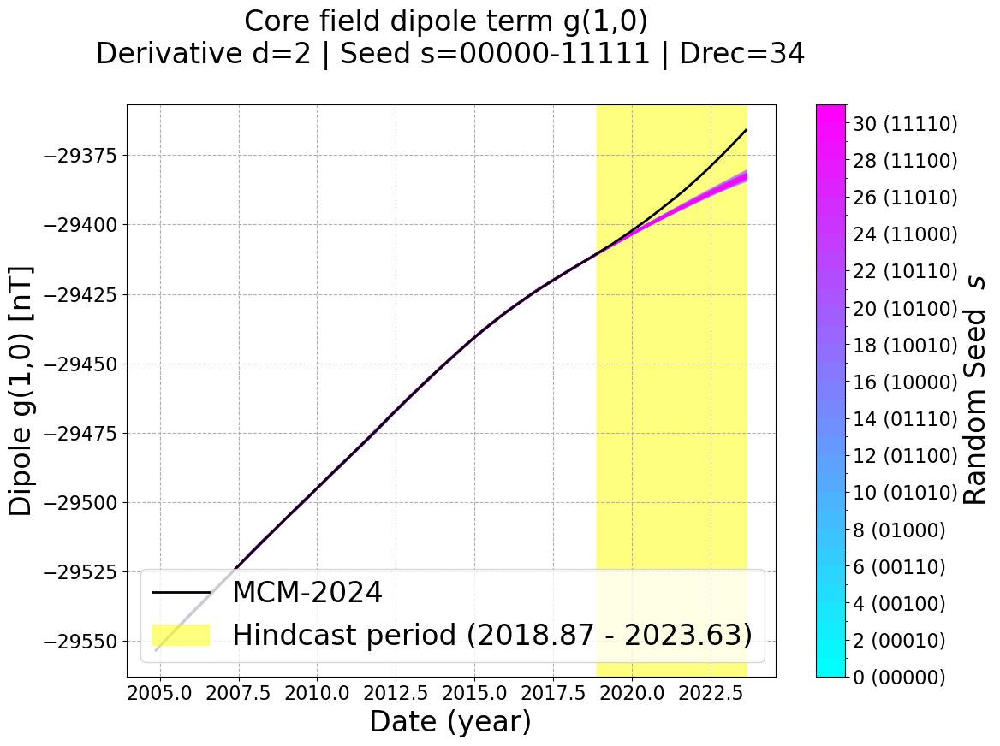

In [24]:
# plot dipole term for various seeds
diff = 2

fig, ax = plt.subplots(1, 1, figsize=(12, 9))

cmap = mpl.colormaps['cool']
norm = BoundaryNorm(plot_table.columns, cmap.N)
seed_l = plot_table.columns[0:31:2]

for s in range(32):
    b_seed = format(s, '05b')
    hindcast = np.load(f".{save_dir}/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)
    ax.plot(hindcast['time_memo'], hindcast['d0g_memo'][0, :], 
            c=cmap(norm(s)), alpha=0.7)


d0g_ref = coef_raw[0].loc[hindcast['time_memo'], :].values.T # Reference Core field
ax.plot(hindcast['time_memo'], d0g_ref[0, :], c='black', label='MCM-2024')


p = ax.scatter([np.nan]*32, [np.nan]*32, cmap=cmap, norm=norm, c=range(32), alpha=1.0, marker='none')
ax.colorbar = plt.colorbar(p, ax=ax)
ax.colorbar.set_label(r"Random Seed  $s$", fontsize=f_large)
print([f"{seed} ({format(seed, '05b')})" for seed in seed_l])
ax.colorbar.set_ticks                                                    (seed_l)
ax.colorbar.set_ticklabels([f"{seed} ({format(seed, '05b')})" for seed in seed_l])

ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, ymax)

ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                where=(hindcast['time_memo']>=fS) & (hindcast['time_memo']<=fE), 
                color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')

ax.set_xlabel('Date (year)', fontsize=f_large)
ax.set_ylabel('Dipole g(1,0) [nT]', fontsize=f_large)
ax.set_title(f"Core field dipole term g(1,0) \n Derivative d={diff} | Seed s=00000-11111 | Drec=34 \n", fontsize=f_large)
ax.legend(fontsize=f_large)
plt.tight_layout()
plt.show()

### Plotting results with IGRF-14 parameters
`s = 29, '11101'`  # seed for initial `w0`  
`Drec = 34`

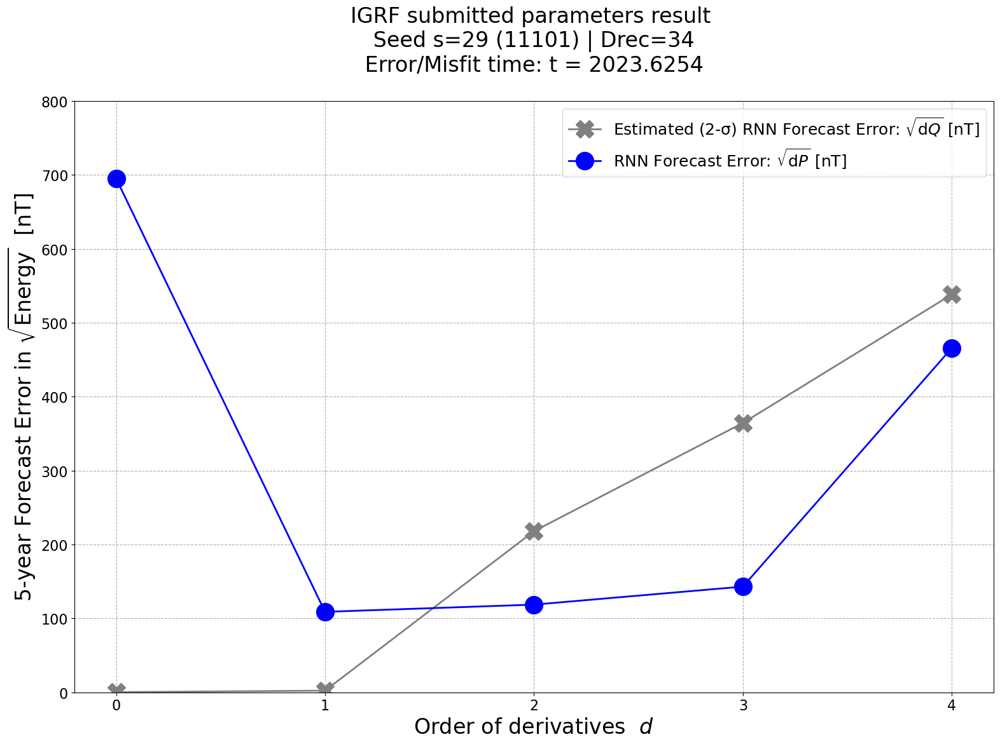

In [25]:
fig, ax = plt.subplots(1, 1, figsize=(16, 12))
IGRF_s = 29

ax.plot(yZyZ_nLOD_CFddQ.index, yZyZ_nLOD_CFddQ.loc[:, IGRF_s].values, 
        marker="X", markersize=20, linestyle="-", linewidth=2.0, color="gray",
        label=f"Estimated ({sig}-σ) RNN Forecast Error: " + r"$\sqrt{\mathrm{d} {Q}}$ [nT]")

ax.plot(yZyZ_nLOD_CFddP.index, yZyZ_nLOD_CFddP.loc[:, IGRF_s].values, 
        marker="o", markersize=20, linestyle="-", linewidth=2.0, color="blue",
        label="RNN Forecast Error: " + r"$\sqrt{\mathrm{d} {P}}$ [nT]")

ax.set_xticks(range(5))
ax.set_ylim(0, 800)
# ax.set_yscale('log')
ax.set_xlabel(r"Order of derivatives  $d$", fontsize=f_large)
ax.set_ylabel(r"5-year Forecast Error in $\sqrt{\mathrm{Energy}}$  [nT]", fontsize=f_large)

ax.set_title(f"IGRF submitted parameters result \n Seed s={IGRF_s} ({format(IGRF_s, '05b')}) | Drec=34 \n Error/Misfit time: t = {fE} \n", fontsize=f_large)
plt.legend(fontsize=f_medium, loc='upper right')
plt.tight_layout()
plt.show()

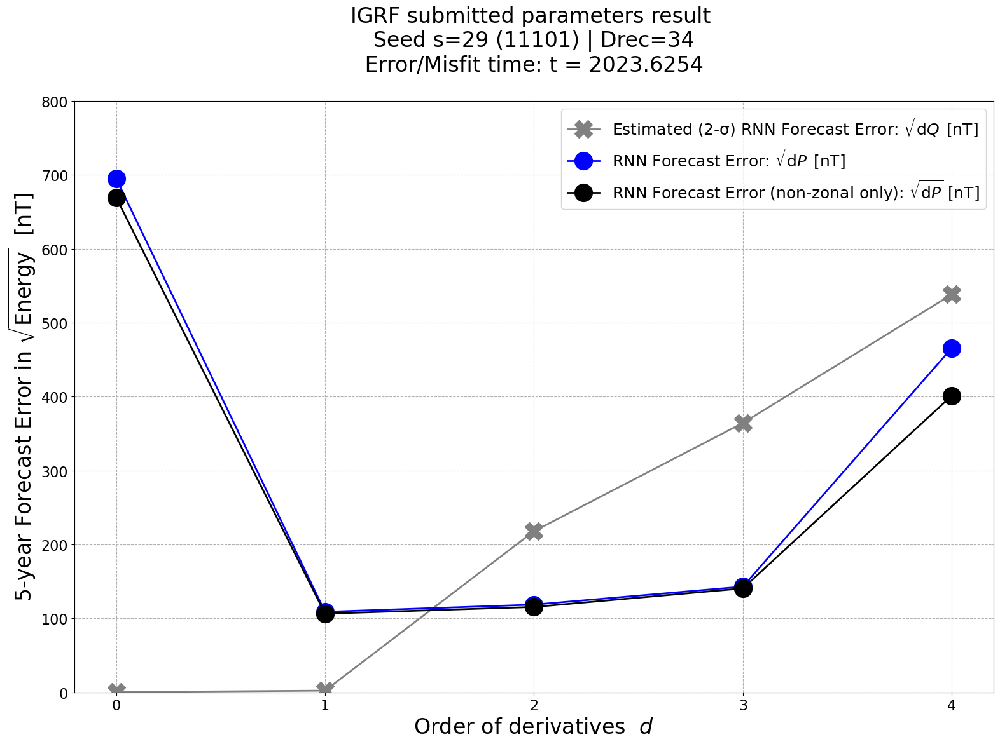

In [26]:
fig, ax = plt.subplots(1, 1, figsize=(16, 12))
IGRF_s = 29

ax.plot(yZyZ_nLOD_CFddQ.index, yZyZ_nLOD_CFddQ.loc[:, IGRF_s].values, 
        marker="X", markersize=20, linestyle="-", linewidth=2.0, color="gray",
        label=f"Estimated ({sig}-σ) RNN Forecast Error: " + r"$\sqrt{\mathrm{d} {Q}}$ [nT]")

ax.plot(yZyZ_nLOD_CFddP.index, yZyZ_nLOD_CFddP.loc[:, IGRF_s].values, 
        marker="o", markersize=20, linestyle="-", linewidth=2.0, color="blue",
        label="RNN Forecast Error: " + r"$\sqrt{\mathrm{d} {P}}$ [nT]")

ax.set_xticks(range(5))
ax.set_ylim(0, 800)
# ax.set_yscale('log')
ax.set_xlabel(r"Order of derivatives  $d$", fontsize=f_large)
ax.set_ylabel(r"5-year Forecast Error in $\sqrt{\mathrm{Energy}}$  [nT]", fontsize=f_large)

ax.plot(yZnZ_nLOD_CFddP.index, yZnZ_nLOD_CFddP.loc[:, IGRF_s].values, 
        marker="o", markersize=20, linestyle="-", linewidth=2.0, color="black",
        label="RNN Forecast Error (non-zonal only): " + r"$\sqrt{\mathrm{d} {P}}$ [nT]")

ax.set_title(f"IGRF submitted parameters result \n Seed s={IGRF_s} ({format(IGRF_s, '05b')}) | Drec=34 \n Error/Misfit time: t = {fE} \n", fontsize=f_large)
plt.legend(fontsize=f_medium, loc='upper right')
plt.tight_layout()
plt.show()

(195, 76) (195, 76) (195, 76) (76,)


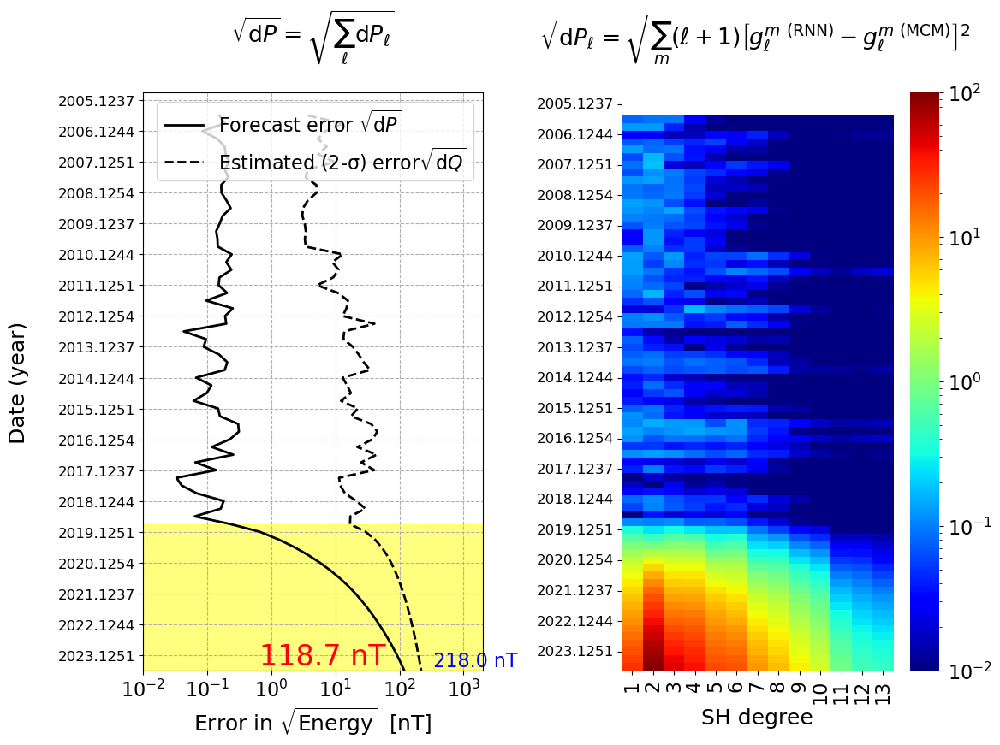

In [27]:
hindcast = np.load(f".{save_dir}/d2g_{Drec}_11101_geomag_memos.npz", allow_pickle=True)
d0g_RNN = hindcast['d0g_memo'] # RNN prediction of Core field
d0R_RNN = hindcast['d0R_memo'] # RNN estimated error
d0g_ref = coef_raw[0].loc[hindcast['time_memo'], :].values.T # Reference Core field

print(d0g_RNN.shape, d0g_ref.shape, d0R_RNN.shape, hindcast['time_memo'].shape)

fig, ax = draw_dP(d0g_RNN, d0g_ref, sig * np.sqrt(d0R_RNN), 
                  hindcast['time_memo'], col_raw, unit="nT")

ax[0].fill_between([0.001, 10000],
                   fS, 
                   fE, 
                   color='yellow', alpha=0.5) # colorize forecast target period

ax[1].set_title(r"$\sqrt{\mathrm{d} P_\ell} = \sqrt{\sum_m (\ell +1) \left[ {g_\ell ^m}^\mathrm{\ (RNN)} - {g_\ell ^m}^\mathrm{\ (MCM)} \right]^2}$" + "\n")
ax[0].set_xlabel(r"Error in $\sqrt{\mathrm{Energy}}$  [nT]", fontsize=f_medium)
ax[0].set_title(r"$\sqrt{\mathrm{d} P} = \sqrt{\sum_\ell \mathrm{d} P_\ell}$" + "\n")

ax[0].set_xlim(0.01, 2000)

# get legend
handles, labels = ax[0].get_legend_handles_labels()
labels[0] = r"Forecast error $\sqrt{\mathrm{d} P}$"
labels[1] = f"Estimated ({sig}-σ) error" + r"$\sqrt{\mathrm{d} Q}$"

ax[0].legend(handles, labels, loc='upper right', fontsize=f_small)

plt.tight_layout()
plt.show()

In [28]:
print(f"target_epoch = {TS} - {TE}")
CF_ref = coef_raw[0].loc[TS:TE, :].values.T # Reference CF at target_epoch
SV_ref = coef_raw[1].loc[TS:TE, :].values.T # Reference SV at target_epoch
SA_ref = coef_raw[2].loc[TS:TE, :].values.T # Reference SA at target_epoch
TG_ref = SA_ref # target field
print(TG_ref.shape, "\n", TG_ref[:5])

target_epoch = 2014.3745999999999 - 2017.6241
(195, 14) 
 [[-0.26080 -0.26240 -1.04800 -0.52320 -2.61760 -0.00160 -1.30720 -1.57280
  -1.57120  0.26240 -1.30880 -1.57280 -1.04640 -0.52320]
 [-0.84160 -1.54400 -1.83680 -3.33120 -2.93760 -3.03680 -4.02880 -4.25760
  -2.65600 -3.20320 -3.54720 -2.68320 -1.98400 -1.60800]
 [ 0.86560  0.15680 -0.62880 -0.57600 -1.70240 -2.88000 -2.77600 -0.81280
  -1.46560 -1.59680 -0.02560  0.78400  0.36800  0.88960]
 [ 0.37120  0.20160  0.52960 -0.21440 -1.21760  0.88800  0.51520 -1.20320
  -0.50080  1.51840 -0.35840 -1.43200 -0.80160 -0.66080]
 [-1.04640 -1.46240 -1.65920 -0.34560 -0.19840 -1.87840 -1.68960  0.93120
   0.81760 -1.89280 -0.97280 -0.17120 -1.21920 -1.46080]]


In [29]:
test_memos = np.load(f".{save_dir}/d0g_{Drec}_00000_geomag_memos.npz", allow_pickle=True)

CF_time = test_memos['time_memo']   # time - leap frog
print("CF_time:", CF_time)

tS_idx = np.abs(CF_time - TS).argmin()
tE_idx = np.abs(CF_time - TE).argmin()
t_indices = np.arange(tS_idx, tE_idx + 1)
print(t_indices)
print(f"t_indices from {tS_idx} to {tE_idx} ({len(t_indices)} points) --> ", end="\n")

SA_memo = test_memos['d2g_memo'] # RNN prediction of SA
SV_memo = test_memos['d1g_memo'] # RNN prediction of SV
CF_memo = test_memos['d0g_memo'] # RNN prediction of Core field

TG_memo = SV_memo # target field
TG_rnn  = TG_memo[:, t_indices]

print(SA_memo.shape, SV_memo.shape, CF_memo.shape)
print(TG_rnn.shape)
print(TG_rnn)

CF_time: [2004.87390 2005.12370 2005.37390 2005.62410 2005.87420 2006.12440
 2006.37460 2006.62470 2006.87490 2007.12510 2007.37530 2007.62540
 2007.87560 2008.12540 2008.37490 2008.62440 2008.87390 2009.12370
 2009.37390 2009.62410 2009.87420 2010.12440 2010.37460 2010.62470
 2010.87490 2011.12510 2011.37530 2011.62540 2011.87560 2012.12540
 2012.37490 2012.62440 2012.87390 2013.12370 2013.37390 2013.62410
 2013.87420 2014.12440 2014.37460 2014.62470 2014.87490 2015.12510
 2015.37530 2015.62540 2015.87560 2016.12540 2016.37490 2016.62440
 2016.87390 2017.12370 2017.37390 2017.62410 2017.87420 2018.12440
 2018.37460 2018.62470 2018.87490 2019.12510 2019.37530 2019.62540
 2019.87560 2020.12540 2020.37490 2020.62440 2020.87390 2021.12370
 2021.37390 2021.62410 2021.87420 2022.12440 2022.37460 2022.62470
 2022.87490 2023.12510 2023.37530 2023.62540]
[38 39 40 41 42 43 44 45 46 47 48 49 50 51]
t_indices from 38 to 51 (14 points) --> 
(195, 76) (195, 76) (195, 76)
(195, 14)
[[nan nan nan ..

### SA time series plot

In [30]:
### Compute ddP table
yZnZ_nLOD_SAddP = pd.DataFrame(index=np.arange(0, 5), columns=np.arange(0, 32), dtype=float)
for d_max in range(5):
    for seed in range(0, 32):
        b_seed = format(seed, '05b') # seed No. as 5-bit binary

        filename = f"d{d_max}g_{Drec}_{b_seed}_geomag_memos.npz"

        read_file = f".{save_dir}/{filename}"

        print(f"reading {(d_max, Drec, b_seed)}: ", end="")

        pred_memos = np.load(read_file, allow_pickle=True)
        print(f"loaded --> ", end="\n")
        
        CF_time = pred_memos['time_memo']   # time - leap frog
        CF_cols = pred_memos['columns'][:J] # target field columns
        SA_memo = pred_memos['d2g_memo'] # RNN prediction of SA

        SA_memo = if_nan_SAgenerate(SA_memo, pred_memos, diff=d_max)

        TG_memo = SA_memo # target field

        print(f"time={CF_time.shape}, shape={TG_memo.shape} --> ", end="")

        # t_idx = np.where(CF_time == target_epoch)[0][0]
        # print(f"t_idx={fE_idx} --> ", end="")

        # 範囲インデックス配列の作成
        tS_idx = np.abs(CF_time - TS).argmin()
        tE_idx = np.abs(CF_time - TE).argmin()
        t_indices = np.arange(tS_idx, tE_idx + 1)
        print(f"t_indices from {tS_idx} to {tE_idx} ({len(t_indices)} points) --> ", end="")

        TG_rnn = TG_memo[:, t_indices] # multiple time steps
        error, CF_cols = remove_zonal_g(TG_rnn - TG_ref, CF_cols)
        print("error.shape: ", error.shape, len(CF_cols), "--> ", end="")
        
        ddP2 = get_energy(error, CF_time[t_indices], CF_cols)
        # print("ddP2:", ddP2)
        print("ddP2.shape", ddP2.shape, len(CF_cols), "--> ", end="")
        sqrtddP = np.sqrt(np.trapz(ddP2[1:, :].sum(axis=0), CF_time[t_indices])) # integrate over time

        print(f"sqrt(ddP)={sqrtddP:.4f} nT --> ", end="")
        yZnZ_nLOD_SAddP.loc[d_max, seed] = sqrtddP

        print("ddP table done", end="\n")


reading (0, 34, '00000'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(195, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 14) 182 --> ddP2.shape (14, 14) 182 --> sqrt(ddP)=12.8032 nT --> ddP table done
reading (0, 34, '00001'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(195, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 14) 182 --> ddP2.shape (14, 14) 182 --> sqrt(ddP)=12.8032 nT --> ddP table done
reading (0, 34, '00010'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(195, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 14) 182 --> ddP2.shape (14, 14) 182 --> sqrt(ddP)=12.8032 nT --> ddP table done
reading (0, 34, '00011'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(195, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 

In [31]:
display(yZnZ_nLOD_SAddP.T)
display(yZnZ_nLOD_SAddP.T.describe())

,0,1,2,3,4
0,12.80322,31.54493,4.52655,7.83778,15.14415
1,12.80322,63.20788,3.49486,7.55128,15.07685
2,12.80322,75.35016,4.12072,8.20452,15.21730
3,12.80322,40.77585,4.33120,8.26251,15.32756
4,12.80322,10.43916,3.96989,7.59714,15.18301
5,12.80322,16.69118,4.43341,7.84169,15.05444
6,12.80322,105.30131,5.08221,7.55407,15.29585
7,12.80322,13.25127,4.26233,7.84210,15.25786
8,12.80322,13.18520,4.24524,7.59504,15.07340
9,12.80322,13.03946,4.10727,7.49172,15.05715


,0,1,2,3,4
count,32.00000,32.00000,32.00000,32.00000,32.00000
mean,12.80322,42.68263,4.29321,7.74472,15.12886
std,0.00000,55.50989,0.44727,0.26865,0.09236
min,12.80322,6.86271,3.49486,7.29757,14.97787
25%,12.80322,13.03818,4.00010,7.56205,15.07408
50%,12.80322,14.97123,4.25379,7.63900,15.12060
75%,12.80322,58.78101,4.46778,7.89688,15.18727
max,12.80322,293.50332,5.48816,8.35289,15.32756


  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating S

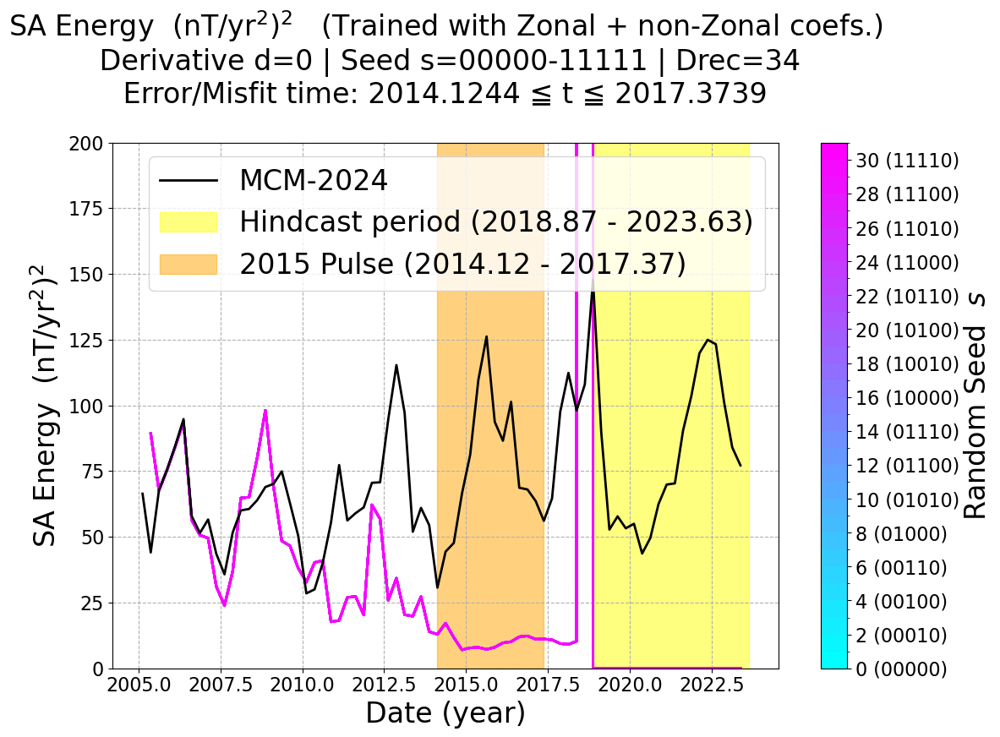

  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating S

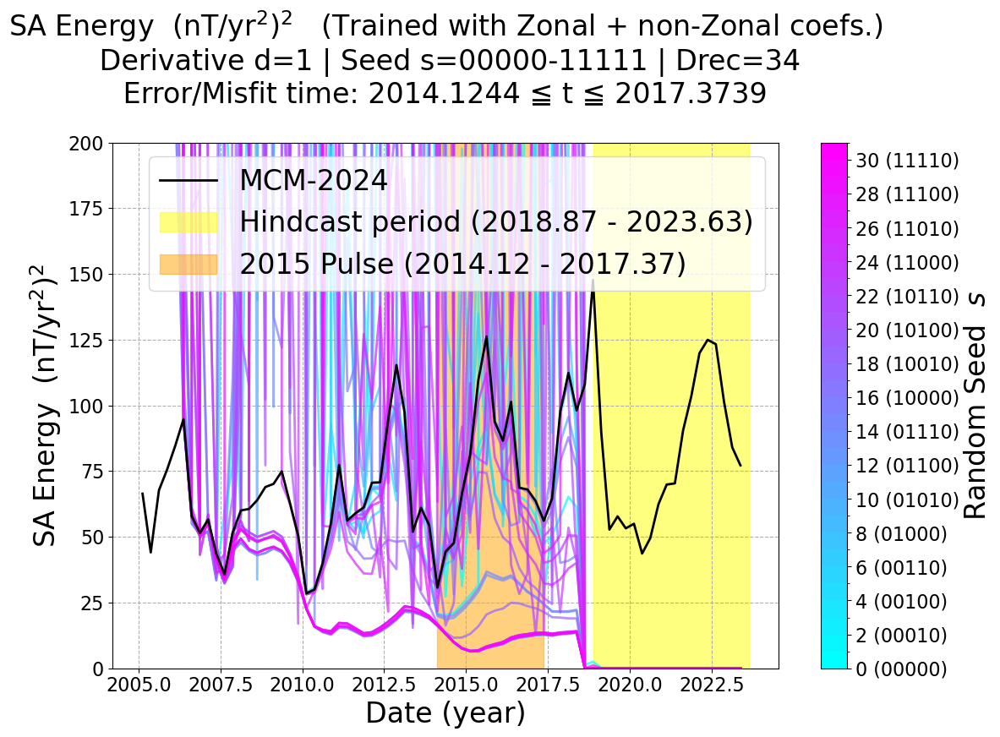

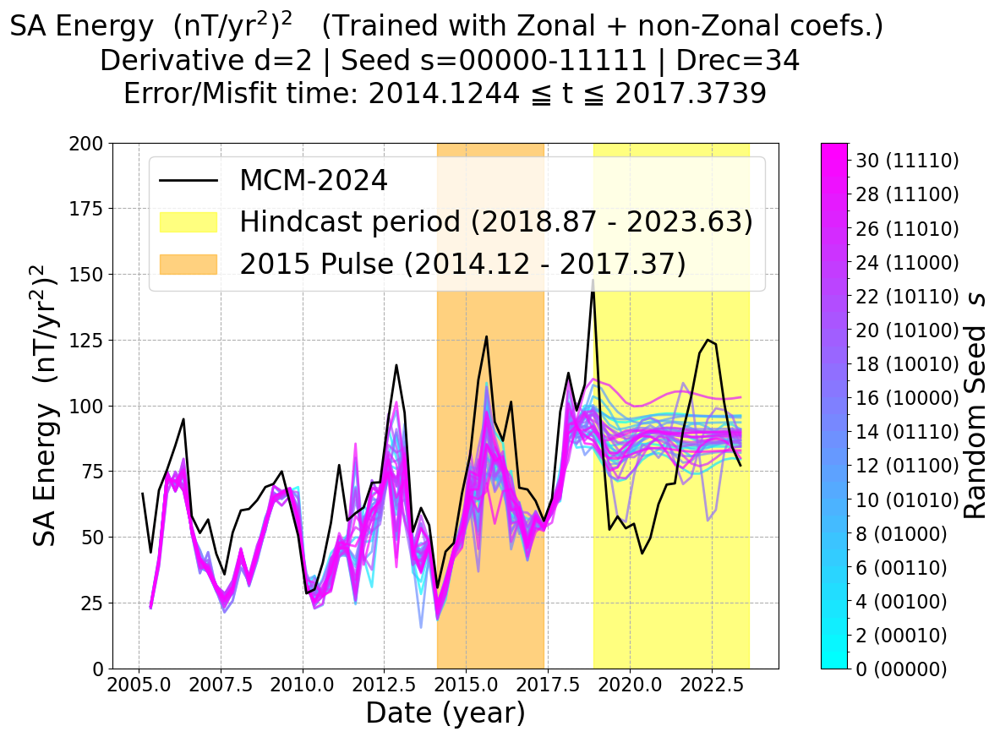

In [32]:
# plot SA Energy series for various seeds (non-zonal only)
for diff in [0, 1, 2]:

    fig, ax = plt.subplots(1, 1, figsize=(12, 9))

    cmap = mpl.colormaps['cool']
    norm = BoundaryNorm(plot_table.columns, cmap.N)
    seed_l = plot_table.columns[0:31:2]

    for s in range(32):
        b_seed = format(s, '05b')
        hindcast = np.load(f".{save_dir}/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)

        SA_time = hindcast['time_memo'] - 0.2502  # adjust time for SA leapfrog
        SA_memo = hindcast['d2g_memo'] # RNN prediction of SA

        SA_memo = if_nan_SAgenerate(SA_memo, hindcast, diff=diff)
        SA_memo, nZcolumns = remove_zonal_g(SA_memo, hindcast['columns'][:J])

        SA_Energy_col = get_energy(SA_memo, SA_time, nZcolumns)
        SA_Energy_tot = SA_Energy_col[1:, :].sum(axis=0)

        # print(SA_Energy_col[0, :], SA_Energy_tot)

        ax.plot(SA_Energy_col[0, :], SA_Energy_tot, 
                c=cmap(norm(s)), alpha=0.7)


    SA_ref = coef_raw[2].loc[hindcast['time_memo'], :].values.T # Reference SA time series
    SA_ref, nZcolumns = remove_zonal_g(SA_ref, hindcast['columns'][:J])
    SA_Energy_ref_col = get_energy(SA_ref, hindcast['time_memo'] - 0.2502, nZcolumns)
    SA_Energy_ref_tot = SA_Energy_ref_col[1:, :].sum(axis=0)
    ax.plot(SA_Energy_ref_col[0, :], SA_Energy_ref_tot, c='black', label='MCM-2024')


    p = ax.scatter([np.nan]*32, [np.nan]*32, cmap=cmap, norm=norm, c=range(32), alpha=1.0, marker='none')
    ax.colorbar = plt.colorbar(p, ax=ax)
    ax.colorbar.set_label(r"Random Seed  $s$", fontsize=f_large)
    # print([f"{seed} ({format(seed, '05b')})" for seed in seed_l])
    ax.colorbar.set_ticks                                                    (seed_l)
    ax.colorbar.set_ticklabels([f"{seed} ({format(seed, '05b')})" for seed in seed_l])


    ymin, ymax = 0, 200
    ax.set_ylim(ymin, ymax)

    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=fS) & (hindcast['time_memo']<=fE), 
                    color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')
    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=TS-0.2502) & (hindcast['time_memo']<=TE-0.2502), 
                    color='orange', alpha=0.5, label=f'2015 Pulse ({TS-0.25:.2f} - {TE-0.25:.2f})')

    ax.set_xlabel('Date (year)', fontsize=f_large)
    ax.set_ylabel(r"SA Energy  (nT/yr$^2$)$^2$", fontsize=f_large)
    ax.set_title(r"SA Energy  (nT/yr$^2$)$^2$   (Trained with Zonal + non-Zonal coefs.)" + 
                f"\n Derivative d={diff} | Seed s=00000-11111 | Drec=34" + 
                f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
                fontsize=f_large)
    ax.legend(fontsize=f_large)
    plt.tight_layout()
    plt.show()

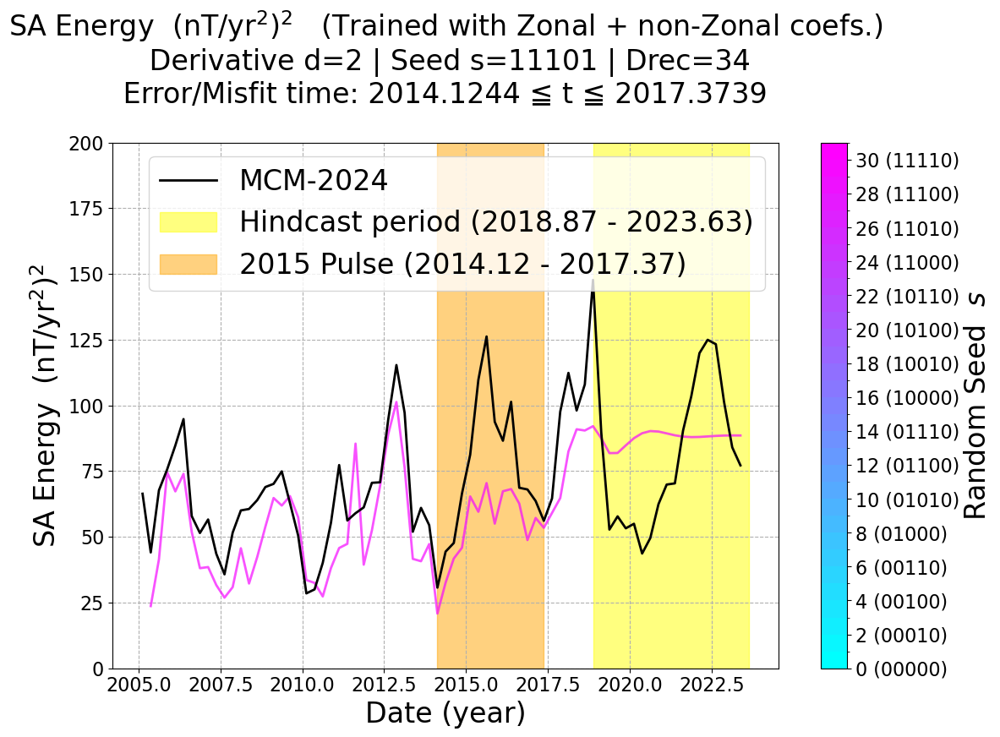

In [33]:
# plot SA Energy series for seed 29
for diff in [2]:

    fig, ax = plt.subplots(1, 1, figsize=(12, 9))

    cmap = mpl.colormaps['cool']
    norm = BoundaryNorm(plot_table.columns, cmap.N)
    seed_l = plot_table.columns[0:31:2]

    for s in [29]:
        b_seed = format(s, '05b')
        hindcast = np.load(f".{save_dir}/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)

        SA_time = hindcast['time_memo'] - 0.2502  # adjust time for SA leapfrog
        SA_memo = hindcast['d2g_memo'] # RNN prediction of SA

        SA_memo = if_nan_SAgenerate(SA_memo, hindcast, diff=diff)
        SA_memo, nZcolumns = remove_zonal_g(SA_memo, hindcast['columns'][:J])

        SA_Energy_col = get_energy(SA_memo, SA_time, nZcolumns)
        SA_Energy_tot = SA_Energy_col[1:, :].sum(axis=0)

        # print(SA_Energy_col[0, :], SA_Energy_tot)

        ax.plot(SA_Energy_col[0, :], SA_Energy_tot, 
                c=cmap(norm(s)), alpha=0.7)


    SA_ref = coef_raw[2].loc[hindcast['time_memo'], :].values.T # Reference SA time series
    SA_ref, nZcolumns = remove_zonal_g(SA_ref, hindcast['columns'][:J])
    SA_Energy_ref_col = get_energy(SA_ref, hindcast['time_memo'] - 0.2502, nZcolumns)
    SA_Energy_ref_tot = SA_Energy_ref_col[1:, :].sum(axis=0)
    ax.plot(SA_Energy_ref_col[0, :], SA_Energy_ref_tot, c='black', label='MCM-2024')


    p = ax.scatter([np.nan]*32, [np.nan]*32, cmap=cmap, norm=norm, c=range(32), alpha=1.0, marker='none')
    ax.colorbar = plt.colorbar(p, ax=ax)
    ax.colorbar.set_label(r"Random Seed  $s$", fontsize=f_large)
    # print([f"{seed} ({format(seed, '05b')})" for seed in seed_l])
    ax.colorbar.set_ticks                                                    (seed_l)
    ax.colorbar.set_ticklabels([f"{seed} ({format(seed, '05b')})" for seed in seed_l])


    ymin, ymax = 0, 200
    ax.set_ylim(ymin, ymax)

    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=fS) & (hindcast['time_memo']<=fE), 
                    color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')
    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=TS-0.2502) & (hindcast['time_memo']<=TE-0.2502), 
                    color='orange', alpha=0.5, label=f'2015 Pulse ({TS-0.25:.2f} - {TE-0.25:.2f})')

    ax.set_xlabel('Date (year)', fontsize=f_large)
    ax.set_ylabel(r"SA Energy  (nT/yr$^2$)$^2$", fontsize=f_large)
    ax.set_title(r"SA Energy  (nT/yr$^2$)$^2$   (Trained with Zonal + non-Zonal coefs.)" + 
                f"\n Derivative d={diff} | Seed s=11101 | Drec=34" + 
                f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
                fontsize=f_large)
    ax.legend(fontsize=f_large)
    plt.tight_layout()
    plt.show()

# only non-Zonal terms, without LOD input

In [34]:
save_dir = "./trained_models/2025_1018_nonZonal"
J = 195 - 13 # Number of Gauss coefficients up to degree n=13, excluding zonal terms

## Load MCM model


In [35]:
d0g_raw = pd.read_csv  (f"{mcm_load}/coef_g_nonZonal.csv")  
d1g_raw = pd.read_csv(f"{mcm_load}/coef_d1g_nonZonal.csv")
d2g_raw = pd.read_csv(f"{mcm_load}/coef_d2g_nonZonal.csv")

d0g_raw.set_index('YEAR', inplace=True)
d1g_raw.set_index('YEAR', inplace=True)
d2g_raw.set_index('YEAR', inplace=True)

d0R_raw = np.load  (f"{mcm_load}/cvar_R_nonZonal.npy")  
d1R_raw = np.load(f"{mcm_load}/cvar_d1R_nonZonal.npy")
d2R_raw = np.load(f"{mcm_load}/cvar_d2R_nonZonal.npy")

display(d2g_raw.head())
print(d2R_raw[0:5,0:5, 0])
print(d2R_raw[0:5,0:5, 1])
print(d2R_raw[0:5,0:5, 2])
print(d2R_raw[0:5,0:5, 3])
print(d2R_raw[0:5,0:5, -1])

,"g(1,1)","h(1,1)","g(2,1)","h(2,1)","g(2,2)","h(2,2)","g(3,1)","h(3,1)","g(3,2)","h(3,2)",...,"g(18,14)","h(18,14)","g(18,15)","h(18,15)","g(18,16)","h(18,16)","g(18,17)","h(18,17)","g(18,18)","h(18,18)"
YEAR,,,,,,,,,,,,,,,,,,,,,
2004.87390,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005.12370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005.37390,2.22560,-0.89280,-0.08800,-0.74240,1.53120,0.15680,0.20320,-0.36960,-0.81440,0.62560,...,-0.00160,-0.00000,-0.00000,-0.00000,0.00160,0.00000,0.00160,0.00000,0.00160,-0.00160
2005.62410,1.10080,-0.70560,-0.55680,-0.27360,1.43360,0.30720,-0.53280,0.13760,-0.94720,0.21120,...,0.00160,0.00000,0.00000,0.00000,-0.00160,-0.00000,-0.00160,-0.00160,-0.00160,0.00160
2005.87420,1.80640,-1.30880,-0.77440,-0.56000,2.16160,1.32000,0.14880,0.33760,-0.84800,0.45440,...,-0.00160,-0.00000,-0.00160,-0.00160,0.00000,0.00160,0.00000,0.00160,0.00000,-0.00000


[[2004.87400        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]]
[[2005.12400        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]]
[[2005.37400        nan        nan        nan        nan]
 [       nan   20.52914   -0.11124    0.44031   -0.40424]
 [       nan   -0.11124   25.27605    0.19694    0.78073]
 [       nan    0.44031    0.19694    8.59316    0.07377]
 [       nan   -0.40424    0.78073    0.07377    6.85631]]
[[2005.62400        nan        nan        nan        nan]
 [       nan   20.52360   -0.11082    0.44048   -0.40391]
 [       na

In [36]:
coef_raw    = [d0g_raw.iloc[:, :J], d1g_raw.iloc[:, :J], d2g_raw.iloc[:, :J]]
Rmatrix_raw = [d0R_raw[:J+1, :J+1, :], d1R_raw[:J+1, :J+1, :], d2R_raw[:J+1, :J+1, :]]

col_raw = coef_raw[0].columns.tolist()
time_raw = coef_raw[0].index.values

print(col_raw)
print(time_raw)
print(d0R_raw[0, 0, :])

['g(1,1)', 'h(1,1)', 'g(2,1)', 'h(2,1)', 'g(2,2)', 'h(2,2)', 'g(3,1)', 'h(3,1)', 'g(3,2)', 'h(3,2)', 'g(3,3)', 'h(3,3)', 'g(4,1)', 'h(4,1)', 'g(4,2)', 'h(4,2)', 'g(4,3)', 'h(4,3)', 'g(4,4)', 'h(4,4)', 'g(5,1)', 'h(5,1)', 'g(5,2)', 'h(5,2)', 'g(5,3)', 'h(5,3)', 'g(5,4)', 'h(5,4)', 'g(5,5)', 'h(5,5)', 'g(6,1)', 'h(6,1)', 'g(6,2)', 'h(6,2)', 'g(6,3)', 'h(6,3)', 'g(6,4)', 'h(6,4)', 'g(6,5)', 'h(6,5)', 'g(6,6)', 'h(6,6)', 'g(7,1)', 'h(7,1)', 'g(7,2)', 'h(7,2)', 'g(7,3)', 'h(7,3)', 'g(7,4)', 'h(7,4)', 'g(7,5)', 'h(7,5)', 'g(7,6)', 'h(7,6)', 'g(7,7)', 'h(7,7)', 'g(8,1)', 'h(8,1)', 'g(8,2)', 'h(8,2)', 'g(8,3)', 'h(8,3)', 'g(8,4)', 'h(8,4)', 'g(8,5)', 'h(8,5)', 'g(8,6)', 'h(8,6)', 'g(8,7)', 'h(8,7)', 'g(8,8)', 'h(8,8)', 'g(9,1)', 'h(9,1)', 'g(9,2)', 'h(9,2)', 'g(9,3)', 'h(9,3)', 'g(9,4)', 'h(9,4)', 'g(9,5)', 'h(9,5)', 'g(9,6)', 'h(9,6)', 'g(9,7)', 'h(9,7)', 'g(9,8)', 'h(9,8)', 'g(9,9)', 'h(9,9)', 'g(10,1)', 'h(10,1)', 'g(10,2)', 'h(10,2)', 'g(10,3)', 'h(10,3)', 'g(10,4)', 'h(10,4)', 'g(10,5)', 

## Hindcast variation
`(diff, D_rec, b_seed) = (Variable, 34, Variable)`

In [37]:
print(f"target_epoch = {TS} - {TE}")
CF_ref = coef_raw[0].loc[TS:TE, :].values.T # Reference CF at target_epoch
SV_ref = coef_raw[1].loc[TS:TE, :].values.T # Reference SV at target_epoch
SA_ref = coef_raw[2].loc[TS:TE, :].values.T # Reference SA at target_epoch
TG_ref = SA_ref # target field
print(TG_ref.shape, "\n", TG_ref[:5])

target_epoch = 2014.3745999999999 - 2017.6241
(182, 14) 
 [[-0.84160 -1.54400 -1.83680 -3.33120 -2.93760 -3.03680 -4.02880 -4.25760
  -2.65600 -3.20320 -3.54720 -2.68320 -1.98400 -1.60800]
 [ 0.86560  0.15680 -0.62880 -0.57600 -1.70240 -2.88000 -2.77600 -0.81280
  -1.46560 -1.59680 -0.02560  0.78400  0.36800  0.88960]
 [-1.04640 -1.46240 -1.65920 -0.34560 -0.19840 -1.87840 -1.68960  0.93120
   0.81760 -1.89280 -0.97280 -0.17120 -1.21920 -1.46080]
 [-0.57120  0.15680 -0.08480  0.55840 -2.10720 -1.48800 -0.35840  0.77280
  -2.21920 -0.96000 -0.40160 -0.80160 -1.38880 -0.91680]
 [-0.04160  0.12640 -0.07040 -0.68640 -0.44480  0.42880  0.35840 -0.32960
  -0.31360  0.62880 -0.85920 -1.61760 -1.23360 -0.92960]]


In [38]:
test_memos = np.load(f".{save_dir}/d0g_{Drec}_00000_geomag_memos.npz", allow_pickle=True)

CF_time = test_memos['time_memo']   # time - leap frog
print("CF_time:", CF_time)

tS_idx = np.abs(CF_time - TS).argmin()
tE_idx = np.abs(CF_time - TE).argmin()
t_indices = np.arange(tS_idx, tE_idx + 1)
print(t_indices)
print(f"t_indices from {tS_idx} to {tE_idx} ({len(t_indices)} points) --> ", end="\n")

SA_memo = test_memos['d2g_memo'] # RNN prediction of SA
SV_memo = test_memos['d1g_memo'] # RNN prediction of SV
CF_memo = test_memos['d0g_memo'] # RNN prediction of Core field

TG_memo = SV_memo # target field
TG_rnn  = TG_memo[:, t_indices]

print(SA_memo.shape, SV_memo.shape, CF_memo.shape)
print(TG_rnn.shape)
print(TG_rnn)

CF_time: [2004.87390 2005.12370 2005.37390 2005.62410 2005.87420 2006.12440
 2006.37460 2006.62470 2006.87490 2007.12510 2007.37530 2007.62540
 2007.87560 2008.12540 2008.37490 2008.62440 2008.87390 2009.12370
 2009.37390 2009.62410 2009.87420 2010.12440 2010.37460 2010.62470
 2010.87490 2011.12510 2011.37530 2011.62540 2011.87560 2012.12540
 2012.37490 2012.62440 2012.87390 2013.12370 2013.37390 2013.62410
 2013.87420 2014.12440 2014.37460 2014.62470 2014.87490 2015.12510
 2015.37530 2015.62540 2015.87560 2016.12540 2016.37490 2016.62440
 2016.87390 2017.12370 2017.37390 2017.62410 2017.87420 2018.12440
 2018.37460 2018.62470 2018.87490 2019.12510 2019.37530 2019.62540
 2019.87560 2020.12540 2020.37490 2020.62440 2020.87390 2021.12370
 2021.37390 2021.62410 2021.87420 2022.12440 2022.37460 2022.62470
 2022.87490 2023.12510 2023.37530 2023.62540]
[38 39 40 41 42 43 44 45 46 47 48 49 50 51]
t_indices from 38 to 51 (14 points) --> 
(182, 76) (182, 76) (182, 76)
(182, 14)
[[nan nan nan ..

In [39]:
print(test_memos['d0g_memo'][:5, t_idx-5:t_idx])
print(test_memos['d0R_memo'][:5, t_idx-5:t_idx])

[[-1483.21564 -1483.21564 -1483.21564 -1483.21564 -1483.21564]
 [ 4749.17603  4749.17603  4749.17603  4749.17603  4749.17603]
 [ 3003.05127  3003.05127  3003.05127  3003.05127  3003.05127]
 [-2894.44289 -2894.44289 -2894.44289 -2894.44289 -2894.44289]
 [ 1678.37611  1678.37611  1678.37611  1678.37611  1678.37611]]
[[0.00103 0.00103 0.00103 0.00103 0.00103]
 [0.00126 0.00126 0.00126 0.00126 0.00126]
 [0.00045 0.00045 0.00045 0.00045 0.00045]
 [0.00037 0.00037 0.00037 0.00037 0.00037]
 [0.00050 0.00050 0.00050 0.00050 0.00050]]


In [40]:
### Compute ddP table
nZnZ_nLOD_SAddP = pd.DataFrame(index=np.arange(0, 5), columns=np.arange(0, 32), dtype=float)
for d_max in range(5):
    for seed in range(0, 32):
        b_seed = format(seed, '05b') # seed No. as 5-bit binary

        filename = f"d{d_max}g_{Drec}_{b_seed}_geomag_memos.npz"

        read_file = f".{save_dir}/{filename}"

        print(f"reading {(d_max, Drec, b_seed)}: ", end="")

        pred_memos = np.load(read_file, allow_pickle=True)
        print(f"loaded --> ", end="\n")
        
        CF_time = pred_memos['time_memo']   # time - leap frog
        CF_cols = pred_memos['columns'][:J] # target field columns
        SA_memo = pred_memos['d2g_memo'] # RNN prediction of SA

        SA_memo = if_nan_SAgenerate(SA_memo, pred_memos, diff=d_max)

        TG_memo = SA_memo # target field

        print(f"time={CF_time.shape}, shape={TG_memo.shape} --> ", end="")

        # t_idx = np.where(CF_time == target_epoch)[0][0]
        # print(f"t_idx={fE_idx} --> ", end="")

        # 範囲インデックス配列の作成
        tS_idx = np.abs(CF_time - TS).argmin()
        tE_idx = np.abs(CF_time - TE).argmin()
        t_indices = np.arange(tS_idx, tE_idx + 1)
        print(f"t_indices from {tS_idx} to {tE_idx} ({len(t_indices)} points) --> ", end="")

        TG_rnn = TG_memo[:, t_indices] # multiple time steps
        error = TG_rnn - TG_ref
        print("error.shape: ", error.shape, len(CF_cols), "--> ", end="")
        
        ddP2 = get_energy(error, CF_time[t_indices], CF_cols)
        # print("ddP2:", ddP2)
        print("ddP2.shape", ddP2.shape, len(CF_cols), "--> ", end="")
        sqrtddP = np.sqrt(np.trapz(ddP2[1:, :].sum(axis=0), CF_time[t_indices])) # integrate over time

        print(f"sqrt(ddP)={sqrtddP:.4f} nT --> ", end="")
        nZnZ_nLOD_SAddP.loc[d_max, seed] = sqrtddP

        print("ddP table done", end="\n")


reading (0, 34, '00000'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(182, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 14) 182 --> ddP2.shape (14, 14) 182 --> sqrt(ddP)=10.7924 nT --> ddP table done
reading (0, 34, '00001'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(182, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 14) 182 --> ddP2.shape (14, 14) 182 --> sqrt(ddP)=10.7924 nT --> ddP table done
reading (0, 34, '00010'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(182, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 14) 182 --> ddP2.shape (14, 14) 182 --> sqrt(ddP)=10.7924 nT --> ddP table done
reading (0, 34, '00011'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(182, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 

In [41]:
display(nZnZ_nLOD_SAddP.T)
display(nZnZ_nLOD_SAddP.T.describe())

,0,1,2,3,4
0,10.79235,54.09628,3.64221,7.10746,14.96934
1,10.79235,21.30948,4.25470,7.34659,15.10702
2,10.79235,71.29146,3.55902,7.17081,15.23775
3,10.79235,65.25987,3.15641,7.05940,15.54410
4,10.79235,13.17971,4.15643,7.32694,15.00332
5,10.79235,24.56598,3.70622,6.96340,15.13860
6,10.79235,11.81151,3.89735,6.89534,15.21459
7,10.79235,10.13132,3.81596,7.41343,15.22476
8,10.79235,13.02870,4.14748,7.35208,15.09043
9,10.79235,13.17814,3.41416,7.20972,15.11256


,0,1,2,3,4
count,32.00000,32.00000,32.00000,32.00000,32.00000
mean,10.79235,34.41947,3.83634,7.29330,15.16308
std,0.00000,27.44566,0.35351,0.26945,0.13224
min,10.79235,4.07011,3.15641,6.88959,14.96934
25%,10.79235,13.17932,3.57046,7.08073,15.07753
50%,10.79235,22.69459,3.85149,7.26903,15.14020
75%,10.79235,55.08138,4.06516,7.43709,15.21714
max,10.79235,115.11970,4.58134,7.94077,15.54410


### Plotting SA Energy 3-year periodicity

Trained with only non-Zonal components

  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating SA from CF series...
  --> NaN found in SA_memo, generating S

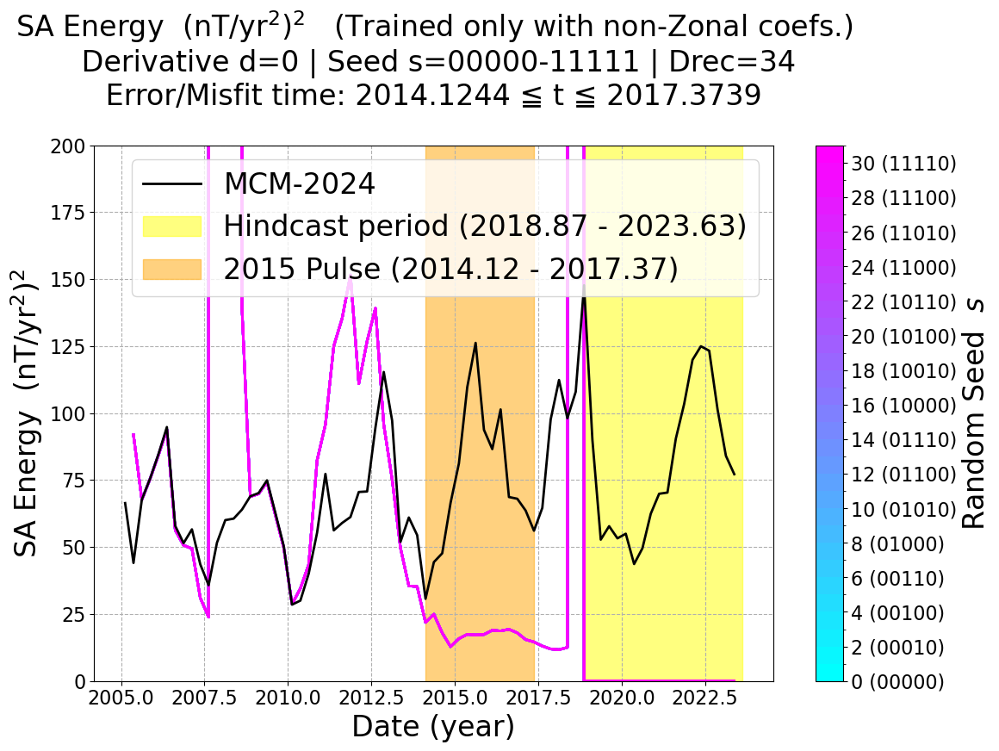

  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating SA from SV series...
  --> NaN found in SA_memo, generating S

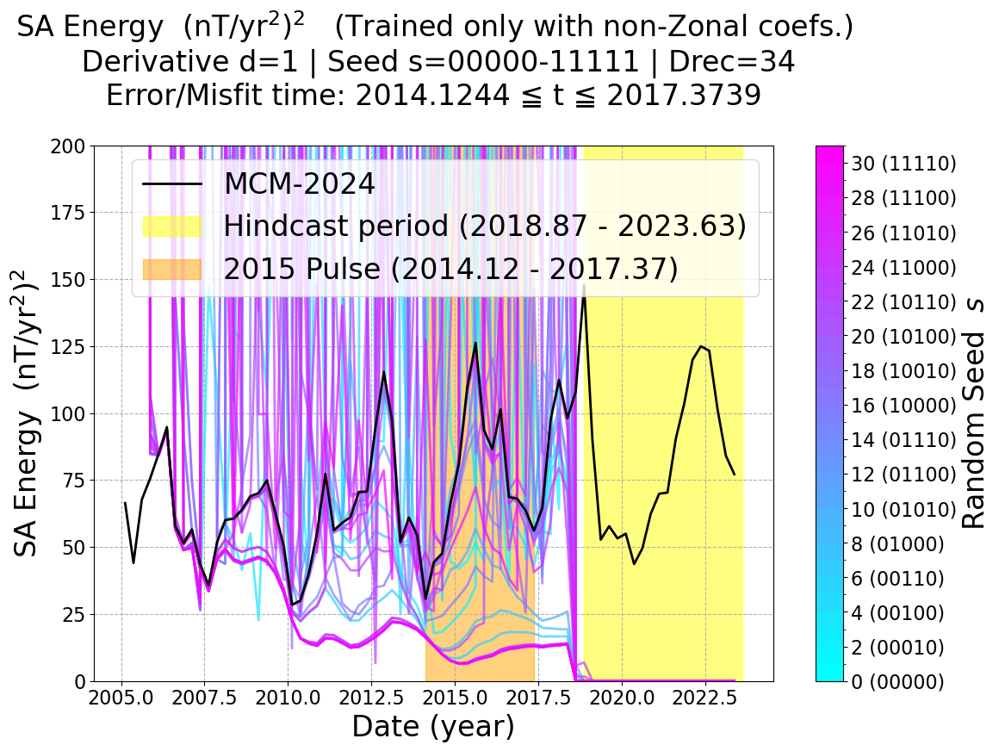

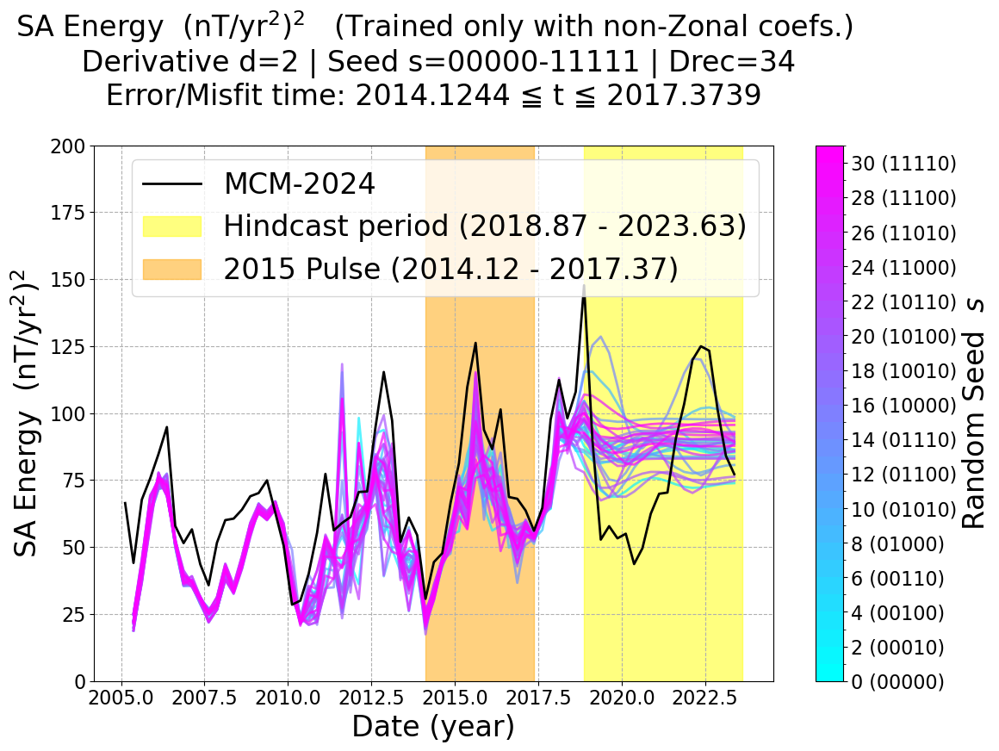

In [42]:
# plot SA Energy series for various seeds (non-zonal only)
for diff in [0, 1, 2]:

    fig, ax = plt.subplots(1, 1, figsize=(12, 9))

    cmap = mpl.colormaps['cool']
    norm = BoundaryNorm(plot_table.columns, cmap.N)
    seed_l = plot_table.columns[0:31:2]

    for s in range(32):
        b_seed = format(s, '05b')
        hindcast = np.load(f".{save_dir}/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)

        SA_time = hindcast['time_memo'] - 0.2502  # adjust time for SA leapfrog
        SA_memo = hindcast['d2g_memo'] # RNN prediction of SA

        SA_memo = if_nan_SAgenerate(SA_memo, hindcast, diff=diff)

        SA_Energy_col = get_energy(SA_memo, SA_time, hindcast['columns'][:J])
        SA_Energy_tot = SA_Energy_col[1:, :].sum(axis=0)

        # print(SA_Energy_col[0, :], SA_Energy_tot)

        ax.plot(SA_Energy_col[0, :], SA_Energy_tot, 
                c=cmap(norm(s)), alpha=0.7)


    SA_ref = coef_raw[2].loc[hindcast['time_memo'], :].values.T # Reference SA time series
    SA_Energy_ref_col = get_energy(SA_ref, hindcast['time_memo'] - 0.2502, hindcast['columns'][:J])
    SA_Energy_ref_tot = SA_Energy_ref_col[1:, :].sum(axis=0)
    ax.plot(SA_Energy_ref_col[0, :], SA_Energy_ref_tot, c='black', label='MCM-2024')


    p = ax.scatter([np.nan]*32, [np.nan]*32, cmap=cmap, norm=norm, c=range(32), alpha=1.0, marker='none')
    ax.colorbar = plt.colorbar(p, ax=ax)
    ax.colorbar.set_label(r"Random Seed  $s$", fontsize=f_large)
    # print([f"{seed} ({format(seed, '05b')})" for seed in seed_l])
    ax.colorbar.set_ticks                                                    (seed_l)
    ax.colorbar.set_ticklabels([f"{seed} ({format(seed, '05b')})" for seed in seed_l])


    ymin, ymax = 0, 200
    ax.set_ylim(ymin, ymax)

    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=fS) & (hindcast['time_memo']<=fE), 
                    color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')
    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=TS-0.2502) & (hindcast['time_memo']<=TE-0.2502), 
                    color='orange', alpha=0.5, label=f'2015 Pulse ({TS-0.25:.2f} - {TE-0.25:.2f})')

    ax.set_xlabel('Date (year)', fontsize=f_large)
    ax.set_ylabel(r"SA Energy  (nT/yr$^2$)$^2$", fontsize=f_large)
    ax.set_title(r"SA Energy  (nT/yr$^2$)$^2$   (Trained only with non-Zonal coefs.)" + 
                f"\n Derivative d={diff} | Seed s=00000-11111 | Drec=34" + 
                f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
                fontsize=f_large)
    ax.legend(fontsize=f_large)
    plt.tight_layout()
    plt.show()

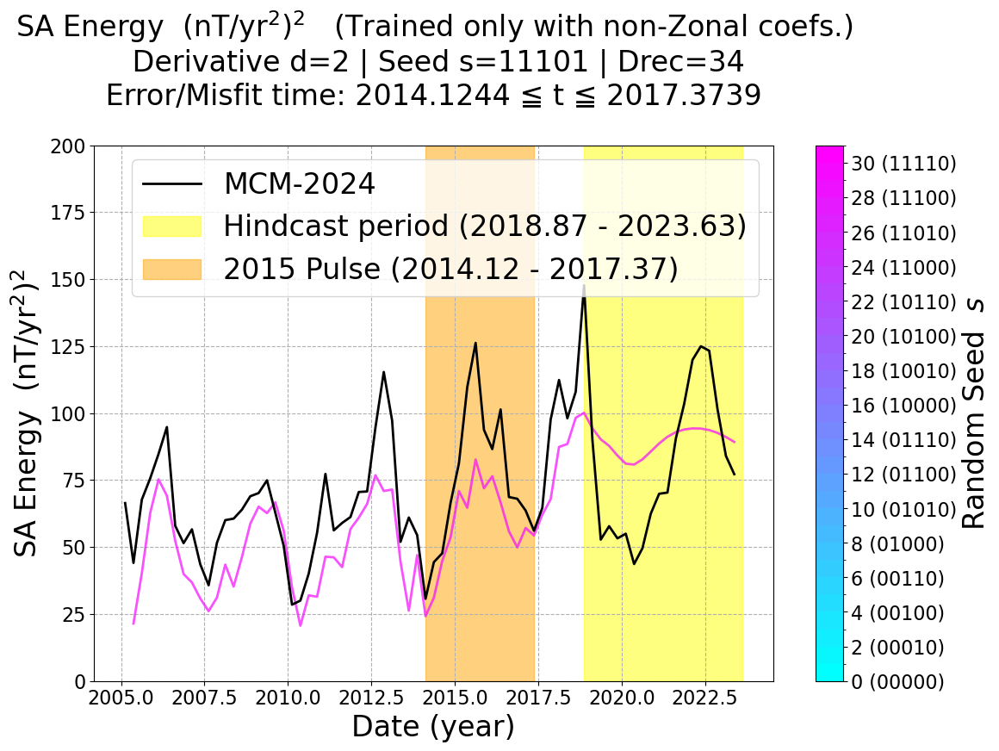

In [43]:
# plot SA Energy series for s=29
for diff in [2]:

    fig, ax = plt.subplots(1, 1, figsize=(12, 9))

    cmap = mpl.colormaps['cool']
    norm = BoundaryNorm(plot_table.columns, cmap.N)
    seed_l = plot_table.columns[0:31:2]

    for s in [29]:
        b_seed = format(s, '05b')
        hindcast = np.load(f".{save_dir}/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)

        SA_time = hindcast['time_memo'] - 0.2502  # adjust time for SA leapfrog
        SA_memo = hindcast['d2g_memo'] # RNN prediction of SA

        SA_memo = if_nan_SAgenerate(SA_memo, hindcast, diff=diff)

        SA_Energy_col = get_energy(SA_memo, SA_time, hindcast['columns'][:J])
        SA_Energy_tot = SA_Energy_col[1:, :].sum(axis=0)

        # print(SA_Energy_col[0, :], SA_Energy_tot)

        ax.plot(SA_Energy_col[0, :], SA_Energy_tot, 
                c=cmap(norm(s)), alpha=0.7)


    SA_ref = coef_raw[2].loc[hindcast['time_memo'], :].values.T # Reference SA time series
    SA_Energy_ref_col = get_energy(SA_ref, hindcast['time_memo'] - 0.2502, hindcast['columns'][:J])
    SA_Energy_ref_tot = SA_Energy_ref_col[1:, :].sum(axis=0)
    ax.plot(SA_Energy_ref_col[0, :], SA_Energy_ref_tot, c='black', label='MCM-2024')


    p = ax.scatter([np.nan]*32, [np.nan]*32, cmap=cmap, norm=norm, c=range(32), alpha=1.0, marker='none')
    ax.colorbar = plt.colorbar(p, ax=ax)
    ax.colorbar.set_label(r"Random Seed  $s$", fontsize=f_large)
    # print([f"{seed} ({format(seed, '05b')})" for seed in seed_l])
    ax.colorbar.set_ticks                                                    (seed_l)
    ax.colorbar.set_ticklabels([f"{seed} ({format(seed, '05b')})" for seed in seed_l])


    ymin, ymax = 0, 200
    ax.set_ylim(ymin, ymax)

    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=fS) & (hindcast['time_memo']<=fE), 
                    color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')
    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=TS-0.2502) & (hindcast['time_memo']<=TE-0.2502), 
                    color='orange', alpha=0.5, label=f'2015 Pulse ({TS-0.25:.2f} - {TE-0.25:.2f})')

    ax.set_xlabel('Date (year)', fontsize=f_large)
    ax.set_ylabel(r"SA Energy  (nT/yr$^2$)$^2$", fontsize=f_large)
    ax.set_title(r"SA Energy  (nT/yr$^2$)$^2$   (Trained only with non-Zonal coefs.)" + 
                f"\n Derivative d={diff} | Seed s=11101 | Drec=34" + 
                f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
                fontsize=f_large)
    ax.legend(fontsize=f_large)
    plt.tight_layout()
    plt.show()

## Compare with Zonal terms included model results

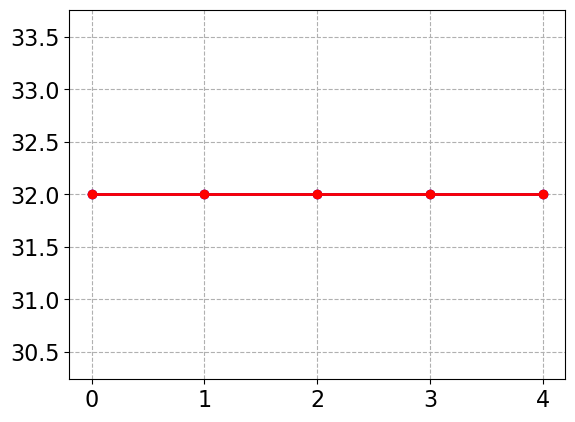

In [44]:
plt.plot(yZnZ_nLOD_SAddP.T.count(axis=0), "bo-")
plt.plot(nZnZ_nLOD_SAddP.T.count(axis=0), "ro-")

['0 (00000)', '2 (00010)', '4 (00100)', '6 (00110)', '8 (01000)', '10 (01010)', '12 (01100)', '14 (01110)', '16 (10000)', '18 (10010)', '20 (10100)', '22 (10110)', '24 (11000)', '26 (11010)', '28 (11100)', '30 (11110)']


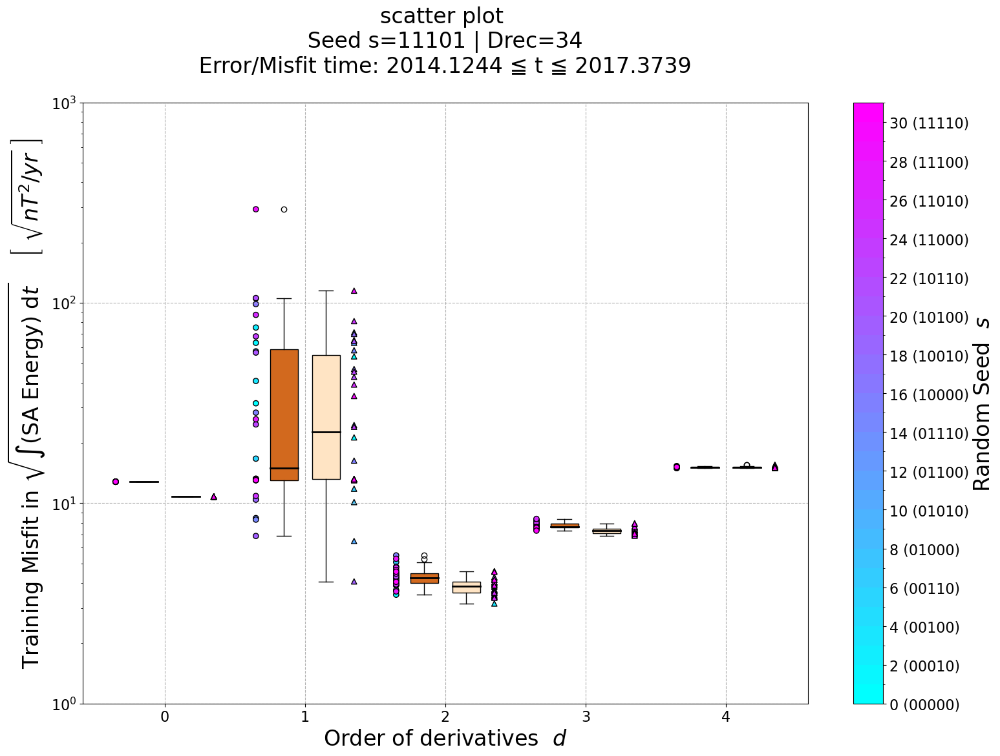

In [45]:
fig, ax = plt.subplots(1, 1, figsize=(16, 12))


plot_table = yZnZ_nLOD_SAddP
cmap = mpl.colormaps['cool']
norm = BoundaryNorm(plot_table.columns, cmap.N)
seed_l = plot_table.columns[0:31:2]
padding = 0.1
offset = 0.25
for d in range(5):
    ax.boxplot(plot_table.loc[d, :].values, positions=[d - offset + padding], 
               widths=0.2, patch_artist=True, manage_ticks=False,
               boxprops=dict(color="black", facecolor="chocolate"),
               medianprops=dict(color="black", linewidth=2.0),)
    p = ax.scatter([d - offset - padding]*32, plot_table.loc[d, :].values,
                   cmap=cmap, norm=norm, c=plot_table.columns, alpha=1.0,
                   marker="o", edgecolors="black",
                   label=f"Derivatives={d}")


ax.colorbar = plt.colorbar(p, ax=ax)
ax.colorbar.set_label(r"Random Seed  $s$", fontsize=f_large)

print([f"{seed} ({format(seed, '05b')})" for seed in seed_l])
ax.colorbar.set_ticks                                                    (seed_l)
ax.colorbar.set_ticklabels([f"{seed} ({format(seed, '05b')})" for seed in seed_l])


plot_table = nZnZ_nLOD_SAddP
padding = 0.1
offset = 0.25
for d in range(5):
    ax.boxplot(plot_table.loc[d, :].values, positions=[d + offset - padding], 
               widths=0.2, patch_artist=True, manage_ticks=False,
               boxprops=dict(color="black", facecolor="bisque"),
               medianprops=dict(color="black", linewidth=2.0),)
    p = ax.scatter([d + offset + padding]*32, plot_table.loc[d, :].values,
                   cmap=cmap, norm=norm, c=plot_table.columns, alpha=1.0,
                   marker="^", edgecolors="black",
                   label=f"Derivatives={d}")

ax.set_xticks(range(5))
ax.set_ylim(1, 1000)
ax.set_yscale('log')
ax.set_xlabel(r"Order of derivatives  $d$", fontsize=f_large)
ax.set_ylabel(r"Training Misfit in $\sqrt{\int (\mathrm{SA \ Energy}) \ \mathrm{d}t}$    $\left[ \ \sqrt{nT^2/yr} \ \right]$", fontsize=f_large)

ax.set_title(f"scatter plot \n Seed s=11101 | Drec=34 \n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", fontsize=f_large)
plt.tight_layout()
plt.show()

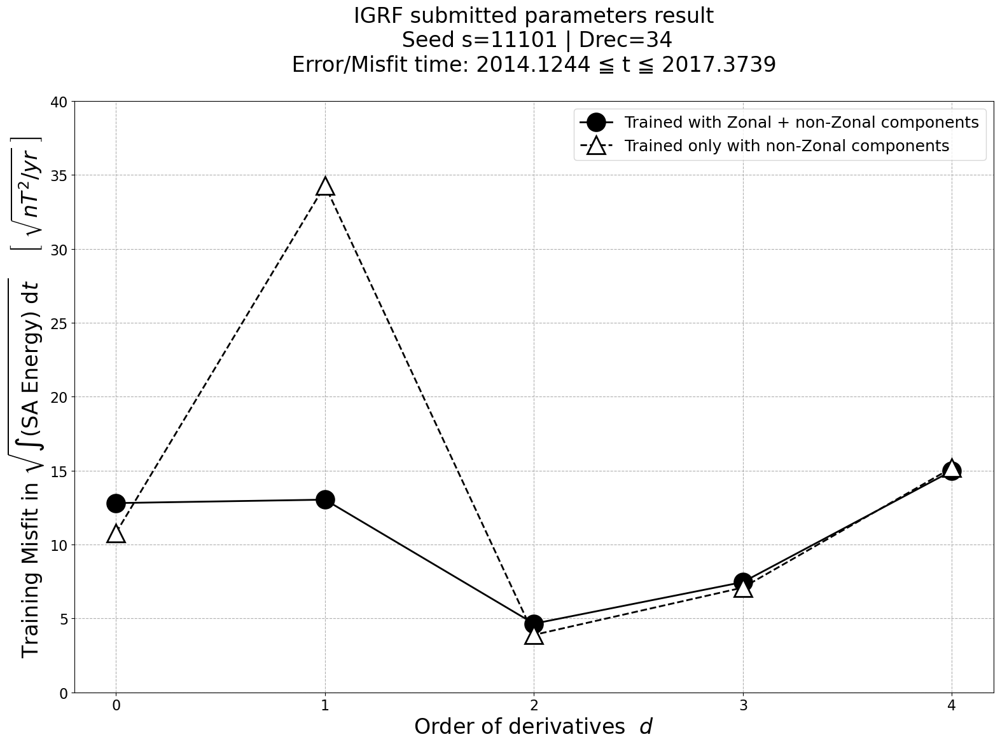

In [46]:
fig, ax = plt.subplots(1, 1, figsize=(16, 12))

ax.plot(yZnZ_nLOD_SAddP.index, yZnZ_nLOD_SAddP.loc[:, IGRF_s].values, 
        marker="o", markersize=20, markeredgewidth=2, linestyle="-", linewidth=2.0, color="black", 
        markerfacecolor='black', markeredgecolor='black', 
        label="Trained with Zonal + non-Zonal components")

ax.plot(nZnZ_nLOD_SAddP.index, nZnZ_nLOD_SAddP.loc[:, IGRF_s].values, 
        marker="^", markersize=20, markeredgewidth=2, linestyle="dashed", linewidth=2.0, color="black", 
        markerfacecolor='white', markeredgecolor='black', 
        label="Trained only with non-Zonal components")

ax.set_xticks(range(5))
ax.set_ylim(0, 40)
# ax.set_yscale('log')
ax.set_xlabel(r"Order of derivatives  $d$", fontsize=f_large)
ax.set_ylabel(r"Training Misfit in $\sqrt{\int (\mathrm{SA \ Energy}) \ \mathrm{d}t}$    $\left[ \ \sqrt{nT^2/yr} \ \right]$", fontsize=f_large)

ax.set_title(f"IGRF submitted parameters result" + 
             "\n Seed s=11101 | Drec=34" + 
             f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
             fontsize=f_large)
plt.legend(fontsize=f_medium, loc='upper right')
plt.tight_layout()
plt.show()

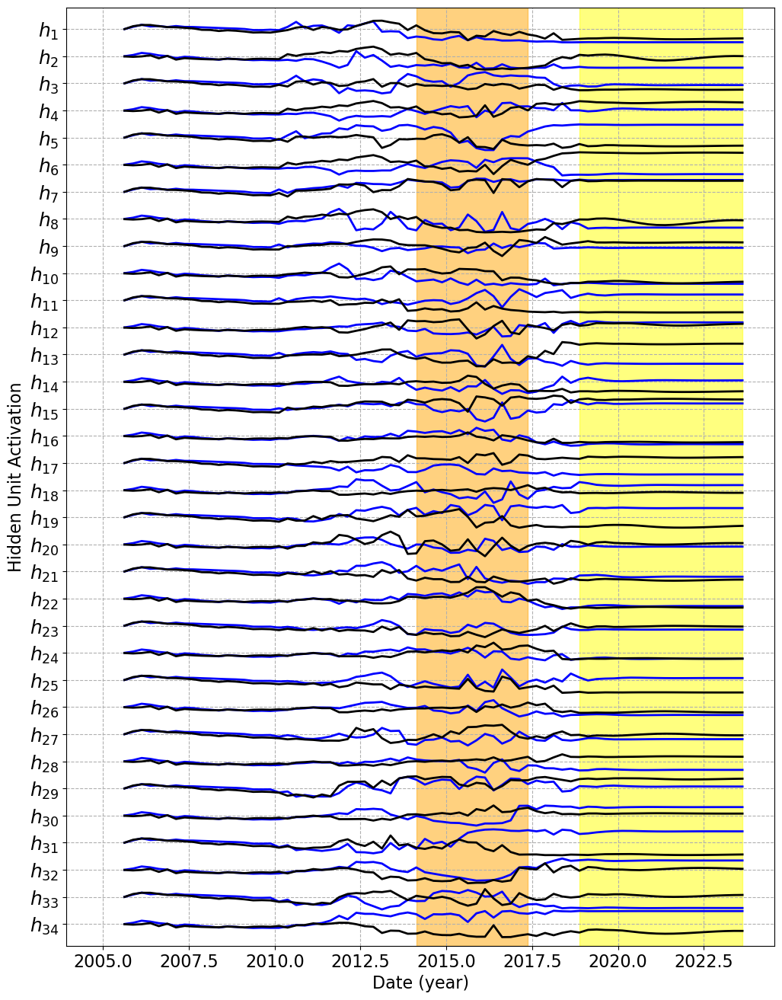

In [47]:
## Hidden layer states
diff = 2
b_seed = format(29, '05b')

yZonal = np.load(f"../trained_models/2025_1017_Zonal/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)
fig, ax = plot_ht(yZonal["ht_memo"], yZonal['time_memo'], color="blue", fontsize=f_medium)

nZonal = np.load(f"../trained_models/2025_1018_nonZonal/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)
fig, ax = plot_ht(nZonal["ht_memo"], nZonal['time_memo'], color="black", fontsize=f_medium, fig_ax=(fig, ax))

ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, ymax)

ax.fill_between(yZonal['time_memo'], ymin, ymax, 
            where=(yZonal['time_memo']>=fS) & (yZonal['time_memo']<=fE), 
            color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')
ax.fill_between(yZonal['time_memo'], ymin, ymax, 
            where=(yZonal['time_memo']>=TS-0.2502) & (yZonal['time_memo']<=TE-0.2502), 
            color='orange', alpha=0.5, label=f'2015 Pulse ({TS-0.25:.2f} - {TE-0.25:.2f})')
plt.show()

# with LOD input

## with Zonal + non-Zonal components x LOD input

In [48]:
save_dir = "./trained_models/2025_1108_LODZonal"
J = 195 + 1 # Number of Gauss coefficients up to degree n=13, excluding zonal terms + LOD
print("J =", J)

J = 196


In [49]:
print(f"target_epoch = {TS} - {TE}")
CF_ref = coef_raw[0].loc[TS:TE, :].values.T # Reference CF at target_epoch
SV_ref = coef_raw[1].loc[TS:TE, :].values.T # Reference SV at target_epoch
SA_ref = coef_raw[2].loc[TS:TE, :].values.T # Reference SA at target_epoch
TG_ref = SA_ref # target field
print(TG_ref.shape, "\n", TG_ref[:5])

target_epoch = 2014.3745999999999 - 2017.6241
(182, 14) 
 [[-0.84160 -1.54400 -1.83680 -3.33120 -2.93760 -3.03680 -4.02880 -4.25760
  -2.65600 -3.20320 -3.54720 -2.68320 -1.98400 -1.60800]
 [ 0.86560  0.15680 -0.62880 -0.57600 -1.70240 -2.88000 -2.77600 -0.81280
  -1.46560 -1.59680 -0.02560  0.78400  0.36800  0.88960]
 [-1.04640 -1.46240 -1.65920 -0.34560 -0.19840 -1.87840 -1.68960  0.93120
   0.81760 -1.89280 -0.97280 -0.17120 -1.21920 -1.46080]
 [-0.57120  0.15680 -0.08480  0.55840 -2.10720 -1.48800 -0.35840  0.77280
  -2.21920 -0.96000 -0.40160 -0.80160 -1.38880 -0.91680]
 [-0.04160  0.12640 -0.07040 -0.68640 -0.44480  0.42880  0.35840 -0.32960
  -0.31360  0.62880 -0.85920 -1.61760 -1.23360 -0.92960]]


In [50]:
test_memos = np.load(f".{save_dir}/d0g_{Drec}_11101_geomag_memos.npz", allow_pickle=True)

print(test_memos['columns'])

CF_time = test_memos['time_memo']   # time - leap frog
print("CF_time:", CF_time)

tS_idx = np.abs(CF_time - TS).argmin()
tE_idx = np.abs(CF_time - TE).argmin()
t_indices = np.arange(tS_idx, tE_idx + 1)
print(t_indices)
print(f"t_indices from {tS_idx} to {tE_idx} ({len(t_indices)} points) --> ", end="\n")

SA_memo = test_memos['d2g_memo'] # RNN prediction of SA
SV_memo = test_memos['d1g_memo'] # RNN prediction of SV
CF_memo = test_memos['d0g_memo'] # RNN prediction of Core field

TG_memo = SV_memo # target field
TG_rnn  = TG_memo[:, t_indices]

print(SA_memo.shape, SV_memo.shape, CF_memo.shape)
print(TG_rnn.shape)
print(TG_rnn)

['g(1,0)' 'g(1,1)' 'h(1,1)' 'g(2,0)' 'g(2,1)' 'h(2,1)' 'g(2,2)' 'h(2,2)'
 'g(3,0)' 'g(3,1)' 'h(3,1)' 'g(3,2)' 'h(3,2)' 'g(3,3)' 'h(3,3)' 'g(4,0)'
 'g(4,1)' 'h(4,1)' 'g(4,2)' 'h(4,2)' 'g(4,3)' 'h(4,3)' 'g(4,4)' 'h(4,4)'
 'g(5,0)' 'g(5,1)' 'h(5,1)' 'g(5,2)' 'h(5,2)' 'g(5,3)' 'h(5,3)' 'g(5,4)'
 'h(5,4)' 'g(5,5)' 'h(5,5)' 'g(6,0)' 'g(6,1)' 'h(6,1)' 'g(6,2)' 'h(6,2)'
 'g(6,3)' 'h(6,3)' 'g(6,4)' 'h(6,4)' 'g(6,5)' 'h(6,5)' 'g(6,6)' 'h(6,6)'
 'g(7,0)' 'g(7,1)' 'h(7,1)' 'g(7,2)' 'h(7,2)' 'g(7,3)' 'h(7,3)' 'g(7,4)'
 'h(7,4)' 'g(7,5)' 'h(7,5)' 'g(7,6)' 'h(7,6)' 'g(7,7)' 'h(7,7)' 'g(8,0)'
 'g(8,1)' 'h(8,1)' 'g(8,2)' 'h(8,2)' 'g(8,3)' 'h(8,3)' 'g(8,4)' 'h(8,4)'
 'g(8,5)' 'h(8,5)' 'g(8,6)' 'h(8,6)' 'g(8,7)' 'h(8,7)' 'g(8,8)' 'h(8,8)'
 'g(9,0)' 'g(9,1)' 'h(9,1)' 'g(9,2)' 'h(9,2)' 'g(9,3)' 'h(9,3)' 'g(9,4)'
 'h(9,4)' 'g(9,5)' 'h(9,5)' 'g(9,6)' 'h(9,6)' 'g(9,7)' 'h(9,7)' 'g(9,8)'
 'h(9,8)' 'g(9,9)' 'h(9,9)' 'g(10,0)' 'g(10,1)' 'h(10,1)' 'g(10,2)'
 'h(10,2)' 'g(10,3)' 'h(10,3)' 'g(10,4)' 'h(10,4)' 'g(10

In [51]:
print(test_memos['d0g_memo'][:5, t_idx-5:t_idx])
print(test_memos['d0R_memo'][:5, t_idx-5:t_idx])

[[-29438.32230 -29438.32230 -29438.32230 -29438.32230 -29438.32230]
 [ -1498.94323  -1498.94323  -1498.94323  -1498.94323  -1498.94323]
 [  4779.88976   4779.88976   4779.88976   4779.88976   4779.88976]
 [ -2452.23883  -2452.23883  -2452.23883  -2452.23883  -2452.23883]
 [  3007.47606   3007.47606   3007.47606   3007.47606   3007.47606]]
[[nan nan nan nan nan]
 [nan nan nan nan nan]
 [nan nan nan nan nan]
 [nan nan nan nan nan]
 [nan nan nan nan nan]]


In [52]:
### Compute ddP table
yZnZ_yLOD_SAddP = pd.DataFrame(index=np.arange(0, 5), columns=np.arange(0, 32), dtype=float)
for d_max in range(5):
    for seed in range(0, 32):
        b_seed = format(seed, '05b') # seed No. as 5-bit binary

        filename = f"d{d_max}g_{Drec}_{b_seed}_geomag_memos.npz"

        read_file = f".{save_dir}/{filename}"

        print(f"reading {(d_max, Drec, b_seed)}: ", end="")

        try:
            pred_memos = np.load(read_file, allow_pickle=True)
        except Exception as e:
            print(f"Error loading {read_file}: {e}")
            continue
        
        print(f"loaded --> ", end="\n")
        
        CF_time = pred_memos['time_memo'] # time - leap frog
        CF_cols = pred_memos['columns']   # target field columns
        SA_memo = pred_memos['d2g_memo']  # RNN prediction of SA

        SA_memo = if_nan_SAgenerate(SA_memo, pred_memos, diff=d_max)

        TG_memo, CF_cols = remove_zonal_g(SA_memo[:J-1, :], CF_cols[:J-1]) # target field (exclude LOD at the end J-1)

        print(f"time={CF_time.shape}, shape={TG_memo.shape} --> ", end="")

        # t_idx = np.where(CF_time == target_epoch)[0][0]
        # print(f"t_idx={fE_idx} --> ", end="")

        # 範囲インデックス配列の作成
        tS_idx = np.abs(CF_time - TS).argmin()
        tE_idx = np.abs(CF_time - TE).argmin()
        t_indices = np.arange(tS_idx, tE_idx + 1)
        print(f"t_indices from {tS_idx} to {tE_idx} ({len(t_indices)} points) --> ", end="")

        TG_rnn = TG_memo[:, t_indices] # multiple time steps
        error  = TG_rnn - TG_ref
        print("error.shape: ", error.shape, len(CF_cols), "--> ", end="")
        
        ddP2 = get_energy(error, CF_time[t_indices], CF_cols)
        # print("ddP2:", ddP2)
        print("ddP2.shape", ddP2.shape, len(CF_cols), "--> ", end="")
        sqrtddP = np.sqrt(np.trapz(ddP2[1:, :].sum(axis=0), CF_time[t_indices])) # integrate over time

        print(f"sqrt(ddP)={sqrtddP:.4f} nT --> ", end="")
        yZnZ_yLOD_SAddP.loc[d_max, seed] = sqrtddP

        print("ddP table done", end="\n")


reading (0, 34, '00000'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(182, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 14) 182 --> ddP2.shape (14, 14) 182 --> sqrt(ddP)=12.8032 nT --> ddP table done
reading (0, 34, '00001'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(182, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 14) 182 --> ddP2.shape (14, 14) 182 --> sqrt(ddP)=12.8032 nT --> ddP table done
reading (0, 34, '00010'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(182, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 14) 182 --> ddP2.shape (14, 14) 182 --> sqrt(ddP)=12.8032 nT --> ddP table done
reading (0, 34, '00011'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(182, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 

In [53]:
display(yZnZ_yLOD_SAddP.T)
display(yZnZ_yLOD_SAddP.T.describe())

,0,1,2,3,4
0,12.80322,18.33214,4.48734,7.76250,15.21878
1,12.80322,41.65324,4.77993,7.24481,15.18164
2,12.80322,54.57124,4.52514,7.35270,15.17303
3,12.80322,25.06787,3.32826,7.82499,15.42500
4,12.80322,4.22712,4.97787,7.74877,15.13462
5,12.80322,20.23571,4.29185,7.40405,15.12650
6,12.80322,162.16760,5.90668,7.92786,15.22530
7,12.80322,13.25122,4.97036,7.85817,15.18591
8,12.80322,6.43291,4.01039,8.21496,15.21672
9,12.80322,15.07096,4.43145,7.67964,15.09950


,0,1,2,3,4
count,29.00000,29.00000,29.00000,29.00000,28.00000
mean,12.80322,41.77557,4.47651,7.61611,15.22644
std,0.00000,64.23535,0.51561,0.25304,0.13113
min,12.80322,4.22712,3.32826,7.24481,15.05299
25%,12.80322,13.02457,4.20532,7.37797,15.13656
50%,12.80322,15.07096,4.48190,7.66017,15.18955
75%,12.80322,41.65324,4.85661,7.76563,15.24846
max,12.80322,315.88800,5.90668,8.21496,15.59280


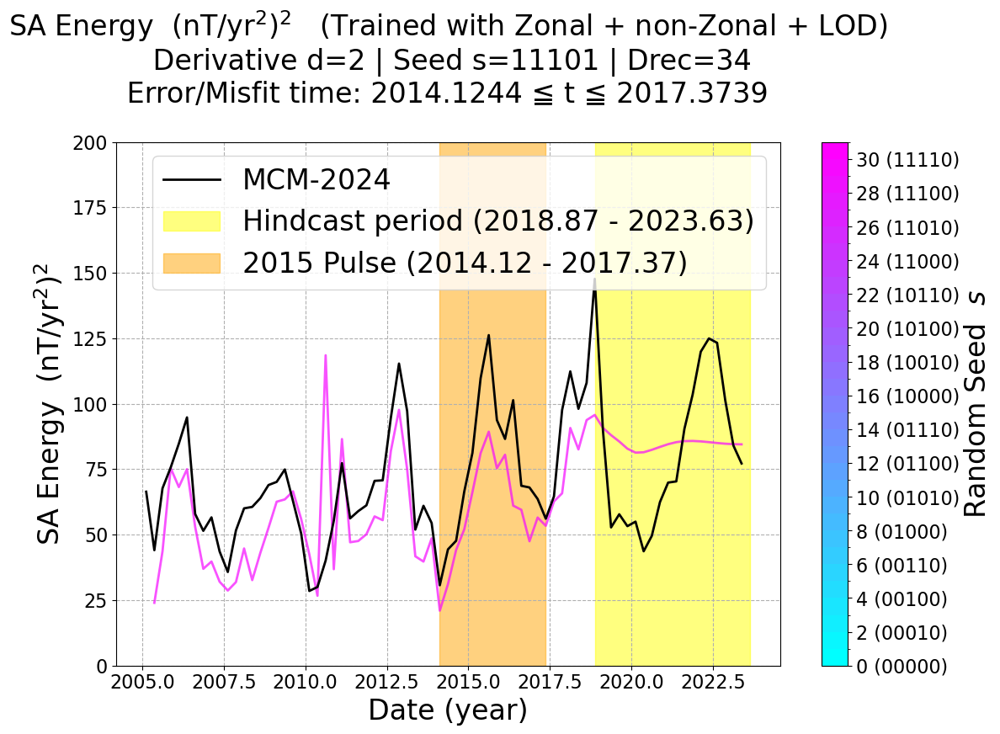

In [54]:
# plot SA Energy series for s=29
for diff in [2]:

    fig, ax = plt.subplots(1, 1, figsize=(12, 9))

    cmap = mpl.colormaps['cool']
    norm = BoundaryNorm(plot_table.columns, cmap.N)
    seed_l = plot_table.columns[0:31:2]

    for s in [29]:
        b_seed = format(s, '05b')
        hindcast = np.load(f".{save_dir}/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)

        SA_time = hindcast['time_memo'] - 0.2502  # adjust time for SA leapfrog
        SA_memo = hindcast['d2g_memo'][:J-1] # RNN prediction of SA (exclude LOD at the end J-1)

        SA_memo = if_nan_SAgenerate(SA_memo, hindcast, diff=diff)
        SA_memo, nZcolumns = remove_zonal_g(SA_memo, hindcast['columns'][:J-1])

        SA_Energy_col = get_energy(SA_memo, SA_time, nZcolumns)
        SA_Energy_tot = SA_Energy_col[1:, :].sum(axis=0)

        # print(SA_Energy_col[0, :], SA_Energy_tot)

        ax.plot(SA_Energy_col[0, :], SA_Energy_tot, 
                c=cmap(norm(s)), alpha=0.7)


    SA_ref = coef_raw[2].loc[hindcast['time_memo'], :].values.T # Reference SA time series
    SA_Energy_ref_col = get_energy(SA_ref, hindcast['time_memo'] - 0.2502, nZcolumns)
    SA_Energy_ref_tot = SA_Energy_ref_col[1:, :].sum(axis=0)
    ax.plot(SA_Energy_ref_col[0, :], SA_Energy_ref_tot, c='black', label='MCM-2024')


    p = ax.scatter([np.nan]*32, [np.nan]*32, cmap=cmap, norm=norm, c=range(32), alpha=1.0, marker='none')
    ax.colorbar = plt.colorbar(p, ax=ax)
    ax.colorbar.set_label(r"Random Seed  $s$", fontsize=f_large)
    # print([f"{seed} ({format(seed, '05b')})" for seed in seed_l])
    ax.colorbar.set_ticks                                                    (seed_l)
    ax.colorbar.set_ticklabels([f"{seed} ({format(seed, '05b')})" for seed in seed_l])


    ymin, ymax = 0, 200
    ax.set_ylim(ymin, ymax)

    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=fS) & (hindcast['time_memo']<=fE), 
                    color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')
    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=TS-0.2502) & (hindcast['time_memo']<=TE-0.2502), 
                    color='orange', alpha=0.5, label=f'2015 Pulse ({TS-0.25:.2f} - {TE-0.25:.2f})')

    ax.set_xlabel('Date (year)', fontsize=f_large)
    ax.set_ylabel(r"SA Energy  (nT/yr$^2$)$^2$", fontsize=f_large)
    ax.set_title(r"SA Energy  (nT/yr$^2$)$^2$   (Trained with Zonal + non-Zonal + LOD)" + 
                f"\n Derivative d={diff} | Seed s=11101 | Drec=34" + 
                f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
                fontsize=f_large)
    ax.legend(fontsize=f_large)
    plt.tight_layout()
    plt.show()

## with only non-Zonal components x LOD input

In [55]:
save_dir = "./trained_models/2025_1106_LODnonZonal"
J = 195 - 13 + 1 # Number of Gauss coefficients up to degree n=13, excluding zonal terms + LOD
print("J =", J)

J = 183


In [56]:
print(f"target_epoch = {TS} - {TE}")
CF_ref = coef_raw[0].loc[TS:TE, :].values.T # Reference CF at target_epoch
SV_ref = coef_raw[1].loc[TS:TE, :].values.T # Reference SV at target_epoch
SA_ref = coef_raw[2].loc[TS:TE, :].values.T # Reference SA at target_epoch
TG_ref = SA_ref # target field
print(TG_ref.shape, "\n", TG_ref[:5])

target_epoch = 2014.3745999999999 - 2017.6241
(182, 14) 
 [[-0.84160 -1.54400 -1.83680 -3.33120 -2.93760 -3.03680 -4.02880 -4.25760
  -2.65600 -3.20320 -3.54720 -2.68320 -1.98400 -1.60800]
 [ 0.86560  0.15680 -0.62880 -0.57600 -1.70240 -2.88000 -2.77600 -0.81280
  -1.46560 -1.59680 -0.02560  0.78400  0.36800  0.88960]
 [-1.04640 -1.46240 -1.65920 -0.34560 -0.19840 -1.87840 -1.68960  0.93120
   0.81760 -1.89280 -0.97280 -0.17120 -1.21920 -1.46080]
 [-0.57120  0.15680 -0.08480  0.55840 -2.10720 -1.48800 -0.35840  0.77280
  -2.21920 -0.96000 -0.40160 -0.80160 -1.38880 -0.91680]
 [-0.04160  0.12640 -0.07040 -0.68640 -0.44480  0.42880  0.35840 -0.32960
  -0.31360  0.62880 -0.85920 -1.61760 -1.23360 -0.92960]]


In [57]:
test_memos = np.load(f".{save_dir}/d0g_{Drec}_00000_geomag_memos.npz", allow_pickle=True)

print(test_memos['columns'])

CF_time = test_memos['time_memo']   # time - leap frog
print("CF_time:", CF_time)

tS_idx = np.abs(CF_time - TS).argmin()
tE_idx = np.abs(CF_time - TE).argmin()
t_indices = np.arange(tS_idx, tE_idx + 1)
print(t_indices)
print(f"t_indices from {tS_idx} to {tE_idx} ({len(t_indices)} points) --> ", end="\n")

SA_memo = test_memos['d2g_memo'] # RNN prediction of SA
SV_memo = test_memos['d1g_memo'] # RNN prediction of SV
CF_memo = test_memos['d0g_memo'] # RNN prediction of Core field

TG_memo = SV_memo # target field
TG_rnn  = TG_memo[:, t_indices]

print(SA_memo.shape, SV_memo.shape, CF_memo.shape)
print(TG_rnn.shape)
print(TG_rnn)

['g(1,1)' 'h(1,1)' 'g(2,1)' 'h(2,1)' 'g(2,2)' 'h(2,2)' 'g(3,1)' 'h(3,1)'
 'g(3,2)' 'h(3,2)' 'g(3,3)' 'h(3,3)' 'g(4,1)' 'h(4,1)' 'g(4,2)' 'h(4,2)'
 'g(4,3)' 'h(4,3)' 'g(4,4)' 'h(4,4)' 'g(5,1)' 'h(5,1)' 'g(5,2)' 'h(5,2)'
 'g(5,3)' 'h(5,3)' 'g(5,4)' 'h(5,4)' 'g(5,5)' 'h(5,5)' 'g(6,1)' 'h(6,1)'
 'g(6,2)' 'h(6,2)' 'g(6,3)' 'h(6,3)' 'g(6,4)' 'h(6,4)' 'g(6,5)' 'h(6,5)'
 'g(6,6)' 'h(6,6)' 'g(7,1)' 'h(7,1)' 'g(7,2)' 'h(7,2)' 'g(7,3)' 'h(7,3)'
 'g(7,4)' 'h(7,4)' 'g(7,5)' 'h(7,5)' 'g(7,6)' 'h(7,6)' 'g(7,7)' 'h(7,7)'
 'g(8,1)' 'h(8,1)' 'g(8,2)' 'h(8,2)' 'g(8,3)' 'h(8,3)' 'g(8,4)' 'h(8,4)'
 'g(8,5)' 'h(8,5)' 'g(8,6)' 'h(8,6)' 'g(8,7)' 'h(8,7)' 'g(8,8)' 'h(8,8)'
 'g(9,1)' 'h(9,1)' 'g(9,2)' 'h(9,2)' 'g(9,3)' 'h(9,3)' 'g(9,4)' 'h(9,4)'
 'g(9,5)' 'h(9,5)' 'g(9,6)' 'h(9,6)' 'g(9,7)' 'h(9,7)' 'g(9,8)' 'h(9,8)'
 'g(9,9)' 'h(9,9)' 'g(10,1)' 'h(10,1)' 'g(10,2)' 'h(10,2)' 'g(10,3)'
 'h(10,3)' 'g(10,4)' 'h(10,4)' 'g(10,5)' 'h(10,5)' 'g(10,6)' 'h(10,6)'
 'g(10,7)' 'h(10,7)' 'g(10,8)' 'h(10,8)' 'g(10,9)' 'h(10,

In [58]:
print(test_memos['d0g_memo'][:5, t_idx-5:t_idx])
print(test_memos['d0R_memo'][:5, t_idx-5:t_idx])

[[-1483.21564 -1483.21564 -1483.21564 -1483.21564 -1483.21564]
 [ 4749.17603  4749.17603  4749.17603  4749.17603  4749.17603]
 [ 3003.05127  3003.05127  3003.05127  3003.05127  3003.05127]
 [-2894.44289 -2894.44289 -2894.44289 -2894.44289 -2894.44289]
 [ 1678.37611  1678.37611  1678.37611  1678.37611  1678.37611]]
[[nan nan nan nan nan]
 [nan nan nan nan nan]
 [nan nan nan nan nan]
 [nan nan nan nan nan]
 [nan nan nan nan nan]]


In [59]:
### Compute ddP table
nZnZ_yLOD_SAddP = pd.DataFrame(index=np.arange(0, 5), columns=np.arange(0, 32), dtype=float)
for d_max in range(5):
    for seed in range(0, 32):
        b_seed = format(seed, '05b') # seed No. as 5-bit binary

        filename = f"d{d_max}g_{Drec}_{b_seed}_geomag_memos.npz"

        read_file = f".{save_dir}/{filename}"

        print(f"reading {(d_max, Drec, b_seed)}: ", end="")

        try:
            pred_memos = np.load(read_file, allow_pickle=True)
        except Exception as e:
            print(f"Error loading {read_file}: {e}")
            continue
        
        print(f"loaded --> ", end="\n")
        
        CF_time = pred_memos['time_memo'] # time - leap frog
        CF_cols = pred_memos['columns']   # target field columns
        SA_memo = pred_memos['d2g_memo']  # RNN prediction of SA

        SA_memo = if_nan_SAgenerate(SA_memo, pred_memos, diff=d_max)

        TG_memo, CF_cols = remove_zonal_g(SA_memo[:J-1, :], CF_cols[:J-1]) # target field (exclude LOD at the end J-1)

        print(f"time={CF_time.shape}, shape={TG_memo.shape} --> ", end="")

        # t_idx = np.where(CF_time == target_epoch)[0][0]
        # print(f"t_idx={fE_idx} --> ", end="")

        # 範囲インデックス配列の作成
        tS_idx = np.abs(CF_time - TS).argmin()
        tE_idx = np.abs(CF_time - TE).argmin()
        t_indices = np.arange(tS_idx, tE_idx + 1)
        print(f"t_indices from {tS_idx} to {tE_idx} ({len(t_indices)} points) --> ", end="")

        TG_rnn = TG_memo[:, t_indices] # multiple time steps
        error  = TG_rnn - TG_ref
        print("error.shape: ", error.shape, len(CF_cols), "--> ", end="")
        
        ddP2 = get_energy(error, CF_time[t_indices], CF_cols)
        # print("ddP2:", ddP2)
        print("ddP2.shape", ddP2.shape, len(CF_cols), "--> ", end="")
        sqrtddP = np.sqrt(np.trapz(ddP2[1:, :].sum(axis=0), CF_time[t_indices])) # integrate over time

        print(f"sqrt(ddP)={sqrtddP:.4f} nT --> ", end="")
        nZnZ_yLOD_SAddP.loc[d_max, seed] = sqrtddP

        print("ddP table done", end="\n")


reading (0, 34, '00000'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(182, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 14) 182 --> ddP2.shape (14, 14) 182 --> sqrt(ddP)=10.7924 nT --> ddP table done
reading (0, 34, '00001'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(182, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 14) 182 --> ddP2.shape (14, 14) 182 --> sqrt(ddP)=10.7924 nT --> ddP table done
reading (0, 34, '00010'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(182, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 14) 182 --> ddP2.shape (14, 14) 182 --> sqrt(ddP)=10.7924 nT --> ddP table done
reading (0, 34, '00011'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(182, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (182, 

In [60]:
display(nZnZ_yLOD_SAddP.T)
display(nZnZ_yLOD_SAddP.T.describe())

,0,1,2,3,4
0,10.79235,11.40928,3.91549,7.23184,15.08753
1,10.79235,104.37603,4.57263,7.19886,15.17093
2,10.79235,44.58209,3.55141,7.05180,15.30344
3,10.79235,51.95998,3.65775,7.50665,15.12231
4,10.79235,13.17778,4.81132,6.72215,15.04763
5,10.79235,11.39106,3.64775,7.18906,15.15214
6,10.79235,11.66871,3.36389,7.14917,15.10218
7,10.79235,5.87484,4.08969,7.31027,15.28893
8,10.79235,13.02634,3.56043,7.49166,14.93874
9,10.79235,13.17598,3.55888,7.11490,15.09561


,0,1,2,3,4
count,32.00000,32.00000,32.00000,32.00000,32.00000
mean,10.79235,32.61811,3.87941,7.21624,15.11598
std,0.00000,32.20184,0.50785,0.25548,0.13198
min,10.79235,5.87484,3.06907,6.72215,14.91018
25%,10.79235,12.68693,3.55340,7.07390,15.01483
50%,10.79235,13.19951,3.70122,7.19396,15.10100
75%,10.79235,44.04229,4.26471,7.36697,15.19352
max,10.79235,133.83325,4.85520,8.11386,15.42056


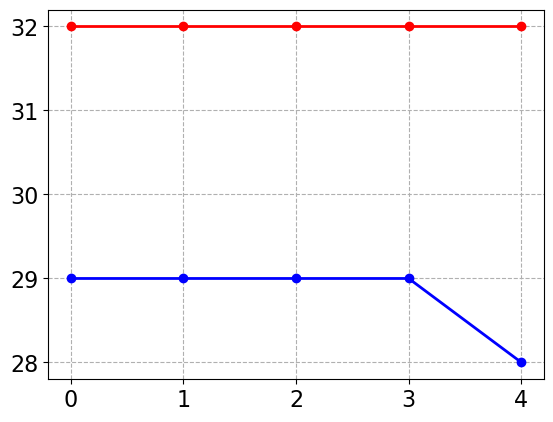

In [61]:
plt.plot(yZnZ_yLOD_SAddP.T.count(axis=0), "bo-")
plt.plot(nZnZ_yLOD_SAddP.T.count(axis=0), "ro-")

## Plotting results with IGRF-14 parameters
- `s = 0, '11101'`  # seed for initial `w0`
- `Drec = 34`


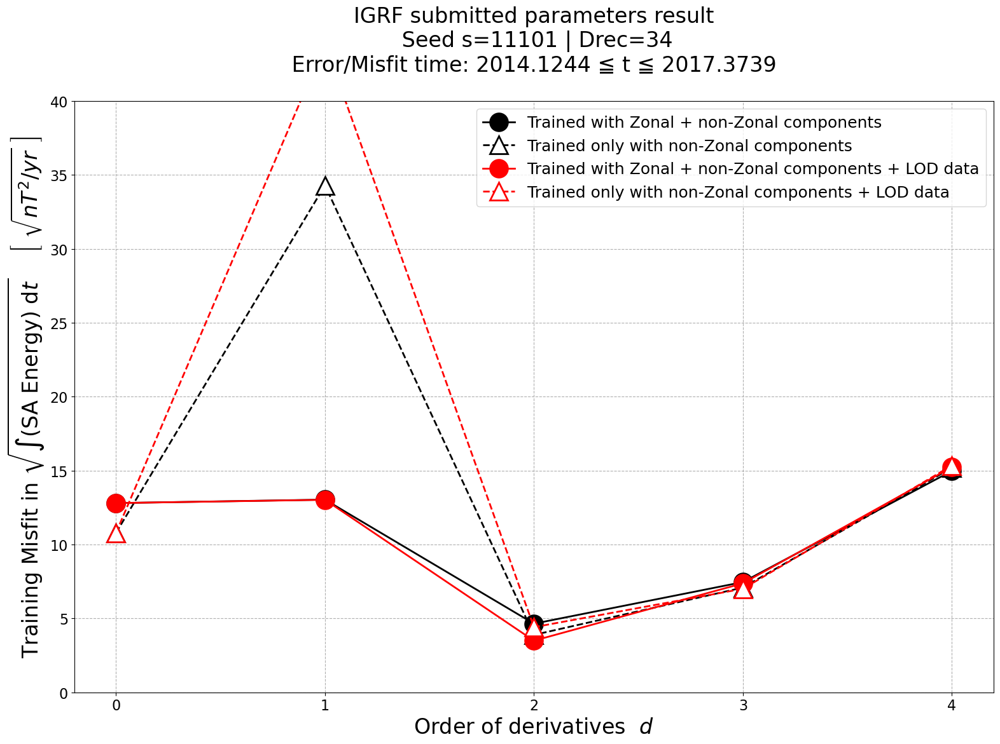

In [62]:
fig, ax = plt.subplots(1, 1, figsize=(16, 12))

ax.plot(yZnZ_nLOD_SAddP.index, yZnZ_nLOD_SAddP.loc[:, IGRF_s].values, 
        marker="o", markersize=20, markeredgewidth=2, linestyle="-", linewidth=2.0, color="black", 
        markerfacecolor='black', markeredgecolor='black', 
        label="Trained with Zonal + non-Zonal components")

ax.plot(nZnZ_nLOD_SAddP.index, nZnZ_nLOD_SAddP.loc[:, IGRF_s].values, 
        marker="^", markersize=20, markeredgewidth=2, linestyle="dashed", linewidth=2.0, color="black", 
                markerfacecolor='white', markeredgecolor='black', 
        label="Trained only with non-Zonal components")

ax.plot(yZnZ_yLOD_SAddP.index, yZnZ_yLOD_SAddP.loc[:, IGRF_s].values, 
        marker="o", markersize=20, markeredgewidth=2, linestyle="-", linewidth=2.0, color="red", 
        markerfacecolor='red', markeredgecolor='red', 
        label="Trained with Zonal + non-Zonal components + LOD data")

ax.plot(nZnZ_yLOD_SAddP.index, nZnZ_yLOD_SAddP.loc[:, IGRF_s].values, 
        marker="^", markersize=20, markeredgewidth=2, linestyle="dashed", linewidth=2.0, color="red", 
                markerfacecolor='white', markeredgecolor='red', 
        label="Trained only with non-Zonal components + LOD data")

ax.set_xticks(range(5))
ax.set_ylim(0, 40)
# ax.set_yscale('log')
ax.set_xlabel(r"Order of derivatives  $d$", fontsize=f_large)
ax.set_ylabel(r"Training Misfit in $\sqrt{\int (\mathrm{SA \ Energy}) \ \mathrm{d}t}$    $\left[ \ \sqrt{nT^2/yr} \ \right]$", fontsize=f_large)

ax.set_title(f"IGRF submitted parameters result" + 
             "\n Seed s=11101 | Drec=34" + 
             f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
             fontsize=f_large)
plt.legend(fontsize=f_medium, loc='upper right')
plt.tight_layout()
plt.show()

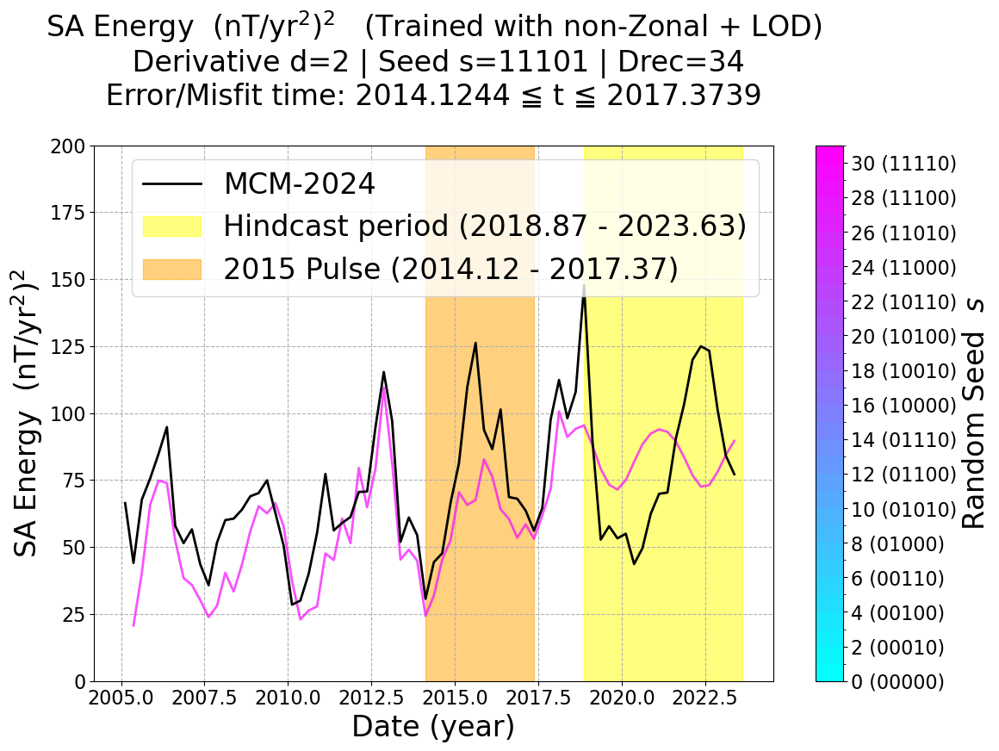

In [63]:
# plot SA Energy series for s=29
for diff in [2]:

    fig, ax = plt.subplots(1, 1, figsize=(12, 9))

    cmap = mpl.colormaps['cool']
    norm = BoundaryNorm(plot_table.columns, cmap.N)
    seed_l = plot_table.columns[0:31:2]

    for s in [29]:
        b_seed = format(s, '05b')
        hindcast = np.load(f".{save_dir}/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)

        SA_time = hindcast['time_memo'] - 0.2502  # adjust time for SA leapfrog
        SA_memo = hindcast['d2g_memo'][:J-1] # RNN prediction of SA (exclude LOD at the end J-1)

        SA_memo = if_nan_SAgenerate(SA_memo, hindcast, diff=diff)
        SA_memo, nZcolumns = remove_zonal_g(SA_memo, hindcast['columns'][:J-1])

        SA_Energy_col = get_energy(SA_memo, SA_time, nZcolumns)
        SA_Energy_tot = SA_Energy_col[1:, :].sum(axis=0)

        # print(SA_Energy_col[0, :], SA_Energy_tot)

        ax.plot(SA_Energy_col[0, :], SA_Energy_tot, 
                c=cmap(norm(s)), alpha=0.7)


    SA_ref = coef_raw[2].loc[hindcast['time_memo'], :].values.T # Reference SA time series
    SA_Energy_ref_col = get_energy(SA_ref, hindcast['time_memo'] - 0.2502, nZcolumns)
    SA_Energy_ref_tot = SA_Energy_ref_col[1:, :].sum(axis=0)
    ax.plot(SA_Energy_ref_col[0, :], SA_Energy_ref_tot, c='black', label='MCM-2024')


    p = ax.scatter([np.nan]*32, [np.nan]*32, cmap=cmap, norm=norm, c=range(32), alpha=1.0, marker='none')
    ax.colorbar = plt.colorbar(p, ax=ax)
    ax.colorbar.set_label(r"Random Seed  $s$", fontsize=f_large)
    # print([f"{seed} ({format(seed, '05b')})" for seed in seed_l])
    ax.colorbar.set_ticks                                                    (seed_l)
    ax.colorbar.set_ticklabels([f"{seed} ({format(seed, '05b')})" for seed in seed_l])


    ymin, ymax = 0, 200
    ax.set_ylim(ymin, ymax)

    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=fS) & (hindcast['time_memo']<=fE), 
                    color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')
    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=TS-0.2502) & (hindcast['time_memo']<=TE-0.2502), 
                    color='orange', alpha=0.5, label=f'2015 Pulse ({TS-0.25:.2f} - {TE-0.25:.2f})')

    ax.set_xlabel('Date (year)', fontsize=f_large)
    ax.set_ylabel(r"SA Energy  (nT/yr$^2$)$^2$", fontsize=f_large)
    ax.set_title(r"SA Energy  (nT/yr$^2$)$^2$   (Trained with non-Zonal + LOD)" + 
                f"\n Derivative d={diff} | Seed s=11101 | Drec=34" + 
                f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
                fontsize=f_large)
    ax.legend(fontsize=f_large)
    plt.tight_layout()
    plt.show()

# ちょっと、Zonal成分のresultも含めてプロットしてみる

## Load MCM model


In [64]:
J = 195 # Number of Gauss coefficients up to degree n=13, including zonal terms
print("J =", J)

d0g_raw = pd.read_csv  (f"{mcm_load}/coef_g.csv")  
d1g_raw = pd.read_csv(f"{mcm_load}/coef_d1g.csv")
d2g_raw = pd.read_csv(f"{mcm_load}/coef_d2g.csv")

d0g_raw.set_index('YEAR', inplace=True)
d1g_raw.set_index('YEAR', inplace=True)
d2g_raw.set_index('YEAR', inplace=True)

d0R_raw = np.load  (f"{mcm_load}/cvar_R.npy")  
d1R_raw = np.load(f"{mcm_load}/cvar_d1R.npy")
d2R_raw = np.load(f"{mcm_load}/cvar_d2R.npy")

display(d2g_raw.head())
print(d2R_raw[0:5,0:5, 0])
print(d2R_raw[0:5,0:5, 1])
print(d2R_raw[0:5,0:5, 2])
print(d2R_raw[0:5,0:5, 3])
print(d2R_raw[0:5,0:5, -1])

J = 195


,"g(1,0)","g(1,1)","h(1,1)","g(2,0)","g(2,1)","h(2,1)","g(2,2)","h(2,2)","g(3,0)","g(3,1)",...,"g(18,14)","h(18,14)","g(18,15)","h(18,15)","g(18,16)","h(18,16)","g(18,17)","h(18,17)","g(18,18)","h(18,18)"
YEAR,,,,,,,,,,,,,,,,,,,,,
2004.87390,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005.12370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005.37390,-1.30880,2.22560,-0.89280,-0.17440,-0.08800,-0.74240,1.53120,0.15680,-0.06880,0.20320,...,-0.00160,-0.00000,-0.00000,-0.00000,0.00160,0.00000,0.00160,0.00000,0.00160,-0.00160
2005.62410,-0.00000,1.10080,-0.70560,0.47520,-0.55680,-0.27360,1.43360,0.30720,-0.10240,-0.53280,...,0.00160,0.00000,0.00000,0.00000,-0.00160,-0.00000,-0.00160,-0.00160,-0.00160,0.00160
2005.87420,-0.78560,1.80640,-1.30880,0.81440,-0.77440,-0.56000,2.16160,1.32000,0.09280,0.14880,...,-0.00160,-0.00000,-0.00160,-0.00160,0.00000,0.00160,0.00000,0.00160,0.00000,-0.00000


[[2004.87400        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]]
[[2005.12400        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]
 [       nan        nan        nan        nan        nan]]
[[2005.37400        nan        nan        nan        nan]
 [       nan   36.30865   -0.34635   -0.11209    1.66008]
 [       nan   -0.34635   20.52914   -0.11124   -0.04573]
 [       nan   -0.11209   -0.11124   25.27605    0.14777]
 [       nan    1.66008   -0.04573    0.14777   18.48007]]
[[2005.62400        nan        nan        nan        nan]
 [       nan   36.29873   -0.34612   -0.11215    1.66007]
 [       na

In [65]:
coef_raw    = [d0g_raw.iloc[:, :J], d1g_raw.iloc[:, :J], d2g_raw.iloc[:, :J]]
Rmatrix_raw = [d0R_raw[:J+1, :J+1, :], d1R_raw[:J+1, :J+1, :], d2R_raw[:J+1, :J+1, :]]

col_raw = coef_raw[0].columns.tolist()
time_raw = coef_raw[0].index.values

print(col_raw)
print(time_raw)
print(d0R_raw[0, 0, :])

['g(1,0)', 'g(1,1)', 'h(1,1)', 'g(2,0)', 'g(2,1)', 'h(2,1)', 'g(2,2)', 'h(2,2)', 'g(3,0)', 'g(3,1)', 'h(3,1)', 'g(3,2)', 'h(3,2)', 'g(3,3)', 'h(3,3)', 'g(4,0)', 'g(4,1)', 'h(4,1)', 'g(4,2)', 'h(4,2)', 'g(4,3)', 'h(4,3)', 'g(4,4)', 'h(4,4)', 'g(5,0)', 'g(5,1)', 'h(5,1)', 'g(5,2)', 'h(5,2)', 'g(5,3)', 'h(5,3)', 'g(5,4)', 'h(5,4)', 'g(5,5)', 'h(5,5)', 'g(6,0)', 'g(6,1)', 'h(6,1)', 'g(6,2)', 'h(6,2)', 'g(6,3)', 'h(6,3)', 'g(6,4)', 'h(6,4)', 'g(6,5)', 'h(6,5)', 'g(6,6)', 'h(6,6)', 'g(7,0)', 'g(7,1)', 'h(7,1)', 'g(7,2)', 'h(7,2)', 'g(7,3)', 'h(7,3)', 'g(7,4)', 'h(7,4)', 'g(7,5)', 'h(7,5)', 'g(7,6)', 'h(7,6)', 'g(7,7)', 'h(7,7)', 'g(8,0)', 'g(8,1)', 'h(8,1)', 'g(8,2)', 'h(8,2)', 'g(8,3)', 'h(8,3)', 'g(8,4)', 'h(8,4)', 'g(8,5)', 'h(8,5)', 'g(8,6)', 'h(8,6)', 'g(8,7)', 'h(8,7)', 'g(8,8)', 'h(8,8)', 'g(9,0)', 'g(9,1)', 'h(9,1)', 'g(9,2)', 'h(9,2)', 'g(9,3)', 'h(9,3)', 'g(9,4)', 'h(9,4)', 'g(9,5)', 'h(9,5)', 'g(9,6)', 'h(9,6)', 'g(9,7)', 'h(9,7)', 'g(9,8)', 'h(9,8)', 'g(9,9)', 'h(9,9)', 'g(10,0)'

In [66]:
print(f"target_epoch = {TS} - {TE}")
CF_ref = coef_raw[0].loc[TS:TE, :].values.T # Reference CF at target_epoch
SV_ref = coef_raw[1].loc[TS:TE, :].values.T # Reference SV at target_epoch
SA_ref = coef_raw[2].loc[TS:TE, :].values.T # Reference SA at target_epoch
TG_ref = SA_ref # target field
print(TG_ref.shape, "\n", TG_ref[:5])

target_epoch = 2014.3745999999999 - 2017.6241
(195, 14) 
 [[-0.26080 -0.26240 -1.04800 -0.52320 -2.61760 -0.00160 -1.30720 -1.57280
  -1.57120  0.26240 -1.30880 -1.57280 -1.04640 -0.52320]
 [-0.84160 -1.54400 -1.83680 -3.33120 -2.93760 -3.03680 -4.02880 -4.25760
  -2.65600 -3.20320 -3.54720 -2.68320 -1.98400 -1.60800]
 [ 0.86560  0.15680 -0.62880 -0.57600 -1.70240 -2.88000 -2.77600 -0.81280
  -1.46560 -1.59680 -0.02560  0.78400  0.36800  0.88960]
 [ 0.37120  0.20160  0.52960 -0.21440 -1.21760  0.88800  0.51520 -1.20320
  -0.50080  1.51840 -0.35840 -1.43200 -0.80160 -0.66080]
 [-1.04640 -1.46240 -1.65920 -0.34560 -0.19840 -1.87840 -1.68960  0.93120
   0.81760 -1.89280 -0.97280 -0.17120 -1.21920 -1.46080]]


In [67]:
yZyZ_nLOD_SAddP = pd.DataFrame(index=np.arange(0, 5), columns=np.arange(0, 32), dtype=float)
save_dir = "./trained_models/2025_1017_Zonal"

for d_max in range(5):
    for seed in range(0, 32):
        b_seed = format(seed, '05b') # seed No. as 5-bit binary

        filename = f"d{d_max}g_{Drec}_{b_seed}_geomag_memos.npz"

        read_file = f".{save_dir}/{filename}"

        print(f"reading {(d_max, Drec, b_seed)}: ", end="")

        pred_memos = np.load(read_file, allow_pickle=True)
        print(f"loaded --> ", end="\n")
        
        CF_time = pred_memos['time_memo']   # time - leap frog
        CF_cols = pred_memos['columns'][:J] # target field columns
        SA_memo = pred_memos['d2g_memo'] # RNN prediction of SA

        SA_memo = if_nan_SAgenerate(SA_memo, pred_memos, diff=d_max)

        TG_memo = SA_memo[:J, :] # target field

        print(f"time={CF_time.shape}, shape={TG_memo.shape} --> ", end="")

        # t_idx = np.where(CF_time == target_epoch)[0][0]
        # print(f"t_idx={fE_idx} --> ", end="")

        # 範囲インデックス配列の作成
        tS_idx = np.abs(CF_time - TS).argmin()
        tE_idx = np.abs(CF_time - TE).argmin()
        t_indices = np.arange(tS_idx, tE_idx + 1)
        print(f"t_indices from {tS_idx} to {tE_idx} ({len(t_indices)} points) --> ", end="")

        TG_rnn = TG_memo[:, t_indices] # multiple time steps
        error = TG_rnn - TG_ref
        print("error.shape: ", error.shape, len(CF_cols), "--> ", end="")
        
        ddP2 = get_energy(error, CF_time[t_indices], CF_cols)
        # print("ddP2:", ddP2)
        print("ddP2.shape", ddP2.shape, len(CF_cols), "--> ", end="")
        sqrtddP = np.sqrt(np.trapz(ddP2[1:, :].sum(axis=0), CF_time[t_indices])) # integrate over time

        print(f"sqrt(ddP)={sqrtddP:.4f} nT --> ", end="")
        yZyZ_nLOD_SAddP.loc[d_max, seed] = sqrtddP

        print("ddP table done", end="\n")


reading (0, 34, '00000'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(195, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (195, 14) 195 --> ddP2.shape (14, 14) 195 --> sqrt(ddP)=13.4996 nT --> ddP table done
reading (0, 34, '00001'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(195, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (195, 14) 195 --> ddP2.shape (14, 14) 195 --> sqrt(ddP)=13.4996 nT --> ddP table done
reading (0, 34, '00010'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(195, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (195, 14) 195 --> ddP2.shape (14, 14) 195 --> sqrt(ddP)=13.4996 nT --> ddP table done
reading (0, 34, '00011'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(195, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (195, 

In [68]:
display(yZyZ_nLOD_SAddP.T)
display(yZyZ_nLOD_SAddP.T.describe())

,0,1,2,3,4
0,13.49959,32.16720,5.08346,9.36485,17.98435
1,13.49959,65.66804,4.16018,8.97314,17.93153
2,13.49959,78.92629,4.63159,9.72802,18.03058
3,13.49959,42.99546,4.91129,9.70379,18.14683
4,13.49959,11.13810,4.57330,9.14998,17.98981
5,13.49959,17.20505,5.04796,9.36779,17.89708
6,13.49959,110.20983,5.80419,9.04657,18.08186
7,13.49959,13.93951,4.82438,9.35904,18.09831
8,13.49959,13.87430,4.70114,9.14257,17.93078
9,13.49959,13.72944,4.74387,9.02662,17.89157


,0,1,2,3,4
count,32.00000,32.00000,32.00000,32.00000,32.00000
mean,13.49959,44.92476,4.88396,9.23593,17.96564
std,0.00000,58.70954,0.47031,0.27495,0.08050
min,13.49959,7.52708,4.10013,8.75534,17.84029
25%,13.49959,13.72822,4.61394,9.05267,17.91057
50%,13.49959,15.57228,4.81589,9.14744,17.95682
75%,13.49959,62.06536,5.08561,9.38818,18.00465
max,13.49959,310.17167,6.22615,9.81473,18.14683


  --> NaN found in SA_memo, generating SA from CF series...


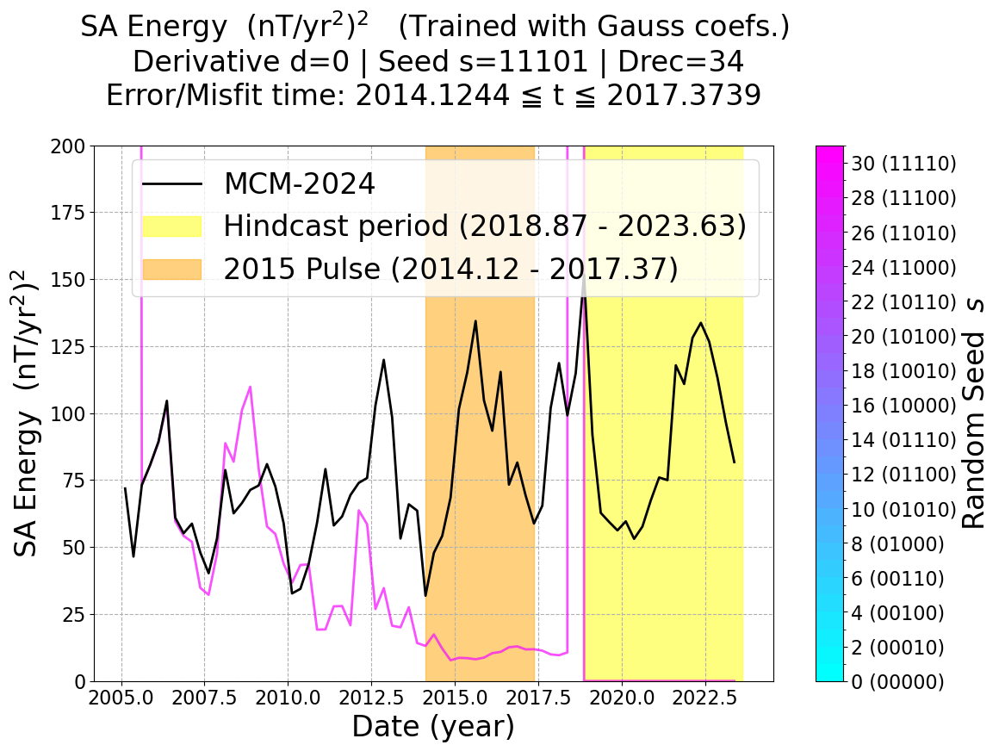

  --> NaN found in SA_memo, generating SA from SV series...


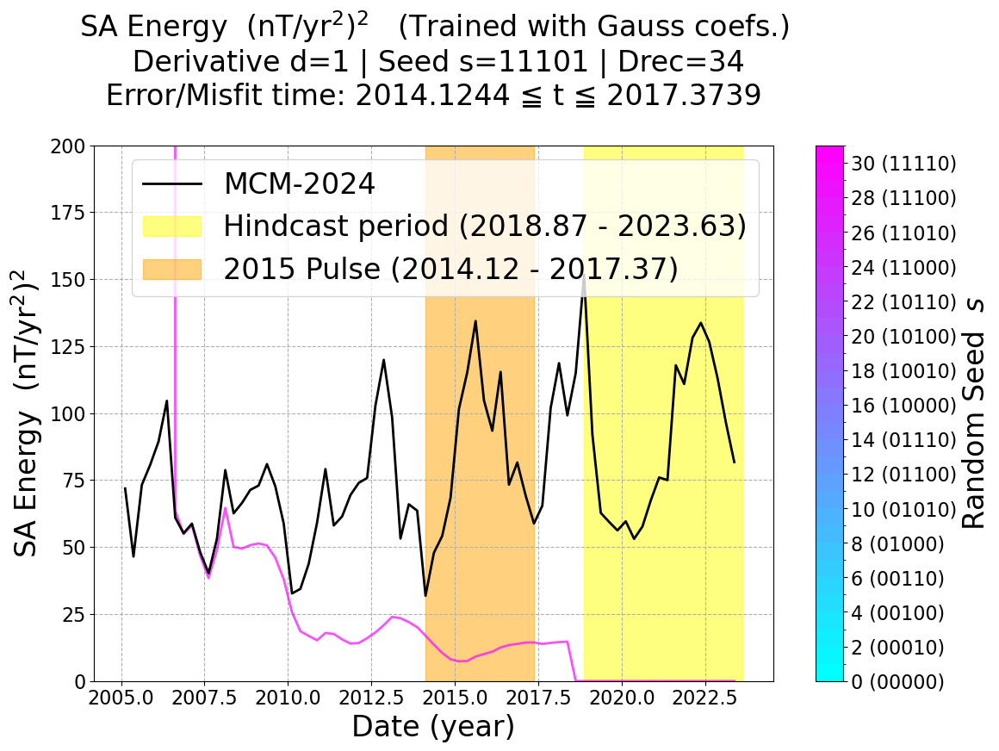

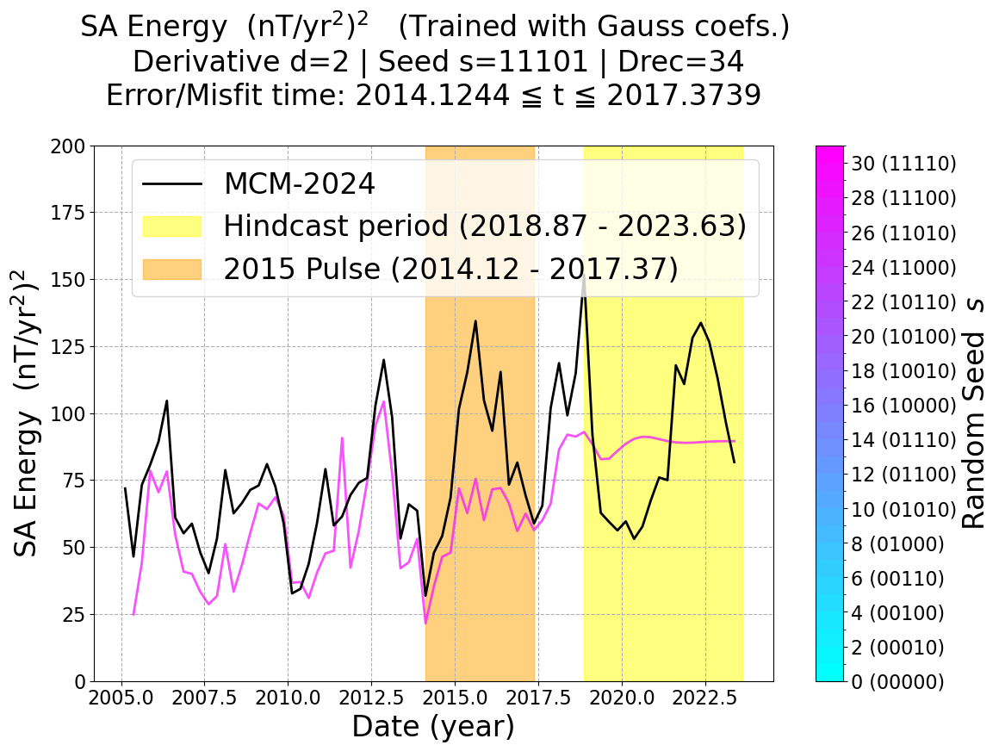

In [69]:
# plot SA Energy series for s=29
for diff in [0, 1, 2]:

    fig, ax = plt.subplots(1, 1, figsize=(12, 9))

    cmap = mpl.colormaps['cool']
    norm = BoundaryNorm(plot_table.columns, cmap.N)
    seed_l = plot_table.columns[0:31:2]

    for s in [29]:
        b_seed = format(s, '05b')
        hindcast = np.load(f".{save_dir}/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)

        SA_time = hindcast['time_memo'] - 0.2502  # adjust time for SA leapfrog
        SA_memo = hindcast['d2g_memo'] # RNN prediction of SA

        SA_memo = if_nan_SAgenerate(SA_memo, hindcast, diff=diff)

        SA_Energy_col = get_energy(SA_memo[:J, :], SA_time, hindcast['columns'][:J])
        SA_Energy_tot = SA_Energy_col[1:, :].sum(axis=0)

        # print(SA_Energy_col[0, :], SA_Energy_tot)

        ax.plot(SA_Energy_col[0, :], SA_Energy_tot, 
                c=cmap(norm(s)), alpha=0.7)


    SA_ref = coef_raw[2].loc[hindcast['time_memo'], :].values.T # Reference SA time series
    SA_Energy_ref_col = get_energy(SA_ref, hindcast['time_memo'] - 0.2502, hindcast['columns'][:J])
    SA_Energy_ref_tot = SA_Energy_ref_col[1:, :].sum(axis=0)
    ax.plot(SA_Energy_ref_col[0, :], SA_Energy_ref_tot, c='black', label='MCM-2024')


    p = ax.scatter([np.nan]*32, [np.nan]*32, cmap=cmap, norm=norm, c=range(32), alpha=1.0, marker='none')
    ax.colorbar = plt.colorbar(p, ax=ax)
    ax.colorbar.set_label(r"Random Seed  $s$", fontsize=f_large)
    # print([f"{seed} ({format(seed, '05b')})" for seed in seed_l])
    ax.colorbar.set_ticks                                                    (seed_l)
    ax.colorbar.set_ticklabels([f"{seed} ({format(seed, '05b')})" for seed in seed_l])


    ymin, ymax = 0, 200
    ax.set_ylim(ymin, ymax)

    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=fS) & (hindcast['time_memo']<=fE), 
                    color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')
    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=TS-0.2502) & (hindcast['time_memo']<=TE-0.2502), 
                    color='orange', alpha=0.5, label=f'2015 Pulse ({TS-0.25:.2f} - {TE-0.25:.2f})')

    ax.set_xlabel('Date (year)', fontsize=f_large)
    ax.set_ylabel(r"SA Energy  (nT/yr$^2$)$^2$", fontsize=f_large)
    ax.set_title(r"SA Energy  (nT/yr$^2$)$^2$   (Trained with Gauss coefs.)" + 
                f"\n Derivative d={diff} | Seed s=11101 | Drec=34" + 
                f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
                fontsize=f_large)
    ax.legend(fontsize=f_large)
    plt.tight_layout()
    plt.show()

In [70]:
### Compute ddP table
yZyZ_yLOD_SAddP = pd.DataFrame(index=np.arange(0, 5), columns=np.arange(0, 32), dtype=float)

save_dir = "./trained_models/2025_1108_LODZonal"
for d_max in range(5):
    for seed in range(0, 32):
        b_seed = format(seed, '05b') # seed No. as 5-bit binary

        filename = f"d{d_max}g_{Drec}_{b_seed}_geomag_memos.npz"

        read_file = f".{save_dir}/{filename}"

        print(f"reading {(d_max, Drec, b_seed)}: ", end="")

        try:
            pred_memos = np.load(read_file, allow_pickle=True)
        except Exception as e:
            print(f"Error loading {read_file}: {e}")
            continue
        
        print(f"loaded --> ", end="\n")
        
        CF_time = pred_memos['time_memo']       # time - leap frog
        CF_cols = pred_memos['columns'][:J]   # target field columns, exclude LOD at the end
        SA_memo = pred_memos['d2g_memo']        # RNN prediction of SA

        SA_memo = if_nan_SAgenerate(SA_memo, pred_memos, diff=d_max)

        TG_memo = SA_memo[:J, :] # target field (exclude LOD at the end)

        print(f"time={CF_time.shape}, shape={TG_memo.shape} --> ", end="")

        # t_idx = np.where(CF_time == target_epoch)[0][0]
        # print(f"t_idx={fE_idx} --> ", end="")

        # 範囲インデックス配列の作成
        tS_idx = np.abs(CF_time - TS).argmin()
        tE_idx = np.abs(CF_time - TE).argmin()
        t_indices = np.arange(tS_idx, tE_idx + 1)
        print(f"t_indices from {tS_idx} to {tE_idx} ({len(t_indices)} points) --> ", end="")

        TG_rnn = TG_memo[:, t_indices] # multiple time steps
        error  = TG_rnn - TG_ref
        print("error.shape: ", error.shape, len(CF_cols), "--> ", end="")
        
        ddP2 = get_energy(error, CF_time[t_indices], CF_cols)
        # print("ddP2:", ddP2)
        print("ddP2.shape", ddP2.shape, len(CF_cols), "--> ", end="")
        sqrtddP = np.sqrt(np.trapz(ddP2[1:, :].sum(axis=0), CF_time[t_indices])) # integrate over time

        print(f"sqrt(ddP)={sqrtddP:.4f} nT --> ", end="")
        yZyZ_yLOD_SAddP.loc[d_max, seed] = sqrtddP

        print("ddP table done", end="\n")


reading (0, 34, '00000'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(195, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (195, 14) 195 --> ddP2.shape (14, 14) 195 --> sqrt(ddP)=13.4996 nT --> ddP table done
reading (0, 34, '00001'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(195, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (195, 14) 195 --> ddP2.shape (14, 14) 195 --> sqrt(ddP)=13.4996 nT --> ddP table done
reading (0, 34, '00010'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(195, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (195, 14) 195 --> ddP2.shape (14, 14) 195 --> sqrt(ddP)=13.4996 nT --> ddP table done
reading (0, 34, '00011'): loaded --> 
  --> NaN found in SA_memo, generating SA from CF series...
time=(76,), shape=(195, 76) --> t_indices from 38 to 51 (14 points) --> error.shape:  (195, 

In [71]:
display(yZyZ_yLOD_SAddP.T)
display(yZyZ_yLOD_SAddP.T.describe())

,0,1,2,3,4
0,13.49959,19.30510,5.08365,9.20361,18.08395
1,13.49959,44.53736,5.50484,8.74830,18.00024
2,13.49959,57.30042,5.17329,8.81846,17.95671
3,13.49959,26.95208,3.86891,9.31277,18.21705
4,13.49959,4.82225,5.67476,9.24399,17.97795
5,13.49959,20.89649,4.84299,8.84731,17.98650
6,13.49959,171.20880,6.52285,9.34461,17.98053
7,13.49959,13.93947,5.57138,9.27675,18.03507
8,13.49959,7.13748,4.61540,9.69339,18.06092
9,13.49959,16.26397,5.11281,9.19119,17.96309


,0,1,2,3,4
count,29.00000,29.00000,29.00000,29.00000,28.00000
mean,13.49959,44.14434,5.11266,9.09605,18.05972
std,0.00000,67.68665,0.54283,0.25507,0.12398
min,13.49959,4.82225,3.86891,8.73560,17.91842
25%,13.49959,13.71493,4.80948,8.85019,17.97728
50%,13.49959,16.26397,5.11281,9.16209,18.03140
75%,13.49959,44.53736,5.51382,9.25762,18.08530
max,13.49959,333.58772,6.52285,9.69339,18.43023


  --> NaN found in SA_memo, generating SA from CF series...


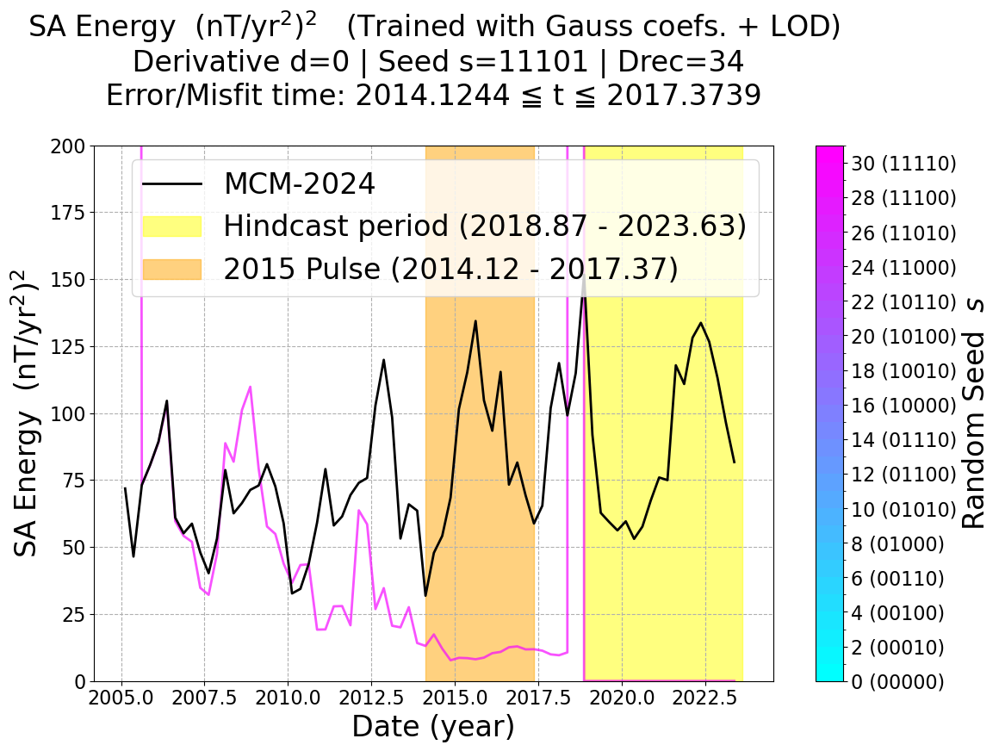

  --> NaN found in SA_memo, generating SA from SV series...


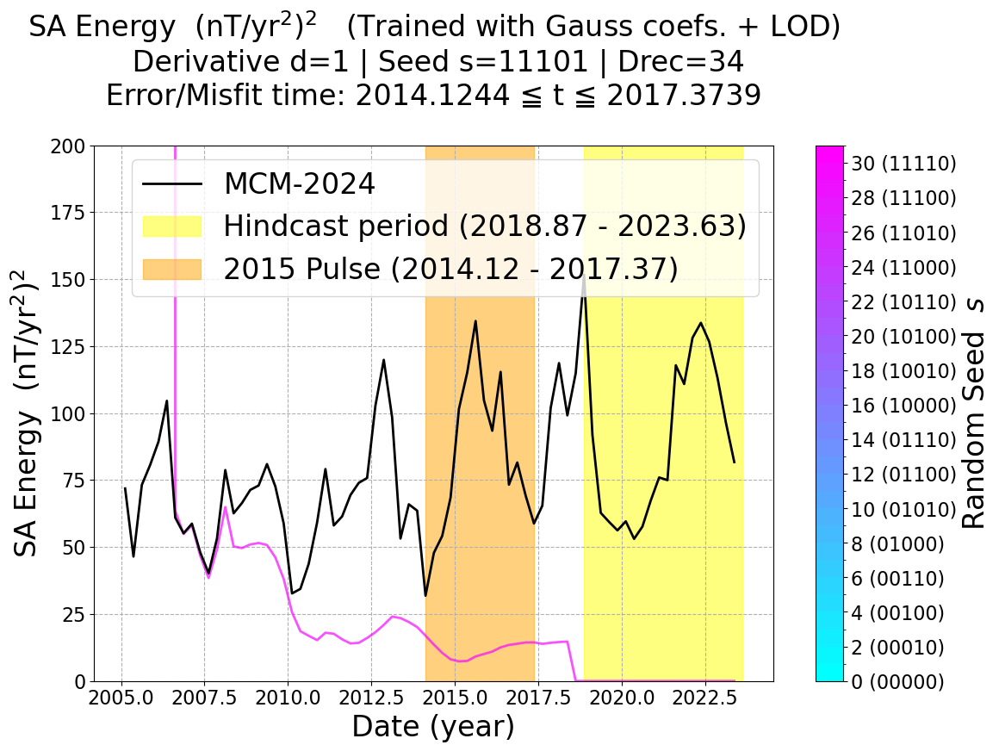

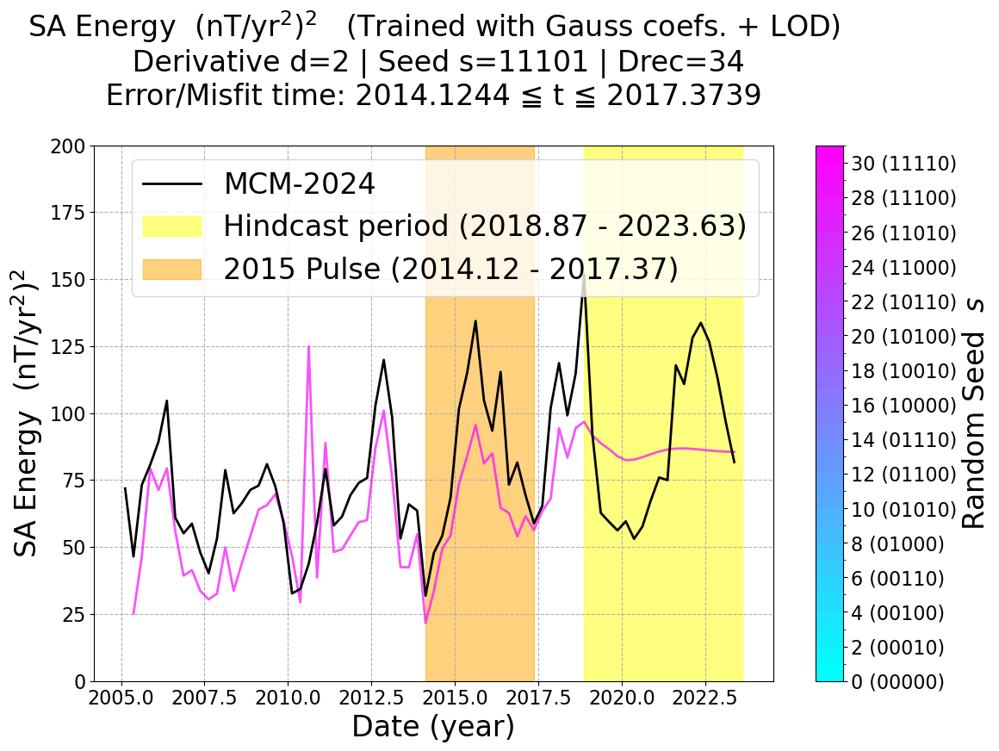

In [72]:
# plot SA Energy series for s=29
for diff in [0, 1, 2]:

    fig, ax = plt.subplots(1, 1, figsize=(12, 9))

    cmap = mpl.colormaps['cool']
    norm = BoundaryNorm(plot_table.columns, cmap.N)
    seed_l = plot_table.columns[0:31:2]

    for s in [29]:
        b_seed = format(s, '05b')
        hindcast = np.load(f".{save_dir}/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)

        SA_time = hindcast['time_memo'] - 0.2502  # adjust time for SA leapfrog
        SA_memo = hindcast['d2g_memo'] # RNN prediction of SA

        SA_memo = if_nan_SAgenerate(SA_memo, hindcast, diff=diff)

        SA_Energy_col = get_energy(SA_memo[:J, :], SA_time, hindcast['columns'][:J])
        SA_Energy_tot = SA_Energy_col[1:, :].sum(axis=0)

        # print(SA_Energy_col[0, :], SA_Energy_tot)

        ax.plot(SA_Energy_col[0, :], SA_Energy_tot, 
                c=cmap(norm(s)), alpha=0.7)


    SA_ref = coef_raw[2].loc[hindcast['time_memo'], :].values.T # Reference SA time series
    SA_Energy_ref_col = get_energy(SA_ref, hindcast['time_memo'] - 0.2502, hindcast['columns'][:J])
    SA_Energy_ref_tot = SA_Energy_ref_col[1:, :].sum(axis=0)
    ax.plot(SA_Energy_ref_col[0, :], SA_Energy_ref_tot, c='black', label='MCM-2024')


    p = ax.scatter([np.nan]*32, [np.nan]*32, cmap=cmap, norm=norm, c=range(32), alpha=1.0, marker='none')
    ax.colorbar = plt.colorbar(p, ax=ax)
    ax.colorbar.set_label(r"Random Seed  $s$", fontsize=f_large)
    # print([f"{seed} ({format(seed, '05b')})" for seed in seed_l])
    ax.colorbar.set_ticks                                                    (seed_l)
    ax.colorbar.set_ticklabels([f"{seed} ({format(seed, '05b')})" for seed in seed_l])


    ymin, ymax = 0, 200
    ax.set_ylim(ymin, ymax)

    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=fS) & (hindcast['time_memo']<=fE), 
                    color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')
    ax.fill_between(hindcast['time_memo'], ymin, ymax, 
                    where=(hindcast['time_memo']>=TS-0.2502) & (hindcast['time_memo']<=TE-0.2502), 
                    color='orange', alpha=0.5, label=f'2015 Pulse ({TS-0.25:.2f} - {TE-0.25:.2f})')

    ax.set_xlabel('Date (year)', fontsize=f_large)
    ax.set_ylabel(r"SA Energy  (nT/yr$^2$)$^2$", fontsize=f_large)
    ax.set_title(r"SA Energy  (nT/yr$^2$)$^2$   (Trained with Gauss coefs. + LOD)" + 
                f"\n Derivative d={diff} | Seed s=11101 | Drec=34" + 
                f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
                fontsize=f_large)
    ax.legend(fontsize=f_large)
    plt.tight_layout()
    plt.show()

## SA time series plot

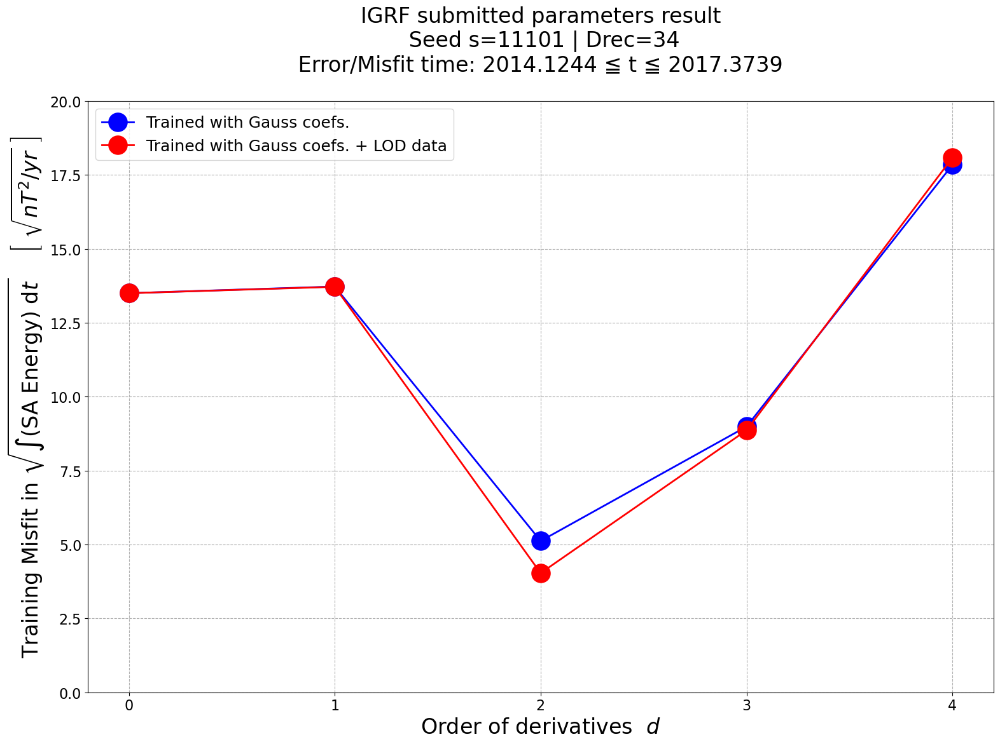

In [73]:
fig, ax = plt.subplots(1, 1, figsize=(16, 12))

ax.plot(yZyZ_nLOD_SAddP.index, yZyZ_nLOD_SAddP.loc[:, IGRF_s].values, 
        marker="o", markersize=20, markeredgewidth=2, linestyle="-", linewidth=2.0, color="blue", 
        markerfacecolor='blue', markeredgecolor='blue', 
        label="Trained with Gauss coefs.")

ax.plot(yZyZ_yLOD_SAddP.index, yZyZ_yLOD_SAddP.loc[:, IGRF_s].values, 
        marker="o", markersize=20, markeredgewidth=2, linestyle="-", linewidth=2.0, color="red", 
        markerfacecolor='red', markeredgecolor='red', 
        label="Trained with Gauss coefs. + LOD data")

ax.set_xticks(range(5))
ax.set_ylim(0, 20)
# ax.set_yscale('log')
ax.set_xlabel(r"Order of derivatives  $d$", fontsize=f_large)
ax.set_ylabel(r"Training Misfit in $\sqrt{\int (\mathrm{SA \ Energy}) \ \mathrm{d}t}$    $\left[ \ \sqrt{nT^2/yr} \ \right]$", fontsize=f_large)

ax.set_title(f"IGRF submitted parameters result" + 
             "\n Seed s=11101 | Drec=34" + 
             f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
             fontsize=f_large)
plt.legend(fontsize=f_medium, loc='upper left')
plt.tight_layout()
plt.show()

Plotting for d=2, s=29 (11101)


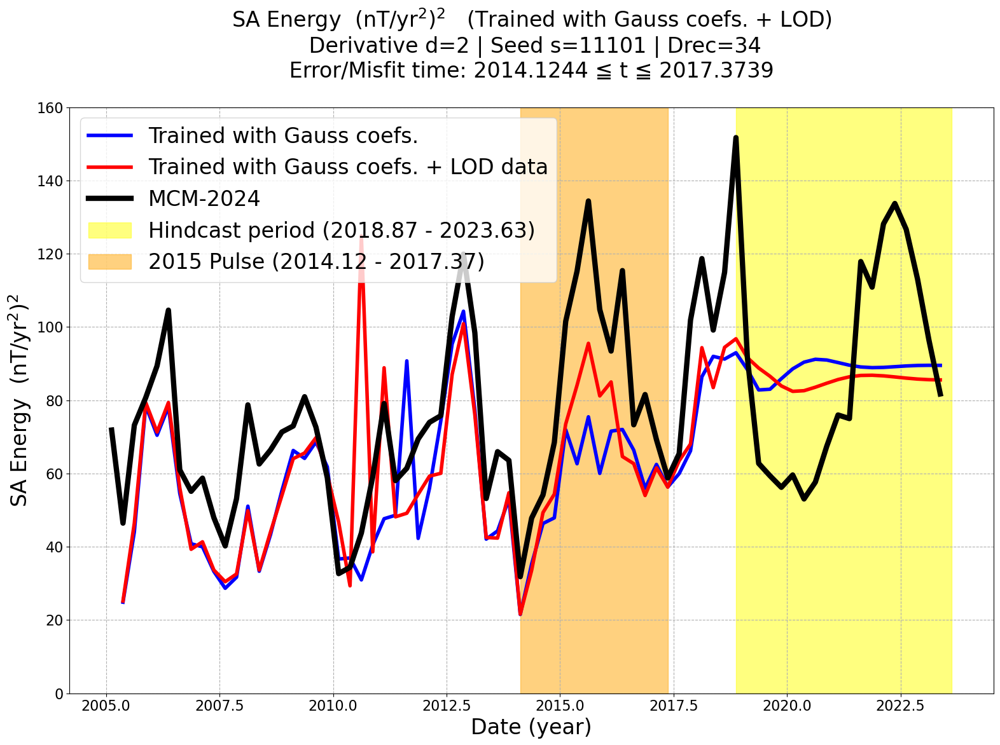

In [74]:
# plot SA Energy series for s=29
diff = 2
s = 29
b_seed = format(s, '05b')
print(f"Plotting for d={diff}, s={s} ({b_seed})")

fig, ax = plt.subplots(1, 1, figsize=(16, 12))

## Trained without LOD ----------------------------------
nLOD = np.load(f"../trained_models/2025_1017_Zonal/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)

nLOD_SA_time = nLOD['time_memo'] - 0.2502  # adjust time for SA leapfrog
nLOD_SA_memo = nLOD['d2g_memo'] # RNN prediction of SA

nLOD_SA_Energy_col = get_energy(nLOD_SA_memo[:J, :], nLOD_SA_time, nLOD['columns'][:J])
nLOD_SA_Energy_tot = nLOD_SA_Energy_col[1:, :].sum(axis=0)

# print(SA_Energy_col[0, :], SA_Energy_tot)

ax.plot(nLOD_SA_Energy_col[0, :], nLOD_SA_Energy_tot, 
        color="blue", linewidth=4.0,
        label="Trained with Gauss coefs.")

## Trained with LOD ----------------------------------
yLOD = np.load(f"../trained_models/2025_1108_LODZonal/d{diff}g_{Drec}_{b_seed}_geomag_memos.npz", allow_pickle=True)

yLOD_SA_time = yLOD['time_memo'] - 0.2502  # adjust time for SA leapfrog
yLOD_SA_memo = yLOD['d2g_memo'] # RNN prediction of SA

yLOD_SA_Energy_col = get_energy(yLOD_SA_memo[:J, :], yLOD_SA_time, yLOD['columns'][:J])
yLOD_SA_Energy_tot = yLOD_SA_Energy_col[1:, :].sum(axis=0)

# print(SA_Energy_col[0, :], SA_Energy_tot)

ax.plot(yLOD_SA_Energy_col[0, :], yLOD_SA_Energy_tot, 
        color="red", linewidth=4.0,
        label="Trained with Gauss coefs. + LOD data")

## Reference ----------------------------------

SA_ref = coef_raw[2].loc[nLOD['time_memo'], :].values.T # Reference SA time series
SA_Energy_ref_col = get_energy(SA_ref, nLOD['time_memo'] - 0.2502, nLOD['columns'][:J])
SA_Energy_ref_tot = SA_Energy_ref_col[1:, :].sum(axis=0)
ax.plot(SA_Energy_ref_col[0, :], SA_Energy_ref_tot, 
        c='black', linewidth=6.0,
        label='MCM-2024')

ymin, ymax = 0, 160
ax.set_ylim(ymin, ymax)

ax.fill_between(nLOD['time_memo'], ymin, ymax, 
            where=(nLOD['time_memo']>=fS) & (nLOD['time_memo']<=fE), 
            color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')
ax.fill_between(nLOD['time_memo'], ymin, ymax, 
            where=(nLOD['time_memo']>=TS-0.2502) & (nLOD['time_memo']<=TE-0.2502), 
            color='orange', alpha=0.5, label=f'2015 Pulse ({TS-0.25:.2f} - {TE-0.25:.2f})')

ax.set_xlabel('Date (year)', fontsize=f_large)
ax.set_ylabel(r"SA Energy  (nT/yr$^2$)$^2$", fontsize=f_large)
ax.set_title(r"SA Energy  (nT/yr$^2$)$^2$   (Trained with Gauss coefs. + LOD)" + 
        f"\n Derivative d={diff} | Seed s=11101 | Drec=34" + 
        f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
        fontsize=f_large)
ax.legend(fontsize=f_large, loc='upper left')
plt.tight_layout()
plt.show()

        YEAR  avg_lod  std_lod
0 2004.87390  0.52648  0.41865
1 2005.12370  0.54272  0.39144
2 2005.37390  0.56549  0.38475
3 2005.62410  0.57278  0.39421
4 2005.87420  0.61620  0.43387


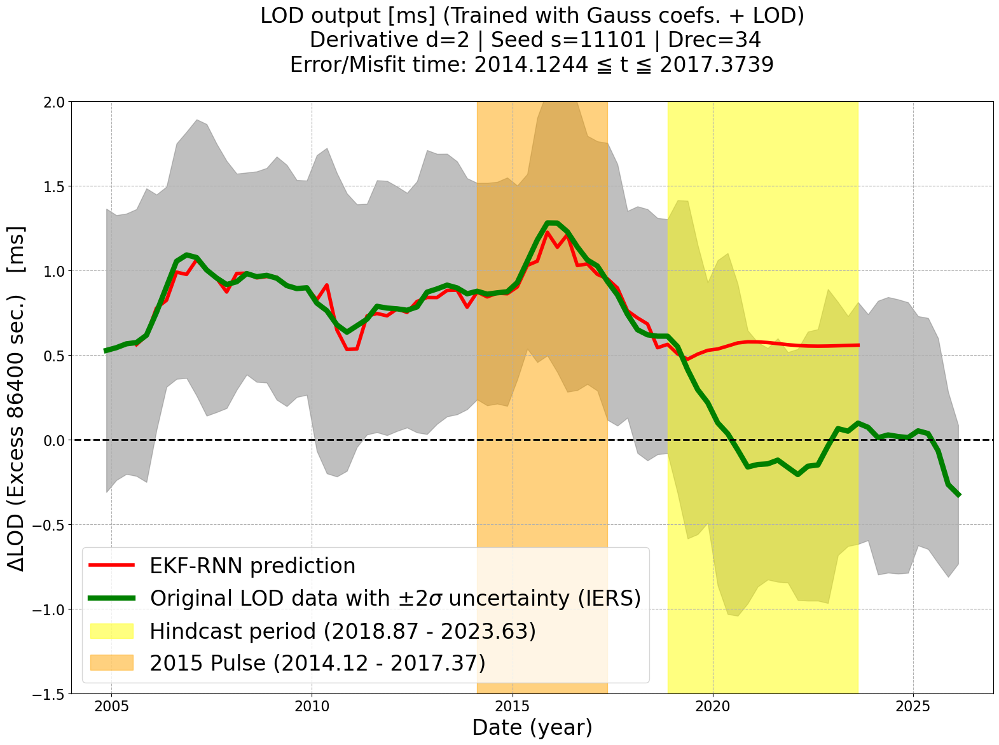

In [75]:
fig, ax = plt.subplots(1, 1, figsize=(16, 12))



ax.plot(yLOD['time_memo'], yLOD['d2g_memo'][-1, :], 
        color="red", linewidth=4.0,
        label="EKF-RNN prediction") # RNN prediction of LOD)

LOD_raw = pd.read_csv(f"{mcm_load}/lod.csv")
print(LOD_raw.head())

LOD_raw.set_index('YEAR', inplace=True)

ax.plot(LOD_raw.index.values, LOD_raw['avg_lod'].values,
        color="green", linewidth=6.0,
        label="Original LOD data with $\pm 2σ$ uncertainty (IERS)") # RNN prediction of LOD)

ax.fill_between(LOD_raw.index.values, 
                LOD_raw['avg_lod'].values - sig * LOD_raw['std_lod'].values,
                LOD_raw['avg_lod'].values + sig * LOD_raw['std_lod'].values,
                color='gray', alpha=0.5)

ymin, ymax = -1.5, 2.0
ax.set_ylim(ymin, ymax)

ax.fill_between(nLOD['time_memo'], ymin, ymax, 
            where=(nLOD['time_memo']>=fS) & (nLOD['time_memo']<=fE), 
            color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')
ax.fill_between(nLOD['time_memo'], ymin, ymax, 
            where=(nLOD['time_memo']>=TS-0.2502) & (nLOD['time_memo']<=TE-0.2502), 
            color='orange', alpha=0.5, label=f'2015 Pulse ({TS-0.25:.2f} - {TE-0.25:.2f})')

ax.plot([2000, 2030], [0, 0], 'k--', linewidth=2.0)
ax.set_xlim(2004, 2027)

ax.set_xlabel('Date (year)', fontsize=f_large)
ax.set_ylabel("ΔLOD (Excess 86400 sec.)   [ms]", fontsize=f_large)
ax.set_title(r"LOD output [ms] (Trained with Gauss coefs. + LOD)" + 
        f"\n Derivative d={diff} | Seed s=11101 | Drec=34" + 
        f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
        fontsize=f_large)
ax.legend(fontsize=f_large, loc='lower left')
plt.tight_layout()
plt.show()

        YEAR  avg_lod  std_lod
0 2004.87390  0.52648  0.41865
1 2005.12370  0.54272  0.39144
2 2005.37390  0.56549  0.38475
3 2005.62410  0.57278  0.39421
4 2005.87420  0.61620  0.43387


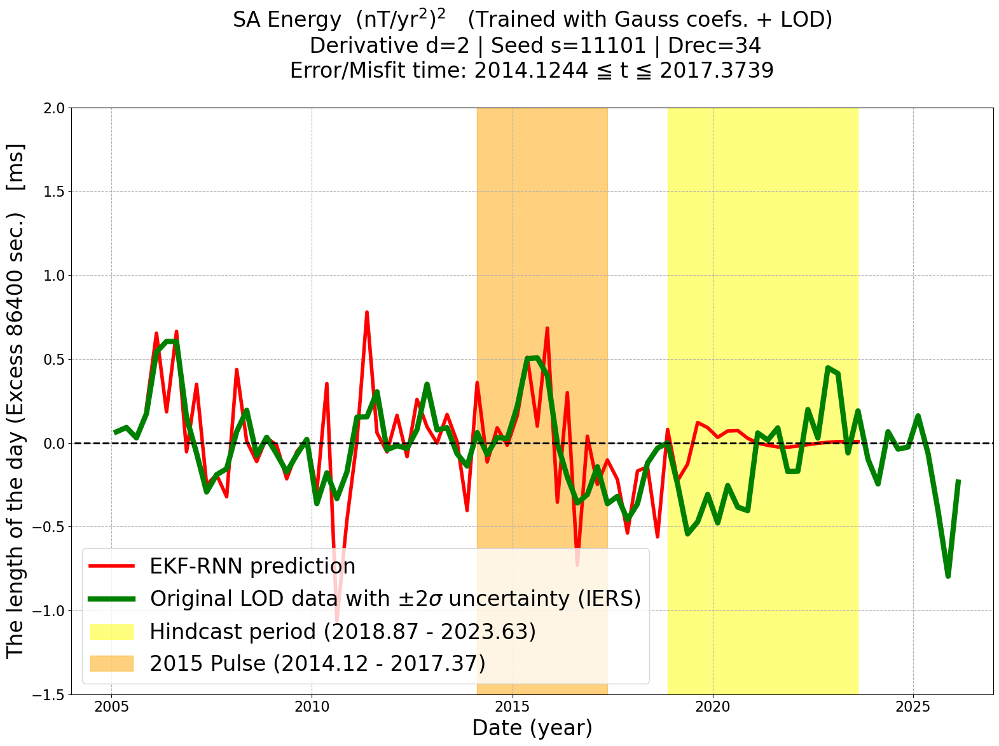

In [76]:
#d(lod)/dt

fig, ax = plt.subplots(1, 1, figsize=(16, 12))

ax.plot(yLOD['time_memo'][1:], np.diff(yLOD['d2g_memo'][-1, :]) / dt, 
        color="red", linewidth=4.0,
        label="EKF-RNN prediction") # RNN prediction of LOD)

LOD_raw = pd.read_csv(f"{mcm_load}/lod.csv")
print(LOD_raw.head())

LOD_raw.set_index('YEAR', inplace=True)

ax.plot(LOD_raw.index.values, LOD_raw['avg_lod'].diff().values / dt,
        color="green", linewidth=6.0,
        label="Original LOD data with $\pm 2σ$ uncertainty (IERS)") # RNN prediction of LOD)

ymin, ymax = -1.5, 2.0
ax.set_ylim(ymin, ymax)

ax.fill_between(nLOD['time_memo'], ymin, ymax, 
            where=(nLOD['time_memo']>=fS) & (nLOD['time_memo']<=fE), 
            color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')
ax.fill_between(nLOD['time_memo'], ymin, ymax, 
            where=(nLOD['time_memo']>=TS-0.2502) & (nLOD['time_memo']<=TE-0.2502), 
            color='orange', alpha=0.5, label=f'2015 Pulse ({TS-0.25:.2f} - {TE-0.25:.2f})')

ax.plot([2000, 2030], [0, 0], 'k--', linewidth=2.0)
ax.set_xlim(2004, 2027)

ax.set_xlabel('Date (year)', fontsize=f_large)
ax.set_ylabel("The length of the day (Excess 86400 sec.)   [ms]", fontsize=f_large)
ax.set_title(r"SA Energy  (nT/yr$^2$)$^2$   (Trained with Gauss coefs. + LOD)" + 
        f"\n Derivative d={diff} | Seed s=11101 | Drec=34" + 
        f"\n Error/Misfit time: {TS-0.2502:.4f} ≦ t ≦ {TE-0.2502:.4f} \n", 
        fontsize=f_large)
ax.legend(fontsize=f_large, loc='lower left')
plt.tight_layout()
plt.show()

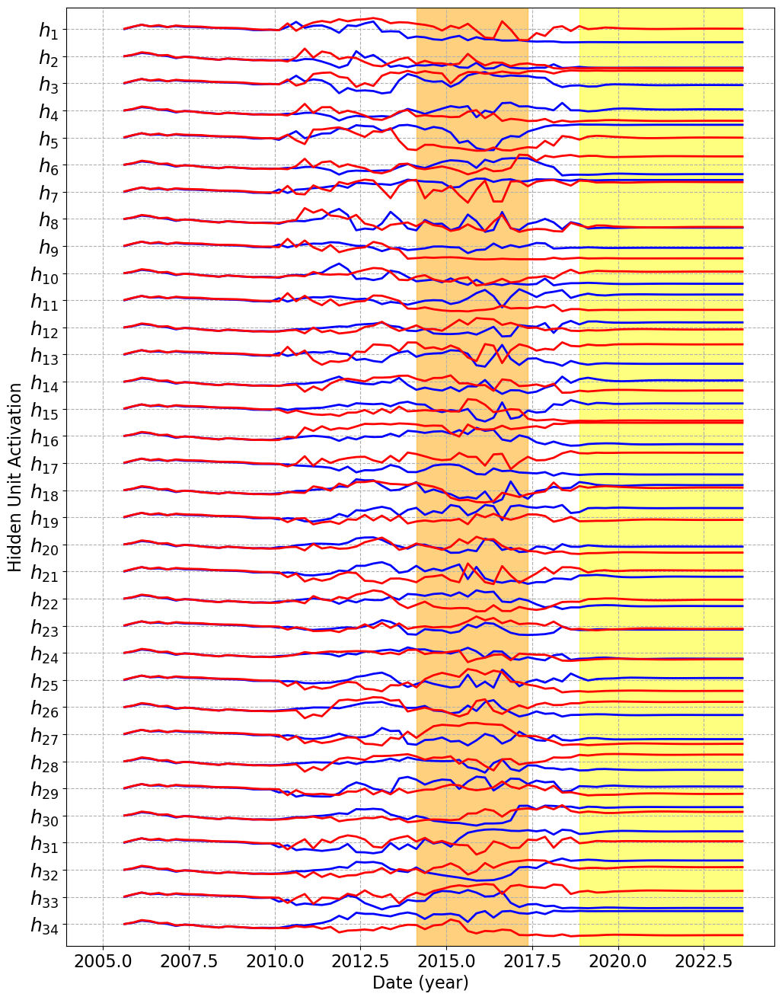

In [77]:
## Hidden layer states

fig, ax = plot_ht(nLOD["ht_memo"], nLOD['time_memo'], color="blue", fontsize=f_medium)

fig, ax = plot_ht(yLOD["ht_memo"], yLOD['time_memo'], color="red", fontsize=f_medium, fig_ax=(fig, ax))

ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, ymax)

ax.fill_between(nLOD['time_memo'], ymin, ymax, 
            where=(nLOD['time_memo']>=fS) & (nLOD['time_memo']<=fE), 
            color='yellow', alpha=0.5, label=f'Hindcast period ({fS:.2f} - {fE:.2f})')
ax.fill_between(nLOD['time_memo'], ymin, ymax, 
            where=(nLOD['time_memo']>=TS-0.2502) & (nLOD['time_memo']<=TE-0.2502), 
            color='orange', alpha=0.5, label=f'2015 Pulse ({TS-0.25:.2f} - {TE-0.25:.2f})')
plt.show()